# PROJECT SCRIPT (Group 1 pair of assets)

Common assumptions for strategies on group 1 assets:

-do not use in calculations the data from the first and last 10 minutes of the session (9:31-9:40 and 15:51-16:00) – put missing values there,
-do not hold positions overnight (exit all positions 20 minutes before the session end, i.e. at 15:40),
-do not trade within the first 25 minutes of stocks quotations (9:31-9:55), but DO use the data for 9:41-9:55 in calculations of signal, volatility

Common assumptions for startegy building:

Within each of the above groups of assets you can
-trade just a single asset, or
-put (selected) assets together in pair(s) as spreads, or
-trade each of selected assets separately and treat them as a portfolio (applying the same or different strategy for each asset).

If trading more than one asset (spread), remember to include positive transaction costs for each of them.

## DATA AND DEPENDECIES LOADING

In [2]:
# We load the necessary libraries

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import quantstats as qs
import statsmodels.api as sm
from statsmodels.regression.rolling import RollingOLS
from statsmodels.tsa.stattools import grangercausalitytests
from arch.unitroot import ADF, PhillipsPerron, KPSS
from sklearn.metrics import confusion_matrix
import warnings

# we ignore deprecation warnings and futurewarnings for cleaner output
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
# MUSISZ PRZEPUŚCIĆ KODY PRZEZ ZAGREGOWANY DATASET!

## EXPLORATION OF STRATEGIES

### Q1 2023 DATA INSPECTION

In [ ]:
#For now, let's narrow our analysis for Q2 2024 period
#data1 = pd.read_parquet(f'data/data1_2024_Q2.parquet')

In [334]:
#Aggregation of datasets
import pandas as pd

quarters = [
    '2023_Q1', '2023_Q3', '2023_Q4',
    '2024_Q2', '2024_Q4',
    '2025_Q1', '2025_Q2'
]

dfs = []

for quarter in quarters:
    print(f'Processing quarter: {quarter}')
    df = pd.read_parquet(f'data/data1_{quarter}.parquet')
    dfs.append(df)

# aggregate all quarters
data1 = pd.concat(dfs, axis=0)

# if datetime exists
data1['datetime'] = pd.to_datetime(data1['datetime'])
data1 = data1.sort_values('datetime').set_index('datetime')


Processing quarter: 2023_Q1
Processing quarter: 2023_Q3
Processing quarter: 2023_Q4
Processing quarter: 2024_Q2
Processing quarter: 2024_Q4
Processing quarter: 2025_Q1
Processing quarter: 2025_Q2


In [335]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 175812 entries, 2023-01-02 09:31:00+00:00 to 2025-06-30 16:00:00+00:00
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   NQ      175423 non-null  float64
 1   SP      175423 non-null  float64
dtypes: float64(2)
memory usage: 4.0 MB


In [336]:
data1.head()

,NQ,SP
datetime,,
2023-01-02 09:31:00+00:00,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN


In [337]:
# assumption 1
# do not use in calculations the data from the first and last 10 minutes 
# of the session (9:31-9:40 and 15:51-16:00) – put missing values there,

data1.loc[data1.between_time("9:31", "9:40").index] = np.nan
data1.loc[data1.between_time("15:51", "16:00").index] = np.nan


In [338]:
data1.describe()

,NQ,SP
count,166436.000000,166436.000000
mean,17658.851933,5104.543743
std,3261.890143,749.183922
min,10702.849000,3795.186000
25%,15172.296500,4426.662500
50%,18192.470500,5220.822500
75%,20648.362000,5860.701500
max,22679.210000,6206.386000


In [339]:
print(data1.isna().sum())

NQ    9376
SP    9376
dtype: int64


In [ ]:
data1.head(11) # 11 NA's at the beginning and the end of each day

,NQ,SP
datetime,,
2023-01-02 09:31:00+00:00,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN
2023-01-02 09:36:00+00:00,NaN,NaN
2023-01-02 09:37:00+00:00,NaN,NaN
2023-01-02 09:38:00+00:00,NaN,NaN
2023-01-02 09:39:00+00:00,NaN,NaN


Text(0.5, 1.0, 'Nasdaq futures quotations')

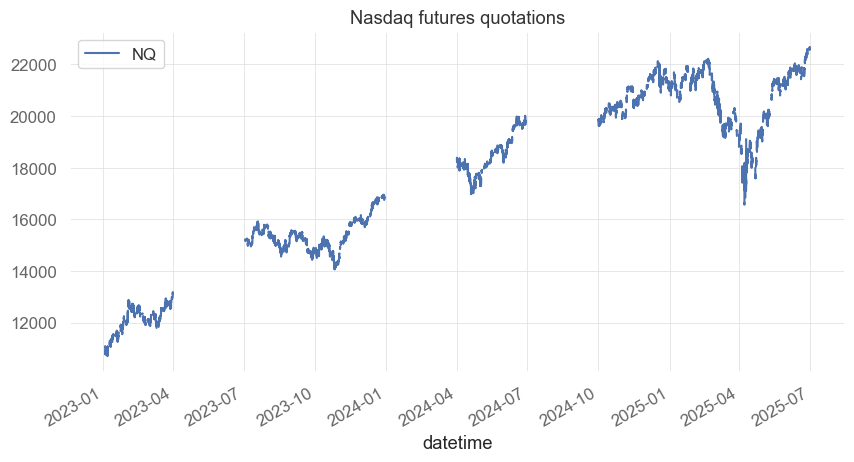

In [342]:
data1.plot(y = 'NQ', use_index = True, figsize = (10, 5))
plt.title("Nasdaq futures quotations")   

Text(0.5, 1.0, 'S&P500 futures quotations')

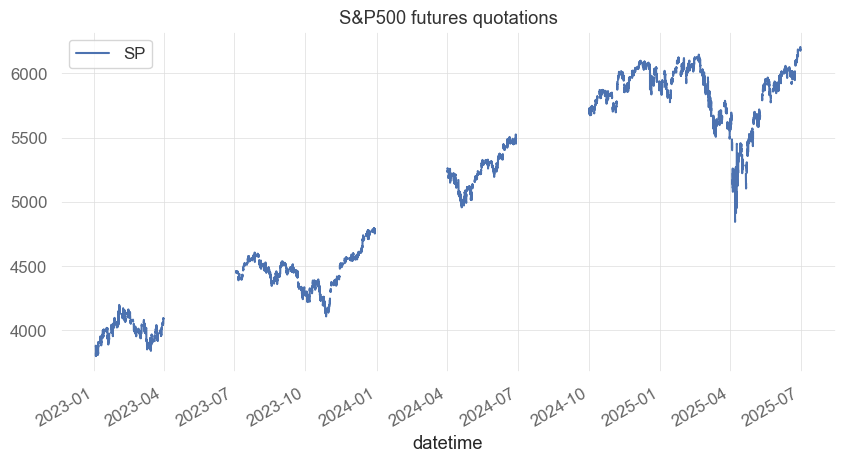

In [343]:
data1.plot(y = 'SP', use_index = True, figsize = (10, 5))
plt.title("S&P500 futures quotations")   

In [344]:
#Saving dataset for further calculations
data1.to_pickle("data1_input.pkl")

#### ROLLING WINDOW ANALYSES

1) Rolling volatility

In [345]:
# fill missing data with the last non-missing value
# (forward fill method)

data1.ffill(inplace = True)

print(data1.isna().sum())

NQ    399
SP    399
dtype: int64


In [ ]:
data1.head(400) # only 'first' 399 NA's left

,NQ,SP
datetime,,
2023-01-02 09:31:00+00:00,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN
...,...,...
2023-01-03 09:37:00+00:00,NaN,NaN
2023-01-03 09:38:00+00:00,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN


In [353]:
# based on closing prices
# we will calculate logarithmic rates of return for
# all series in basis points (bps) 1bps = 0.01% = 0.0001,
# to obtain basis points of return, multiply by 10,000

# Shift index by desired number of periods - can be positive or negative
data1_r = np.log(data1 / data1.shift(1)) * 10000

data1_r.head(401)

,NQ,SP
datetime,,
2023-01-02 09:31:00+00:00,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN
...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN


In [354]:
data1_r.columns = ["r_NQ", "r_SP"]


In [355]:
# Let's combine onlyprices and rates of return 

data1_roll = pd.concat(
    [data1[['NQ', 'SP']], 
     data1_r[['r_NQ', 'r_SP']]],
    axis=1
)

data1_roll.head(401)

,NQ,SP,r_NQ,r_SP
datetime,,,,
2023-01-02 09:31:00+00:00,NaN,NaN,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN,NaN,NaN
...,...,...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN,NaN,NaN


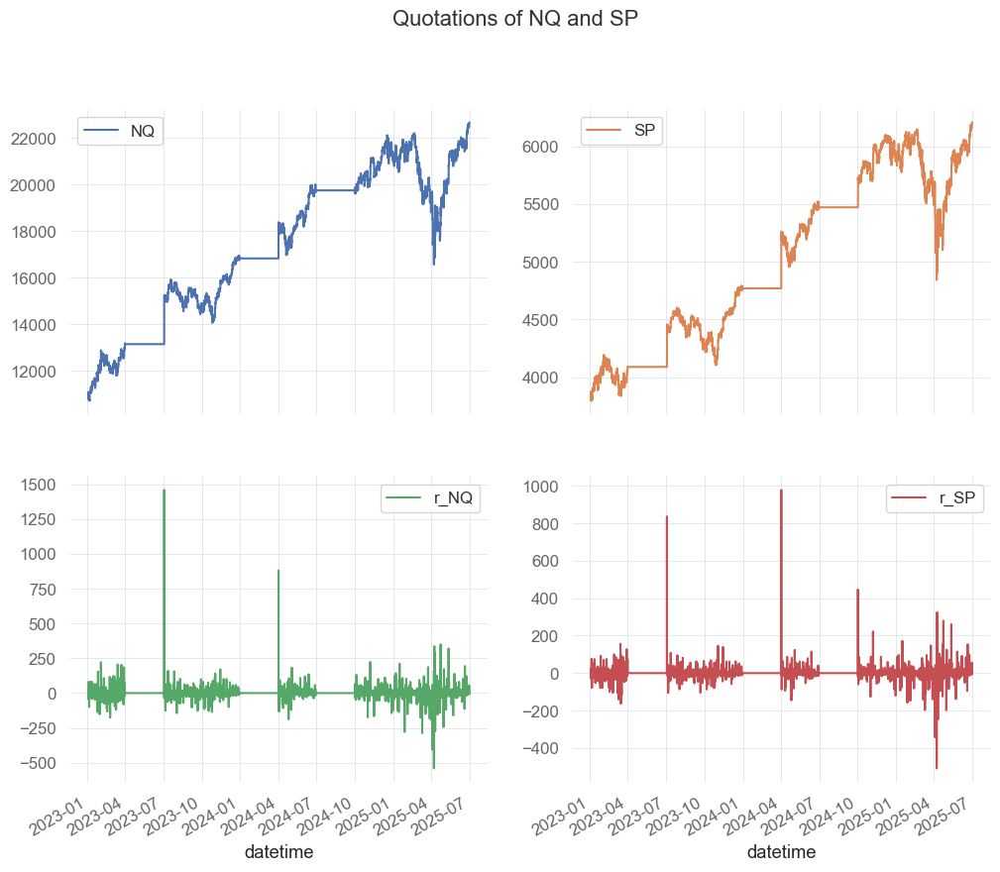

In [ ]:
# Let's see a figure of all columns
# with closing prices and yields for NQ and SP
# on sublots

data1_roll.plot(subplots = True,  
                  layout = (2, 2), 
                  title = "Quotations of NQ and SP",
                  figsize = (12, 10))
plt.show() #return plots: measured in bps

In [358]:
# Let's check the standard deviation of NQ's returns for the entire sample

NQ_r_std = data1_roll['r_NQ'].std()

print("Standard deviation of NQ returns:")
print(NQ_r_std)

Standard deviation of NQ returns:
7.862614499792769


In [ ]:
# Let's check the standard deviation of SP's returns for the entire sample

SP_r_std = data1_roll['r_SP'].std()

print("Standard deviation of SP returns:")
print(SP_r_std) #lower

Standard deviation of SP returns:
6.2301504861464


In [360]:
# let's calculate the standard deviation for
# rolling intervals (in a 60-minute window)
data1_roll['r_NQ_rolling_std'] = data1_roll['r_NQ'].rolling(window = 60).std(ddof=1)

In [361]:
# let's calculate the standard deviation for
# rolling intervals (in a 60-minute window)
data1_roll['r_SP_rolling_std'] = data1_roll['r_SP'].rolling(window = 60).std(ddof=1)

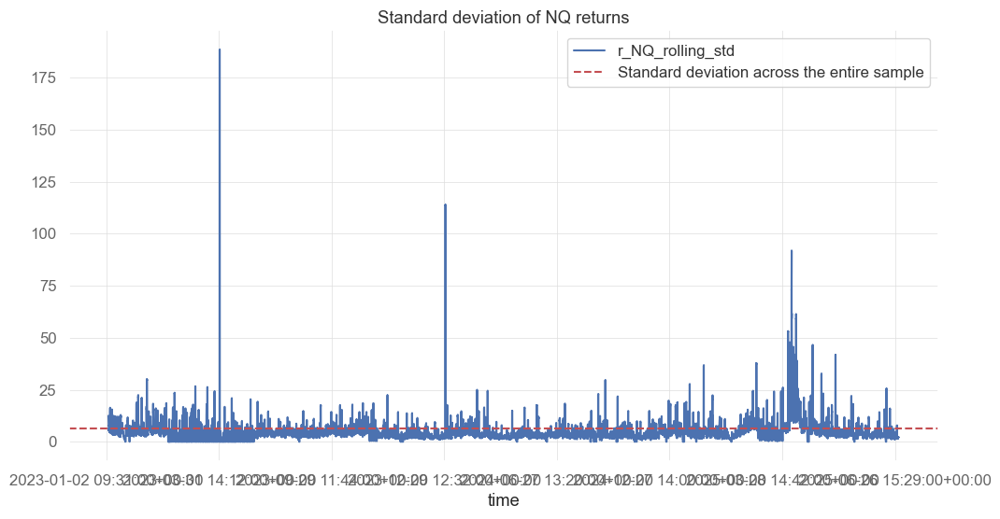

In [363]:
# Let's convert the datetime index to text and pass it as x-axis
data1_roll_plot = data1_roll.copy()
data1_roll_plot['time'] = data1_roll_plot.index.astype(str)

# We reset the index to make 'time' a column
data1_roll_plot = data1_roll_plot.reset_index(drop = True)

# plot the figure of 'r_NQ_rolling_std'

data1_roll_plot.plot(
    x = 'time',
    y = 'r_NQ_rolling_std',
    title = "Standard deviation of NQ returns",
    figsize = (12, 6)
)
# let's add a reference line at the standard deviation level
# SP_r_std
plt.axhline(y = SP_r_std, 
            color = 'r',
            linestyle = '--', 
            label = 'Standard deviation across the entire sample')
plt.legend()    

plt.show()
# volatility was lower than average for later phase of the period

2) Rolling correlation

In [364]:
# NQ and SP quotation price correlation in the entire sample

correlation_p = data1_roll['NQ'].corr(data1_roll['SP'])

print("NQ and SP closing price correlation:")
print(correlation_p) #very high positive correlation value!

NQ and SP closing price correlation:
0.9879000942115326


In [365]:
# NQ and SP quotation price correlation in the entire sample

correlation_r = data1_roll['r_NQ'].corr(data1_roll['r_SP'])

print("NQ and SP rate of returns correlation:")
print(correlation_r)

# slightly lower than for the closing prices - which is typical

NQ and SP rate of returns correlation:
0.8982203779015121


In [366]:
# rolling analysis of price correlations in a 2-hour (120-minute) timeframe

data1_roll['rollcorr120_NQ_SP'] = data1_roll['NQ'].rolling(window=120).corr(data1_roll['SP'])

In [368]:
data1_roll.head(401)

,NQ,SP,r_NQ,r_SP,r_NQ_rolling_std,r_SP_rolling_std,rollcorr120_NQ_SP
datetime,,,,,,,
2023-01-02 09:31:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


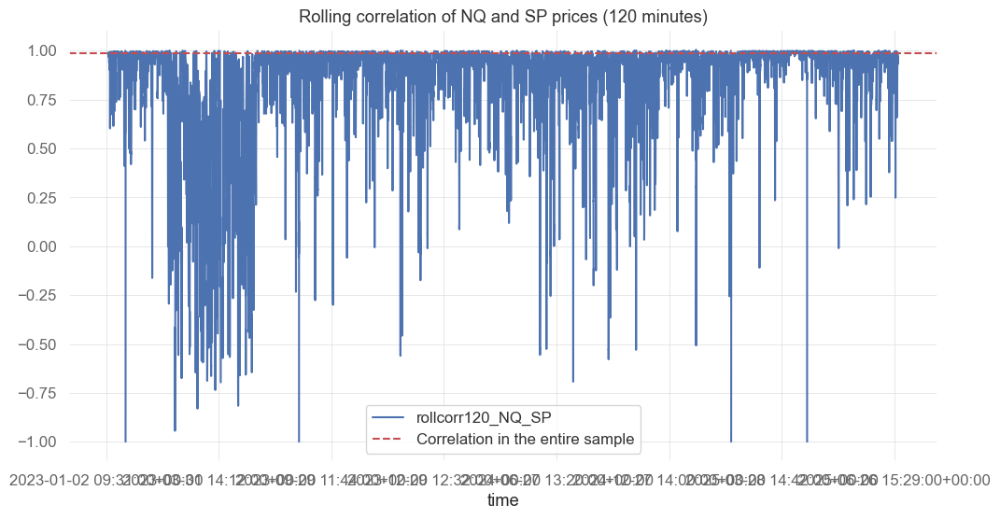

In [369]:
# Let's see how correlation changes over time

# Let's convert the datetime index to a text index and pass it as the x-axis
data1_roll_plot = data1_roll.copy()
data1_roll_plot['time'] = data1_roll_plot.index.astype(str)

# Reset the index so that 'time' is a column
data1_roll_plot = data1_roll_plot.reset_index(drop = True)

# Let's draw the graph
data1_roll_plot.plot(
    x = 'time',
    y = 'rollcorr120_NQ_SP',
    title = "Rolling correlation of NQ and SP prices (120 minutes)",
    figsize = (12, 6)
)

# let's add a reference line at the correlation level in the entire sample
plt.axhline(y = correlation_p,
            color = 'r',
            linestyle = '--',
            label = 'Correlation in the entire sample')

plt.legend()
plt.show()

In [370]:
# let's save the rolling window file to the pickle file
# for further analysis

data1.to_pickle("data1_input_filled_na.pkl")
data1_roll.to_pickle("data1_roll.pkl")

3) Rolling linear and quantile regression

In [430]:
data1_roll = pd.read_pickle("data1_roll.pkl")
data1.head(11)

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,NQ_SMA60,NQ_EMA60,NQ_STD60,NQ_MAD60,NQ_MedAD60,position1_mom,position1_mr,pnl_gross1_mom,pnl_gross1_mr
datetime,,,,,,,,,,,,,,,,,,,
2023-01-02 09:31:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2023-01-02 09:32:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2023-01-02 09:33:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2023-01-02 09:34:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2023-01-02 09:35:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2023-01-02 09:36:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2023-01-02 09:37:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2023-01-02 09:38:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2023-01-02 09:39:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0


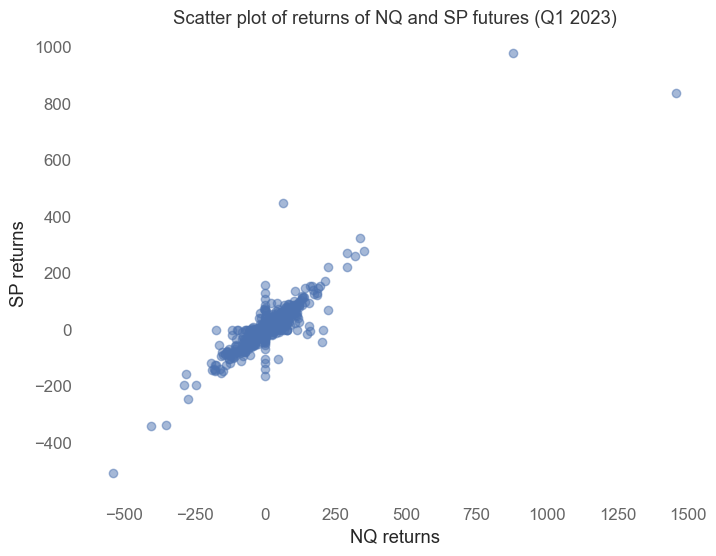

In [377]:
# lets start with a scatter plot of returns of both stocks

plt.figure(figsize=(8,6))
plt.scatter(data1_roll["r_NQ"], data1_roll["r_SP"], alpha=0.5)
plt.title("Scatter plot of returns of NQ and SP futures (Q1 2023)")
plt.xlabel("NQ returns")
plt.ylabel("SP returns")
plt.grid()
plt.show()

# looks like there is positive relationship between returns of both stocks (strong linearity)

In [378]:
## ATTENTION!
data1_roll.head(401) # soem NA's in the dataset

,NQ,SP,r_NQ,r_SP,r_NQ_rolling_std,r_SP_rolling_std,rollcorr120_NQ_SP
datetime,,,,,,,
2023-01-02 09:31:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [379]:
# lets remove the first 400 rows  from the dataset
data1_roll = data1_roll.iloc[400:, :]

In [ ]:
# let's quantify it with linear regression

X = data1_roll["r_NQ"]
y = data1_roll["r_SP"]
X = sm.add_constant(X)  # adding a constant term for intercept
model_ols = sm.OLS(y, X).fit()
print(model_ols.summary())

# relationship highly significant
# regression coefficient = 0.7117, R2 = 0.807
# constant term not significant

                            OLS Regression Results                            
Dep. Variable:                   r_SP   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.807
Method:                 Least Squares   F-statistic:                 7.325e+05
Date:                Sat, 17 Jan 2026   Prob (F-statistic):               0.00
Time:                        19:06:50   Log-Likelihood:            -4.2561e+05
No. Observations:              175412   AIC:                         8.512e+05
Df Residuals:                  175410   BIC:                         8.512e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0022      0.007     -0.333      0.7

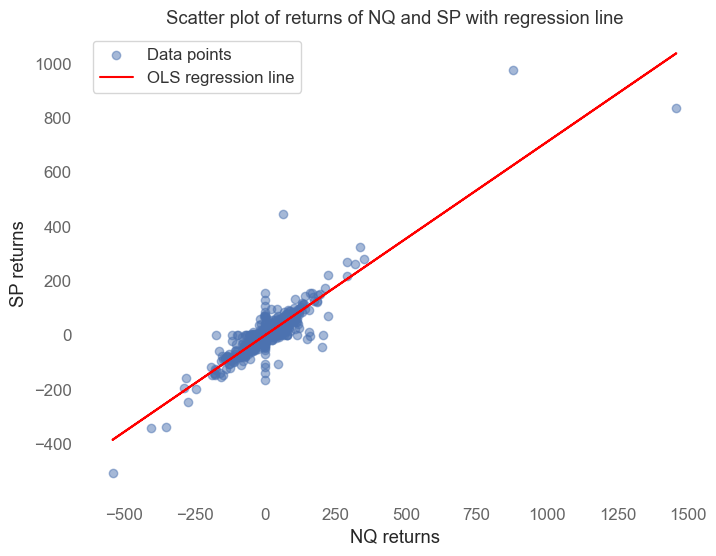

In [381]:
# lets add a regression line to the scatter plot

plt.figure(figsize=(8,6))
plt.scatter(data1_roll["r_NQ"], 
            data1_roll["r_SP"], 
            alpha=0.5,
            label="Data points")
# regression line
plt.plot(data1_roll["r_NQ"],
         model_ols.predict(X), 
         color='red', label="OLS regression line")
plt.title("Scatter plot of returns of NQ and SP with regression line")
plt.xlabel("NQ returns")
plt.ylabel("SP returns")
plt.legend()
plt.grid()
plt.show()

In [ ]:
# lets estimate quantile regression at median (0.5 quantile)
model_qr_median = sm.QuantReg(y, X).fit(q = 0.5)
print(model_qr_median.summary())

# the impact of NQ returns on conditional median 
# of SP returns is statistically significant
# and the slope is slightly more steep (0.7171) than for OLS!

                         QuantReg Regression Results                          
Dep. Variable:                   r_SP   Pseudo R-squared:               0.5917
Model:                       QuantReg   Bandwidth:                     0.07409
Method:                 Least Squares   Sparsity:                       0.7180
Date:                Sat, 17 Jan 2026   No. Observations:               175412
Time:                        19:07:11   Df Residuals:                   175410
                                        Df Model:                            1
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -3.15e-08      0.001  -3.67e-05      1.000      -0.002       0.002
r_NQ           0.7171      0.000   6577.582      0.000       0.717       0.717


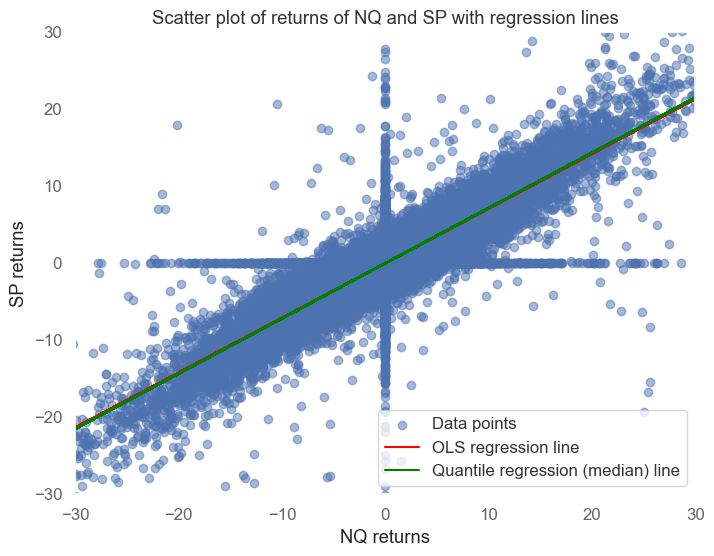

In [383]:
plt.figure(figsize=(8,6))

plt.scatter(
    data1_roll["r_NQ"],
    data1_roll["r_SP"],
    alpha=0.5,
    label="Data points"
)

# OLS regression line
plt.plot(
    data1_roll["r_NQ"],
    model_ols.predict(X),
    color="red",
    label="OLS regression line"
)

# Quantile regression line
plt.plot(
    data1_roll["r_NQ"],
    model_qr_median.predict(X),
    color="green",
    label="Quantile regression (median) line"
)

plt.title("Scatter plot of returns of NQ and SP with regression lines")
plt.xlabel("NQ returns")
plt.ylabel("SP returns")

plt.xlim(-30, 30)
plt.ylim(-30, 30)

plt.legend()
plt.grid()
plt.show()


In [384]:
# lets apply the Engle-Granger two-step method

# Step 1: estimate the long-run relationship with OLS
X_price = data1_roll["NQ"]
y_price = data1_roll["SP"]
X_price = sm.add_constant(X_price)  # adding a constant term for intercept

model_ols_price = sm.OLS(y_price, X_price).fit()
print(model_ols_price.summary())


                            OLS Regression Results                            
Dep. Variable:                     SP   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                 7.117e+06
Date:                Sat, 17 Jan 2026   Prob (F-statistic):               0.00
Time:                        19:07:38   Log-Likelihood:            -1.0830e+06
No. Observations:              175412   AIC:                         2.166e+06
Df Residuals:                  175410   BIC:                         2.166e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1097.5277      1.527    718.574      0.0

In [385]:
# Step 2: obtain the residuals from the OLS regression
residuals = model_ols_price.resid

In [ ]:
# and test them for stationarity with the ADF test
adf_test = ADF(residuals)

# by default number of lags is selected automatically based on AIC
# WHICH is not correct as it does not take into account potential autocorrelation
# and trend = 'c' (constant/drift) is used

print(adf_test.summary().as_text())

# We cannot reject H0 about NON-stationarity (but close to p-value=5% level)

   Augmented Dickey-Fuller Results   
Test Statistic                 -2.596
P-value                         0.094
Lags                               74
-------------------------------------

Trend: Constant
Critical Values: -3.43 (1%), -2.86 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


In [ ]:
# lets use simpler settings to speed up the calculations

adf_test2 = ADF(residuals,
                lags = 5, # how many augmentations
                # random walk with a constant/drift - default
                # (alternative: 'n', 'ct', 'ctt' - last with quadratic trend also)
                trend = 'c') 
print(adf_test2.summary().as_text())
# conclusion on cointegration is same as above, even closer

   Augmented Dickey-Fuller Results   
Test Statistic                 -2.775
P-value                         0.062
Lags                                5
-------------------------------------

Trend: Constant
Critical Values: -3.43 (1%), -2.86 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


In [388]:
# lets apply a Phillips-Perron test

pp_test = PhillipsPerron(residuals) 
# by default lags is set automatically to 12 * (nobs/100) ** (1/4)
# and trend = 'c' (constant/drift) is used

print(pp_test.summary().as_text())
# same conclusion and in ADF test:
# we cannot reject H0 about NON-stationarity (but p-value very close to 5% level)

# (also the test statistic and its p-value are 
# very close to that from ADF test)

     Phillips-Perron Test (Z-tau)    
Test Statistic                 -2.682
P-value                         0.077
Lags                               78
-------------------------------------

Trend: Constant
Critical Values: -3.43 (1%), -2.86 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


In [389]:
# and in the end the KPSS test

kpss_test = KPSS(residuals) 
# by default the number of lags is calculated with
# the data-dependent method of Hobijn et al. (1998) 
# and trend = 'c' (constant/drift) is used

print(kpss_test.summary().as_text())
# same conclusion as in two earlier tests:
# we reject H0 about stationarity!!!

    KPSS Stationarity Test Results   
Test Statistic                  8.592
P-value                         0.000
Lags                              239
-------------------------------------

Trend: Constant
Critical Values: 0.74 (1%), 0.46 (5%), 0.35 (10%)
Null Hypothesis: The process is weakly stationary.
Alternative Hypothesis: The process contains a unit root.


In [390]:
# How to extract p-values from the tests?

print("p-value from ADF test:", adf_test2.pvalue)
print("p-value from Phillips-Perron test:", pp_test.pvalue)
print("p-value from KPSS test:", kpss_test.pvalue)

p-value from ADF test: 0.061942452594174635
p-value from Phillips-Perron test: 0.07711742114923609
p-value from KPSS test: 0.0001


In [ ]:
#Granger causality test
print("We check if SP prices Granger-cause NQ prices")
# second column is the causing variable
granger_test = grangercausalitytests(data1_roll[["NQ", "SP"]], 
                      # if we put maxlag = [10],
                      # we test only for lag = 10
                      maxlag = [10])
print("\n")
print("We check if NQ prices Granger-cause SP prices")
granger_test = grangercausalitytests(data1_roll[["SP", "NQ"]], 
                      maxlag = [10])

# however, with 10 minute horizon we have bidirectional Granger causality!
# (the null hypothesis of no causality is rejected at any significance level)

We check if SP prices Granger-cause NQ prices

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=7.4874  , p=0.0000  , df_denom=175381, df_num=10
ssr based chi2 test:   chi2=74.8829 , p=0.0000  , df=10
likelihood ratio test: chi2=74.8669 , p=0.0000  , df=10
parameter F test:         F=7.4874  , p=0.0000  , df_denom=175381, df_num=10


We check if NQ prices Granger-cause SP prices

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=6.4759  , p=0.0000  , df_denom=175381, df_num=10
ssr based chi2 test:   chi2=64.7668 , p=0.0000  , df=10
likelihood ratio test: chi2=64.7549 , p=0.0000  , df=10
parameter F test:         F=6.4759  , p=0.0000  , df_denom=175381, df_num=10


3a) Rolling  linear regression

In [392]:
# lets apply rolling OLS regression
# based on a moving window of 180 minutes
# The cleanest, loop-free way to do this 
# is to use the RollingOLS function from statsmodels

# Prepare data
y = data1_roll["r_SP"]
X = sm.add_constant(data1_roll["r_NQ"])

# Run rolling OLS
rolling_model = RollingOLS(y, X, window = 180, min_nobs = 180)
rolling_results = rolling_model.fit()

# unfortunately, there is no similar equivalent 
# for quantile regression in python...

# Extract rolling parameters
params = rolling_results.params
rsq = rolling_results.rsquared

# Combine results into a single DataFrame
rolling_out = pd.concat([params, rsq.rename("R_squared")], axis=1).dropna()

rolling_out.head()


,const,r_NQ,R_squared
datetime,,,
2023-01-03 12:41:00+00:00,0.075943,0.726306,0.905609
2023-01-03 12:42:00+00:00,0.025256,0.724244,0.903409
2023-01-03 12:43:00+00:00,0.011791,0.724345,0.904209
2023-01-03 12:44:00+00:00,0.022503,0.724255,0.905555
2023-01-03 12:45:00+00:00,0.020824,0.728968,0.903215


Beta coefficient from OLS regression: 0.7117286653437902


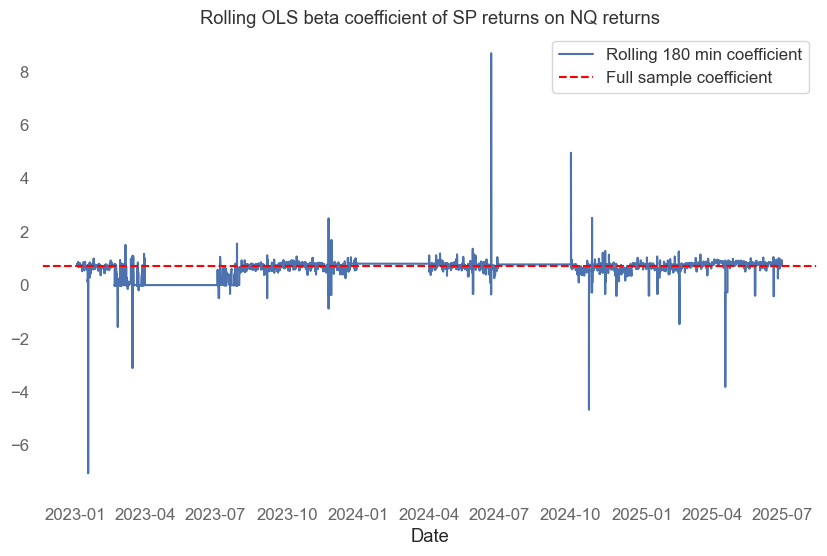

In [ ]:
# how to extract a beta coefficient from the model?
beta_ols = model_ols.params["r_NQ"]
print("Beta coefficient from OLS regression:", beta_ols)

# lets plot rolling beta coefficient 
plt.figure(figsize=(10,6))
plt.plot(rolling_out.index, 
         rolling_out["r_NQ"], 
         label = "Rolling 180 min coefficient")
# add a reference line for OLS beta
plt.axhline(y = beta_ols, 
            color = 'red', 
            linestyle = '--', 
            label = "Full sample coefficient")
plt.title("Rolling OLS beta coefficient of SP returns on NQ returns")
plt.xlabel("Date")
plt.legend()
plt.grid() #Several strange spikes

3a) Rolling Granger causality

In [394]:
# lets write the function that would extract the p-values
# from the Granger causality test

def granger_pvalue(df: pd.DataFrame, # dataframe with data
                   col1: str, # caused variable
                   col2: str, # causing variable
                   maxlag: int) -> float: # maximum lag to test
    granger_test = grangercausalitytests(df[[col2, col1]], maxlag = [maxlag],
                                         verbose = False) # do NOT print the results
    p_value = granger_test[maxlag][0]['ssr_ftest'][1]
    return float(p_value)

In [395]:
# and apply it to our full dataset
p_value = granger_pvalue(data1_roll, 
                         "NQ", "SP", 
                         maxlag = 10)
print("p-value from Granger causality test (NQ causes SP):", p_value)

p-value from Granger causality test (NQ causes SP): 4.5278231835479355e-10


In [ ]:
df_N_S = data1_roll[["NQ", "SP"]] #only quotation values
df_N_S

,NQ,SP
datetime,,
2023-01-03 09:42:00+00:00,11087.009,3875.631
2023-01-03 09:43:00+00:00,11084.699,3876.116
2023-01-03 09:44:00+00:00,11082.409,3873.866
2023-01-03 09:45:00+00:00,11051.949,3867.122
2023-01-03 09:46:00+00:00,11027.957,3858.863
...,...,...
2025-06-30 15:56:00+00:00,22678.865,6205.469
2025-06-30 15:57:00+00:00,22678.865,6205.469
2025-06-30 15:58:00+00:00,22678.865,6205.469


3c) Rolling cointegration tests

In [397]:
# lets summarize the above in functions
# that would perform Engle-Granger residual tests
# for any two columns in a given DataFrame

# the function to get residuals from OLS regression
def _eg_residuals(df: pd.DataFrame, col1: str, col2: str):
    X = sm.add_constant(df[col1].values, has_constant="add")
    y = df[col2].values
    model = sm.OLS(y, X).fit()
    return model.resid

# the function for ADF p-value
def eg_adf_pvalue(df: pd.DataFrame, col1: str, col2: str, 
                  trend: str = "c", adf_lags: int = 5) -> float:
    resid = _eg_residuals(df, col1, col2)
    return float(ADF(resid, lags=adf_lags, trend=trend).pvalue)

# the function for PP p-value
def eg_pp_pvalue(df: pd.DataFrame, col1: str, col2: str, 
                 trend: str = "c") -> float:
    resid = _eg_residuals(df, col1, col2)
    return float(PhillipsPerron(resid, trend=trend).pvalue)

# the function for KPSS p-value
def eg_kpss_pvalue(df: pd.DataFrame, col1: str, col2: str, 
                   trend: str = "c") -> float:
    resid = _eg_residuals(df, col1, col2)
    return float(KPSS(resid, trend=trend).pvalue)

In [ ]:
# (NAPRAWIĆ)
# helpers that call our previously defined functions  
# on a subset and return a p-value of the corresponding test
_adf = lambda x: eg_adf_pvalue(df_N_S.loc[x.index], 
                               "NQ", "SP")
_pp  = lambda x: eg_pp_pvalue(df_N_S.loc[x.index], 
                              "NQ", "SP")
_kpss= lambda x: eg_kpss_pvalue(df_N_S.loc[x.index], 
                                "NQ", "SP")

# we apply the test every 60 minutes on a 240 minute window
adf_p = df_N_S["SP"].rolling(window = 180, 
                                     step = 60).apply(_adf)
pp_p  = df_N_S["SP"].rolling(window = 180, 
                                     step = 60).apply(_pp)
kpss_p= df_N_S["SP"].rolling(window = 180, 
                                     step = 60).apply(_kpss)

out = pd.concat({"adf_p": adf_p, "pp_p": pp_p, "kpss_p": kpss_p}, axis=1).dropna()


In [317]:
# lets see the results
out.head()

,adf_p,pp_p,kpss_p
datetime,,,
2024-04-01 13:32:00+00:00,0.070796,1.742801e-10,0.008731
2024-04-01 14:32:00+00:00,0.478814,1.531083e-01,0.000221
2024-04-01 15:32:00+00:00,0.006431,2.164977e-04,0.160232
2024-04-02 10:02:00+00:00,0.000009,2.329528e-08,0.361091
2024-04-02 11:02:00+00:00,0.000108,3.671282e-07,0.579990


In [ ]:
# lets check how many times
# we would identify cointegration
# at 5% significance level

print("Share of times cointegration identified at 5% significance level:")
print("ADF test:", (out["adf_p"] < 0.05).sum()/out.size)
print("PP test:", (out["pp_p"] < 0.05).sum()/out.size)
# IMPORTANT - in KPSS H0 is about stationarity
print("KPSS test:", (out["kpss_p"] > 0.05).sum()/out.size) #small 'chance' of cointergration, highest for KPSS

Share of times cointegration identified at 5% significance level:
ADF test: 0.060461416070007955
PP test: 0.10819411296738266
KPSS test: 0.12967382657120127


### STRATEGY SETUP WITH DIFFERENT ENTRY/EXIT STRATEGIES

In [401]:
data1 = pd.read_pickle("data1_input.pkl")
data1.head(401)

,NQ,SP
datetime,,
2023-01-02 09:31:00+00:00,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN
...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN


In [402]:
data1.between_time("15:51", "16:00").head(21)

,NQ,SP
datetime,,
2023-01-02 15:51:00+00:00,NaN,NaN
2023-01-02 15:52:00+00:00,NaN,NaN
2023-01-02 15:53:00+00:00,NaN,NaN
2023-01-02 15:54:00+00:00,NaN,NaN
2023-01-02 15:55:00+00:00,NaN,NaN
2023-01-02 15:56:00+00:00,NaN,NaN
2023-01-02 15:57:00+00:00,NaN,NaN
2023-01-02 15:58:00+00:00,NaN,NaN
2023-01-02 15:59:00+00:00,NaN,NaN


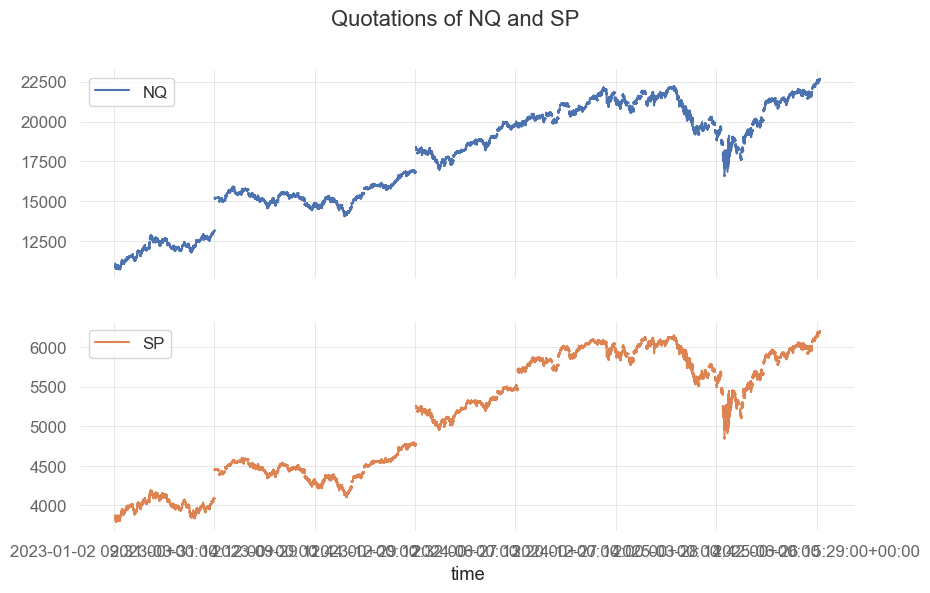

In [403]:
# Let's see the effect on the plot

# Let's convert the datetime index to text and pass it as the x-axis
data1_plot = data1.copy()

data1_plot['time'] = data1_plot.index.astype(str)

# Reset the index so that 'time' is a column
data1_plot = data1_plot.reset_index(drop = True)

# Set time as the X-axis and plot the charts
data1_plot.plot(
    x = 'time',
    subplots = True,
    layout = (2, 1),
    title = "Quotations of NQ and SP"
)

plt.show()


a) SIMPLE MOVING AVERAGE (SMA)

In [404]:
# let's calculate the 20-minute moving average for NQ price

data1['NQ_SMA20'] = data1['NQ'].rolling(window = 20, 
                                                                                # lets assume we need at least 50%
                                                                                # of non-missing values to calculate the mean
                                                                                min_periods = 10).mean()

In [405]:
# let's insert missing values in the moving average
# whenever the original price is missing
# (this applies to the first and last 5 minutes of each session)

data1['NQ_SMA20'] = data1['NQ_SMA20'].where(
    # keep the value only if the original price is not missing
    # otherwise set it to NaN
    ~data1['NQ'].isna(), np.nan)


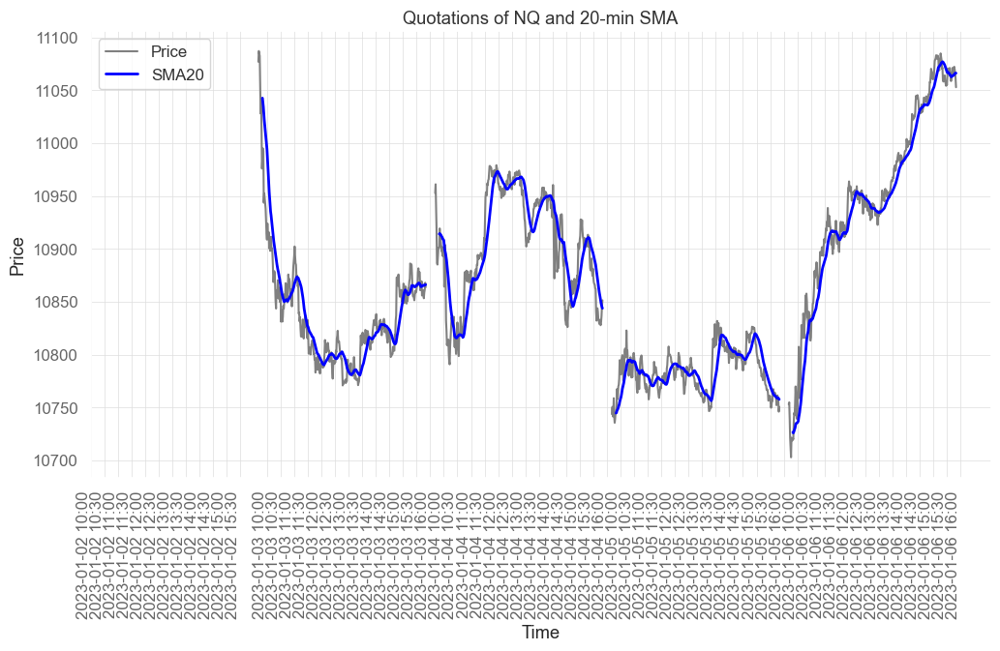

In [406]:
# Let's compare the SMA on the chart with the original closing price
# for the first ten days of data

# select only the columns needed for the plot
dat1_plot = data1[['NQ',
                                            'NQ_SMA20']].copy()
# Filter only the first 6 days
end_date = dat1_plot.index.min() + pd.Timedelta(days = 5)
dat1_plot = dat1_plot.loc[:end_date]

# Add a time column (index as datetime)
dat1_plot['time'] = dat1_plot.index

# Reset the index so that 'time' is a column
dat1_plot = dat1_plot.reset_index(drop=True)

# We make a plot by observation number – so that there are no gaps between sessions
plt.figure(figsize = (12, 6))
plt.plot(dat1_plot.index, 
         dat1_plot['NQ'], 
         label = 'Price', 
         color='gray')
plt.plot(dat1_plot.index, 
         dat1_plot['NQ_SMA20'], 
         label = 'SMA20', 
         color = 'blue',  
         linewidth = 2)

# mark on the X axis ticks with dates/times every half hour
tick_mask = dat1_plot['time'].dt.minute % 30 == 0
xticks = dat1_plot.index[tick_mask]
xticklabels = dat1_plot['time'][tick_mask].dt.strftime('%Y-%m-%d %H:%M')
plt.xticks(ticks = xticks, labels = xticklabels, rotation = 90, ha = 'right')

plt.title("Quotations of NQ and 20-min SMA")
plt.xlabel("Time")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show() #pretty good

b) 2 SMA

In [407]:
# let's calculate the 10-minute moving average for NQ price
data1['NQ_SMA10'] = data1['NQ'].rolling(window = 10, 
                                                                                min_periods=5).mean()

# let's insert missing values in the moving average
# whenever the original price is missing
# (this applies to the first and last 5 minutes of each session)

data1['NQ_SMA10'] = data1['NQ_SMA10'].where(
    ~data1['NQ'].isna(), np.nan)

# let's calculate the 30-minute moving average for NQ price
data1['NQ_SMA30'] = data1['NQ'].rolling(window = 30, 
                                                                                min_periods = 15).mean()
# and insert missing values in the moving average
data1['NQ_SMA30'] = data1['NQ_SMA30'].where(
    ~data1['NQ'].isna(), np.nan)

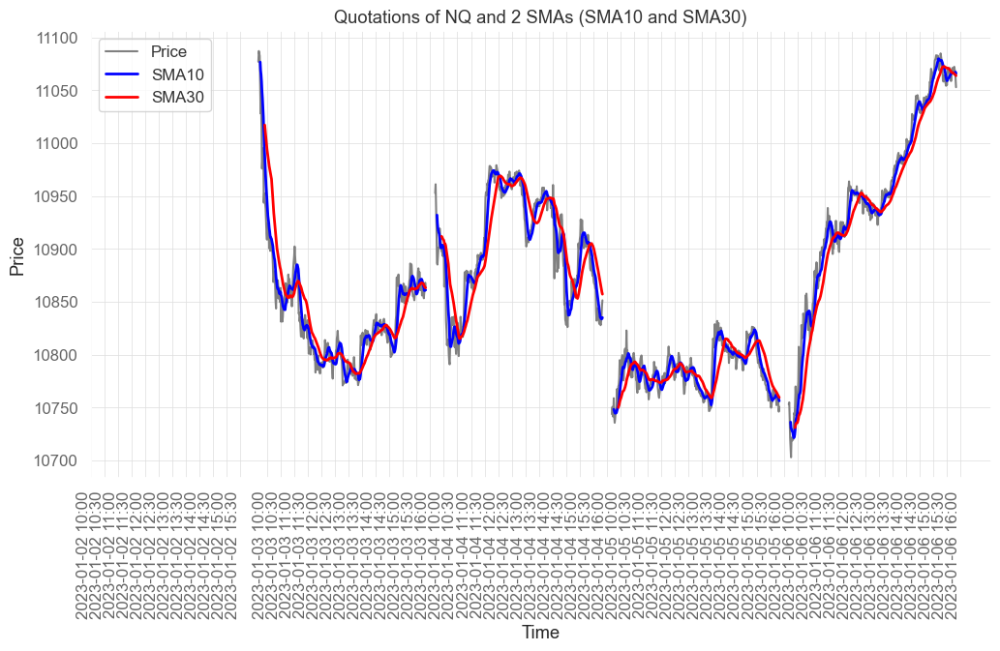

In [408]:
# Let's compare both SMAs on the chart with the original closing price

# Let's select only the columns needed for the chart
data1_plot = data1[['NQ',
                                            'NQ_SMA10',
                                            'NQ_SMA30']].copy()
# Filter only the first 6 days
end_date = data1_plot.index.min() + pd.Timedelta(days = 5)
data1_plot = data1_plot.loc[:end_date]

# Add a time column (index as datetime)
data1_plot['time'] = data1_plot.index

# Reset the index so that 'time' is a column
data1_plot = data1_plot.reset_index(drop=True)

# We make a plot by observation number – so that there are no gaps between sessions
plt.figure(figsize = (12, 6))
plt.plot(data1_plot.index, 
         data1_plot['NQ'], 
         label = 'Price', 
         color='gray')
plt.plot(data1_plot.index, 
         data1_plot['NQ_SMA10'], 
         label = 'SMA10', 
         color = 'blue',  
         linewidth = 2)
plt.plot(data1_plot.index, 
         data1_plot['NQ_SMA30'], 
         label = 'SMA30', 
         color = 'red',  
         linewidth = 2)

# mark on the X axis ticks with dates/times every half hour
tick_mask = data1_plot['time'].dt.minute % 30 == 0
xticks = data1_plot.index[tick_mask]
xticklabels = data1_plot['time'][tick_mask].dt.strftime('%Y-%m-%d %H:%M')
plt.xticks(ticks = xticks, labels = xticklabels, rotation = 90, ha = 'right')

plt.title("Quotations of NQ and 2 SMAs (SMA10 and SMA30)")
plt.xlabel("Time")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show()

c) 2 EXPONENTIAL MOVING AVERAGES (EMA)

In [409]:
# let's calculate the 10-minute EMA for the NQ price

# The easiest way to do this in Python is to use the .ewm() method 
# (Exponential Moving Window) from Pandas
# .ewm() parameters:
# - span: number of periods (the smaller, the faster the EMA)
# - alternative: halflife: half-life (the smaller, the faster the EMA)
# - min_periods: how much data is needed to start calculating (default = 0)

data1['NQ_EMA10'] = data1['NQ'].ewm(span = 10, 
                                                                            min_periods = 5).mean()

# let's insert missing values in the moving average
# each time the original price is missing
# (this applies to the first and last 5 minutes of each session)

data1['NQ_EMA10'] = data1['NQ_EMA10'].where(
    ~data1['NQ'].isna(), np.nan)

# and let's calculate the 30-minute EMA for the NQ price

data1['NQ_EMA30'] = data1['NQ'].ewm(span = 30, 
                                                                            min_periods = 15).mean()

# and insert missing values in the moving average
# each time the original price is missing
data1['NQ_EMA30'] = data1['NQ_EMA30'].where(
    ~data1['NQ'].isna(), np.nan)


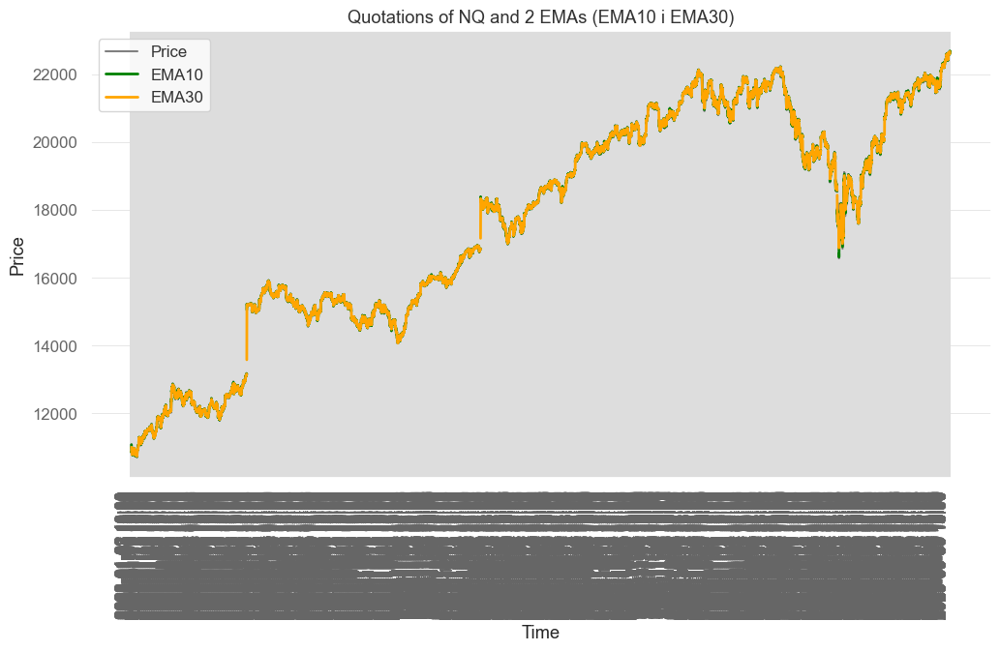

In [410]:
# Let's see them on the price chart

# Let's select only the columns needed for the chart
data1_plot = data1[['NQ',
                                            'NQ_EMA10',
                                            'NQ_EMA30']].copy()
# Filter only the first 6 days
end_date = data1_plot.index.min() + pd.Timedelta(days = 5)
dataUSA_AAPL_META_plot = data1_plot.loc[:end_date]

# Add a time column (index as datetime)
data1_plot['time'] = data1_plot.index

# Reset the index so that 'time' is a column
data1_plot = data1_plot.reset_index(drop=True)

# We make a plot by observation number – so that there are no gaps between sessions
plt.figure(figsize = (12, 6))
plt.plot(data1_plot.index, 
         data1_plot['NQ'], 
         label = 'Price', 
         color='gray')
plt.plot(data1_plot.index, 
         data1_plot['NQ_EMA10'], 
         label = 'EMA10', 
         color = 'green',  
         linewidth = 2)
plt.plot(data1_plot.index, 
         data1_plot['NQ_EMA30'], 
         label = 'EMA30', 
         color = 'orange',  
         linewidth = 2)

# mark on the X axis ticks with dates/times every half hour
tick_mask = data1_plot['time'].dt.minute % 30 == 0
xticks = data1_plot.index[tick_mask]
xticklabels = data1_plot['time'][tick_mask].dt.strftime('%Y-%m-%d %H:%M')
plt.xticks(ticks = xticks, labels = xticklabels, rotation = 90, ha = 'right')

plt.title("Quotations of NQ and 2 EMAs (EMA10 i EMA30)")
plt.xlabel("Time")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show()

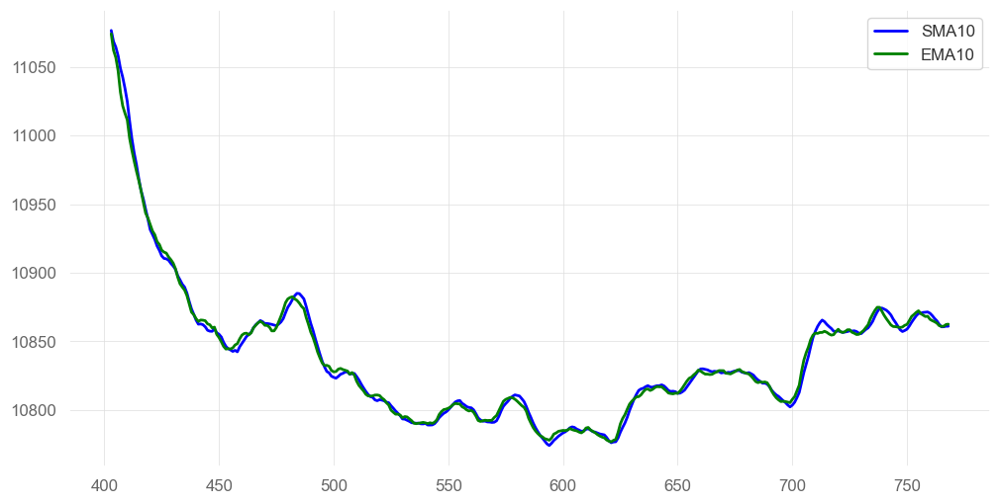

In [411]:
# Let's compare the EMA10 with the SMA10

# Let's select only the columns needed for the chart
data1_plot = data1[['NQ_SMA10',
                                            'NQ_EMA10']].copy()

# Filter only the first 3 days
end_date = data1_plot.index.min() + pd.Timedelta(days = 2)
data1_plot = data1_plot.loc[:end_date]
# Add a time column (index as datetime)
data1_plot['time'] = data1_plot.index
# Reset the index so that 'time' is a column
data1_plot = data1_plot.reset_index(drop=True)

# We make a plot by observation number – so that there are no gaps between sessions
plt.figure(figsize = (12, 6))
plt.plot(data1_plot.index, 
         data1_plot['NQ_SMA10'], 
         label = 'SMA10', 
         color = 'blue',  
         linewidth = 2)
plt.plot(data1_plot.index, 
         data1_plot['NQ_EMA10'],
            label = 'EMA10',
            color = 'green',  
            linewidth = 2)

# Let's add a legend
plt.legend()

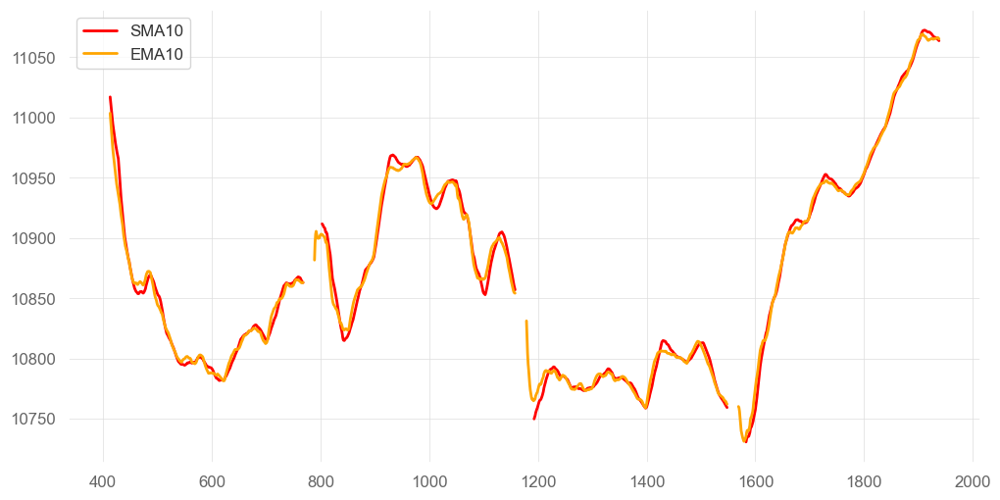

In [412]:
# Let's compare the EMA30 with the SMA30 now

# Let's select only the columns needed for the chart
data1_plot = data1[['NQ_SMA30',
                                            'NQ_EMA30']].copy()

# Filter only the first 6 days
end_date = data1_plot.index.min() + pd.Timedelta(days = 5)
data1_plot = data1_plot.loc[:end_date]
# Add a time column (index as datetime)
data1_plot['time'] = data1_plot.index
# Reset the index so that 'time' is a column
data1_plot = data1_plot.reset_index(drop=True)

# We make a plot by observation number – so that there are no gaps between sessions
plt.figure(figsize = (12, 6))
plt.plot(data1_plot.index, 
         data1_plot['NQ_SMA30'], 
         label = 'SMA10', 
         color = 'red',  
         linewidth = 2)
plt.plot(data1_plot.index, 
         data1_plot['NQ_EMA30'],
            label = 'EMA10',
            color = 'orange',  
            linewidth = 2)

# Let's add a legend
plt.legend()

# with a longer memory, it is more visible that 
# the EMA reacts faster to price changes than the SMA

d) VOLATILITY BREAKOUT MODELS

In [413]:
# let's calculate the 60-minute standard deviation of the nq price

data1['NQ_STD30'] = data1['NQ'].rolling(window = 30,
                                                                                min_periods = 15).std()

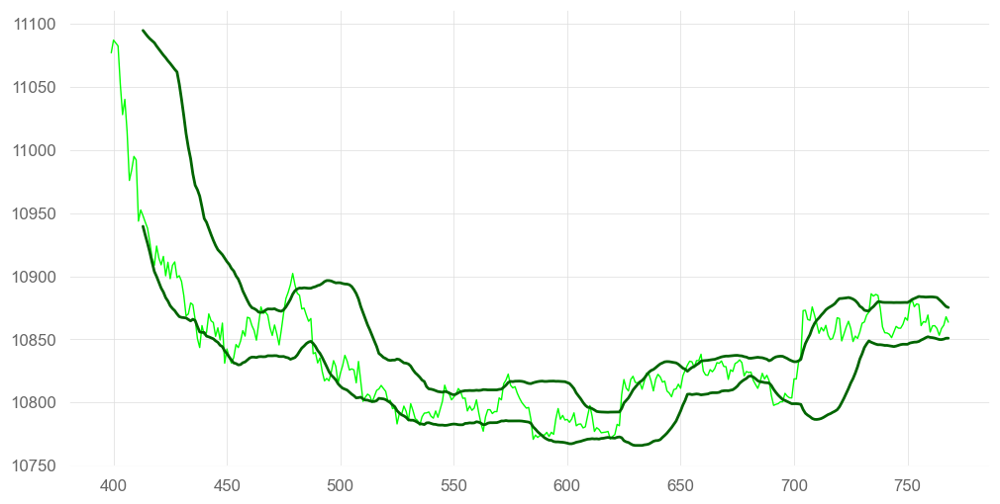

In [414]:
# Let's see the closing price and thresholds on the chart
# determined based on volatility
# SMA60+/-1.5*rollstd60

# Select only the columns needed for the chart
data1_plot = data1[['NQ',
                                            'NQ_SMA30',
                                            'NQ_STD30']].copy()

# Filter only the first 3 days
end_date = data1_plot.index.min() + pd.Timedelta(days = 2)
data1_plot = data1_plot.loc[:end_date]
# Add a time column (index as datetime)
data1_plot['time'] = data1_plot.index
# Reset the index so that 'time' is a column
data1_plot = data1_plot.reset_index(drop=True)

# We make a plot by observation number – so that there are no gaps between sessions
plt.figure(figsize = (12, 6))
plt.plot(data1_plot.index, 
         data1_plot['NQ'], 
         color = 'lime',  
         linewidth = 1)
plt.plot(data1_plot.index, 
         data1_plot['NQ_SMA30'] + 1.5 * data1_plot['NQ_STD30'], 
         color = 'darkgreen',  
         linewidth = 2)
plt.plot(data1_plot.index, 
         data1_plot['NQ_SMA30'] - 1.5 * data1_plot['NQ_STD30'],
         color = 'darkgreen',  
         linewidth = 2)


In [415]:
# let's calculate an alternative measure of variability - Mean Absolute Deviation (MAD)

data1['NQ_MAD30'] = data1['NQ'].rolling(window = 30,
                                                                                min_periods = 15).apply(
    lambda x: np.mean(np.abs(x - np.mean(x))), raw = True)

# and also Median Absolute Deviation (MedAD)

data1['NQ_MedAD30'] = data1['NQ'].rolling(window = 30,
                                                                                  min_periods = 15).apply(
    lambda x: np.median(np.abs(x - np.median(x))), raw = True)


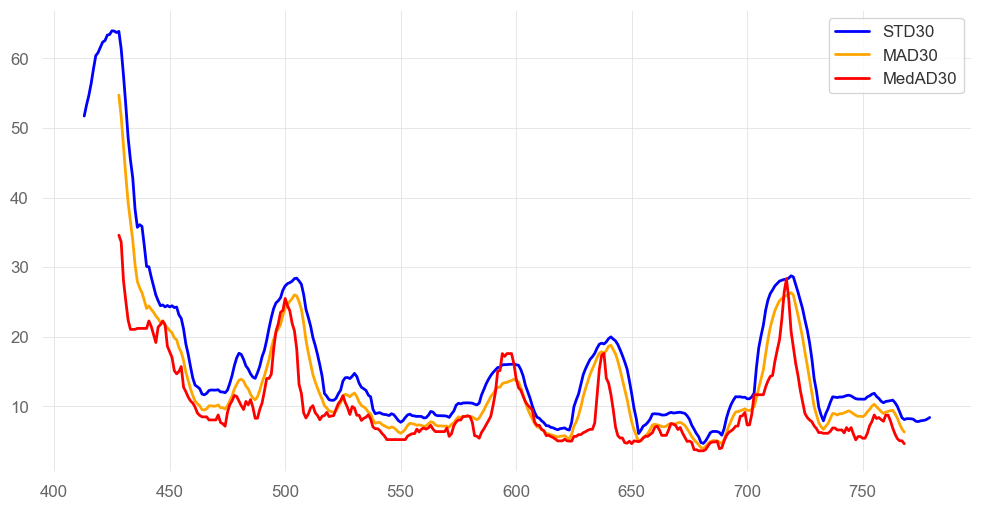

In [416]:
# Let's compare three alternative measures of volatility on a chart

# Select only the columns needed for the chart
data1_plot = data1[['NQ_STD30',
                                            'NQ_MAD30',
                                            'NQ_MedAD30']].copy()

# Filter only the first 3 days
end_date = data1_plot.index.min() + pd.Timedelta(days = 2)
data1_plot = data1_plot.loc[:end_date]
# Add a time column (index as datetime)
data1_plot['time'] = data1_plot.index
# Reset the index so that 'time' is a column
data1_plot = data1_plot.reset_index(drop=True)

# We make a plot by observation number – so that there are no gaps between sessions
plt.figure(figsize = (12, 6))   
plt.plot(data1_plot.index, 
         data1_plot['NQ_STD30'], 
         label = 'STD30', 
         color = 'blue',  
         linewidth = 2)
plt.plot(data1_plot.index,
            data1_plot['NQ_MAD30'], 
            label = 'MAD30', 
            color = 'orange',  
            linewidth = 2)
plt.plot(data1_plot.index,
            data1_plot['NQ_MedAD30'], 
            label = 'MedAD30', 
            color = 'red',  
            linewidth = 2)

# Let's add a legend
plt.legend()

# similar volatility patterns, but alternative measures
# can be used as one of the strategy parameters

In [417]:
#Let's also add rolling window=60 for each approach and further comparison

data1['NQ_SMA60'] = data1['NQ'].rolling(window = 60, 
                                                                                min_periods = 30).mean()

data1['NQ_EMA60'] = data1['NQ'].ewm(span = 60, 
                                                                            min_periods = 30).mean()

data1['NQ_STD60'] = data1['NQ'].rolling(window = 60,
                                                                                min_periods = 30).std()

data1['NQ_MAD60'] = data1['NQ'].rolling(window = 60,
                                                                                min_periods = 30).apply(
    lambda x: np.mean(np.abs(x - np.mean(x))), raw = True)

# and also Median Absolute Deviation (MedAD)

data1['NQ_MedAD60'] = data1['NQ'].rolling(window = 60,
                                                                                  min_periods = 30).apply(
    lambda x: np.median(np.abs(x - np.median(x))), raw = True)

In [418]:
data1

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,NQ_SMA60,NQ_EMA60,NQ_STD60,NQ_MAD60,NQ_MedAD60
datetime,,,,,,,,,,,,,,,
2023-01-02 09:31:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-30 15:56:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.730985,NaN,NaN,22652.449963,22648.997635,15.005396,NaN,NaN
2025-06-30 15:57:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.838117,NaN,NaN,22653.048623,22648.997635,14.483319,NaN,NaN
2025-06-30 15:58:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.031863,NaN,NaN,22653.506019,22648.997635,14.232848,NaN,NaN


In [419]:
#Saving the results
data1.to_parquet("data1_SMA_EMA.parquet")

### CALCULATING POSITION AND PNL OF DEVELOPPED STRATEGIES

In [431]:
#Loading data

data1 = pd.read_parquet('data1_SMA_EMA.parquet')
data1.head(401)

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,NQ_SMA60,NQ_EMA60,NQ_STD60,NQ_MAD60,NQ_MedAD60
datetime,,,,,,,,,,,,,,,
2023-01-02 09:31:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [588]:
# Assumptions for NQ futures:
# NQ – futures contract for NASDAQ index (transaction cost = 12$, point value = 20$).

1) Single SMA20

In [432]:
# Let's calculate the position for the MOMENTUM strategy:
# - if price(t-1) > SMA20(t-1) => pos(t) = 1 [long]
# - if price(t-1) <= SMA20(t-1) => pos(t) = -1 [short]

# We can easily read the data from the 
# previous observation using .shift(1)

cond1_mom_long = data1['NQ'].shift(1) > data1['NQ_SMA20'].shift(1)

# We put 1 where the condition is met,
# -1 where it is not met

data1['position1_mom'] = np.where(cond1_mom_long, 1, -1)

# NOTE! This strategy always has a position!
# (always in the market)

In [433]:
# Let's calculate the position for the MEAN-REVERTING strategy:
# - if price(t-1) > SMA20(t-1) => pos(t) = -1 [short]
# - if price(t-1) <= SMA20(t-1) => pos(t) = 1 [long]

# For simplicity, we can use the same condition.

# Now we put -1 where the condition is met,
# 1 where it is not met.

data1['position1_mr'] = np.where(cond1_mom_long, -1, 1)

In [434]:
data1

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,NQ_SMA60,NQ_EMA60,NQ_STD60,NQ_MAD60,NQ_MedAD60,position1_mom,position1_mr
datetime,,,,,,,,,,,,,,,,,
2023-01-02 09:31:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,1
2023-01-02 09:32:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,1
2023-01-02 09:33:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,1
2023-01-02 09:34:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,1
2023-01-02 09:35:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-30 15:56:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.730985,NaN,NaN,22652.449963,22648.997635,15.005396,NaN,NaN,-1,1
2025-06-30 15:57:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.838117,NaN,NaN,22653.048623,22648.997635,14.483319,NaN,NaN,-1,1
2025-06-30 15:58:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.031863,NaN,NaN,22653.506019,22648.997635,14.232848,NaN,NaN,-1,1


In [435]:
# We need to additionally check whether we're comparing
# NaN values, because Python doesn't automatically check for this

# Let's add filters that check for NaN values
lagprice_nonmiss = data1['NQ'].shift(1).notna()
lagsma_nonmiss = data1['NQ_SMA20'].shift(1).notna()

# Now we can add these conditions to our strategies.
# If any of the values ​​are missing,
# then we cannot make a position decision

data1['position1_mom'] = np.where(
        lagprice_nonmiss & lagsma_nonmiss,
        np.where(cond1_mom_long, 1, -1),
        np.nan)

data1['position1_mr'] = np.where(
        lagprice_nonmiss & lagsma_nonmiss,
        np.where(cond1_mom_long, -1, 1),
        np.nan)

# let's check if everything works
data1.tail(10)

# now it is better

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,NQ_SMA60,NQ_EMA60,NQ_STD60,NQ_MAD60,NQ_MedAD60,position1_mom,position1_mr
datetime,,,,,,,,,,,,,,,,,
2025-06-30 15:51:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.232753,NaN,NaN,22648.490525,22648.997635,19.492214,NaN,NaN,1.0,-1.0
2025-06-30 15:52:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.330298,NaN,NaN,22649.311293,22648.997635,18.605615,NaN,NaN,NaN,NaN
2025-06-30 15:53:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.352557,NaN,NaN,22650.113474,22648.997635,17.730239,NaN,NaN,NaN,NaN
2025-06-30 15:54:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.433539,NaN,NaN,22650.944125,22648.997635,16.734187,NaN,NaN,NaN,NaN
2025-06-30 15:55:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.547962,NaN,NaN,22651.764364,22648.997635,15.711295,NaN,NaN,NaN,NaN
2025-06-30 15:56:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.730985,NaN,NaN,22652.449963,22648.997635,15.005396,NaN,NaN,NaN,NaN
2025-06-30 15:57:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.838117,NaN,NaN,22653.048623,22648.997635,14.483319,NaN,NaN,NaN,NaN
2025-06-30 15:58:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.031863,NaN,NaN,22653.506019,22648.997635,14.232848,NaN,NaN,NaN,NaN
2025-06-30 15:59:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.254807,NaN,NaN,22654.039725,22648.997635,13.838981,NaN,NaN,NaN,NaN


In [436]:
# Let's also assume that:
# - We ALWAYS exit positions 20 minutes before the end of the session (at 3:40 PM) -> signal=(-1) at 15:40
# - We NEVER enter positions in the first 25 minutes of the session (until 9:55 AM) -> signal=0

# We change the position to 0 for the 9:30–9:55 AM range

data1.loc[
    data1.between_time("09:30", "09:55").index,
    ['position1_mom', 'position1_mr']
] = 0

# For the interval 15:40–16:00
data1.loc[
    data1.between_time("15:41", "16:00").index,
    ['position1_mom', 'position1_mr']
] = 0

data1.tail(20)

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,NQ_SMA60,NQ_EMA60,NQ_STD60,NQ_MAD60,NQ_MedAD60,position1_mom,position1_mr
datetime,,,,,,,,,,,,,,,,,
2025-06-30 15:41:00+00:00,22670.075,6201.595,22660.28605,22659.1023,22654.296700,22659.436026,22652.479340,10.108897,8.346473,7.6325,22633.914483,22640.297785,27.931577,22.393539,17.3110,0.0,0.0
2025-06-30 15:42:00+00:00,22670.389,6201.419,22660.82510,22660.3681,22655.133067,22661.427476,22653.634802,10.373216,8.415653,7.2555,22635.542483,22641.284385,27.139146,21.379806,17.0060,0.0,0.0
2025-06-30 15:43:00+00:00,22674.564,6202.353,22661.70230,22662.2114,22656.076033,22663.815935,22654.985073,10.816534,8.555093,7.2555,22637.293033,22642.375523,26.179549,20.332123,16.4165,0.0,0.0
2025-06-30 15:44:00+00:00,22677.586,6203.375,22662.63055,22663.6403,22657.099333,22666.319583,22656.443197,11.355920,8.762756,7.1875,22638.977467,22643.529968,25.444084,19.505009,15.7220,0.0,0.0
2025-06-30 15:45:00+00:00,22666.053,6200.426,22662.92000,22663.9880,22657.717100,22666.271113,22657.063184,11.320878,8.618347,6.6280,22640.422267,22644.268430,24.443249,18.686373,15.2230,0.0,0.0
2025-06-30 15:46:00+00:00,22668.721,6201.941,22663.06230,22664.7569,22658.632667,22666.716547,22657.815302,11.050996,8.307178,6.6280,22641.715050,22645.070155,23.837036,18.214913,14.1450,0.0,0.0
2025-06-30 15:47:00+00:00,22669.743,6202.694,22662.99625,22665.9502,22659.822333,22667.266811,22658.584831,10.202148,7.755533,6.0280,22643.059700,22645.879103,23.080185,17.704210,13.1285,0.0,0.0
2025-06-30 15:48:00+00:00,22677.831,6204.918,22663.52230,22668.4714,22661.217067,22669.187573,22659.826519,9.678196,7.544271,5.9000,22644.513600,22646.926708,22.458579,17.312427,12.4840,0.0,0.0
2025-06-30 15:49:00+00:00,22679.210,6206.386,22664.22685,22670.9671,22662.552300,22671.009832,22661.077066,9.284384,7.408567,5.9890,22646.008600,22647.985179,21.708087,16.848160,12.2610,0.0,0.0


In [437]:
# Let's calculate the gross PnL for both strategies

# We'll calculate the price change for NQ at a given moment
# using the diff() function, which returns the difference
# between the current and previous values

# MOMENTUM strategy:
data1['pnl_gross1_mom'] = (
    data1['NQ'].diff() * 
    data1['position1_mom'])

# similarly for the mean reversion strategy
data1['pnl_gross1_mr'] = (
    data1['NQ'].diff() * 
    data1['position1_mr'])

# we replace missing values with 0
data1['pnl_gross1_mom'] = data1['pnl_gross1_mom'].fillna(0)
data1['pnl_gross1_mr'] = data1['pnl_gross1_mr'].fillna(0)

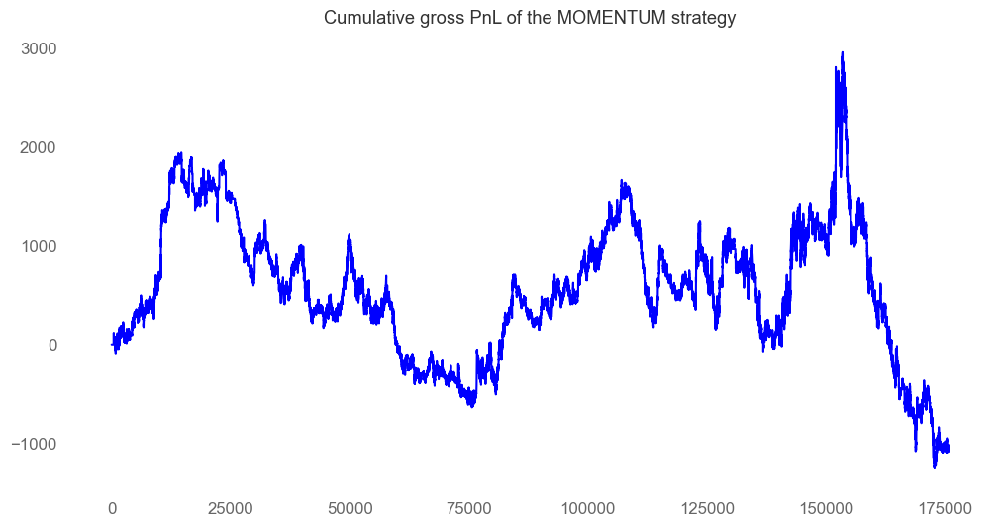

In [438]:
# Let's draw a cumulative PnL chart without adding any columns to the data

# Let's create a copy of the data for the chart
data1_plot = data1.copy()

# Let's convert the index to a column so we can 
# draw a graph without gaps in the time data.
data1_plot.reset_index(inplace=True)

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross1_mom']), 
    color='blue')
plt.title("Cumulative gross PnL of the MOMENTUM strategy")
plt.grid()

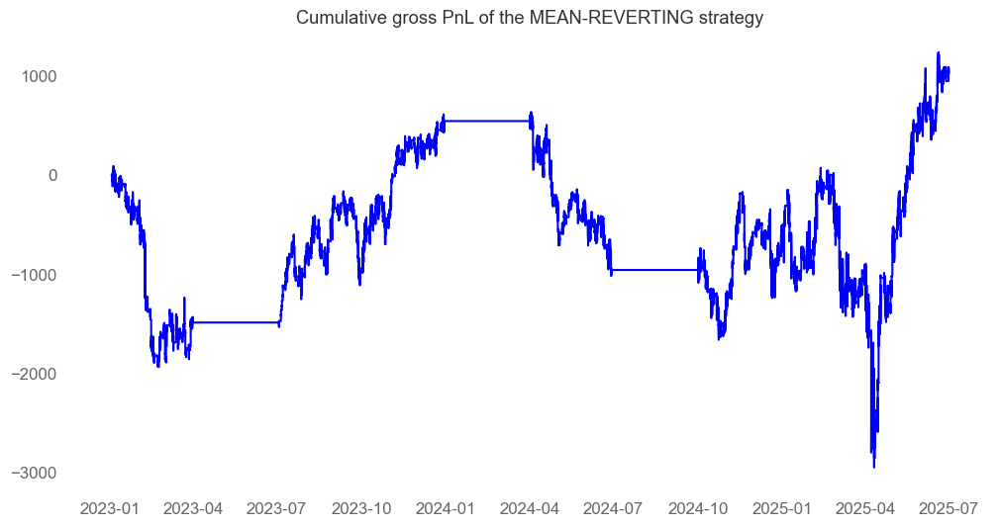

In [439]:
# Let's see what the cumulative PnL looks like
# for the MEAN-REVERTING strategy

plt.figure(figsize=(12, 6))
plt.plot(
    data1.index, 
    np.cumsum(data1['pnl_gross1_mr']), 
    color='blue')
plt.title("Cumulative gross PnL of the MEAN-REVERTING strategy")
plt.grid()

In [440]:
# Let's calculate the number of transactions (this is simply the absolute value
# of position changes in a given minute) - it will be identical
# for the MOMENTUM and MEAN-REVERTING strategies
# based on the same data

data1['ntrans1'] = data1['position1_mom'].diff().abs()

In [441]:
# Given the number of transactions per minute,
# we can calculate the net PnL.

# we assume each transaction costs $12.

# for the MOMENTUM strategy
data1['pnl_net1_mom'] = (
    data1['pnl_gross1_mom'] -
    12 * data1['ntrans1'])

#  and for the MEAN-REVERTING approach
data1['pnl_net1_mr'] = (
    data1['pnl_gross1_mr'] -
    12* data1['ntrans1'])

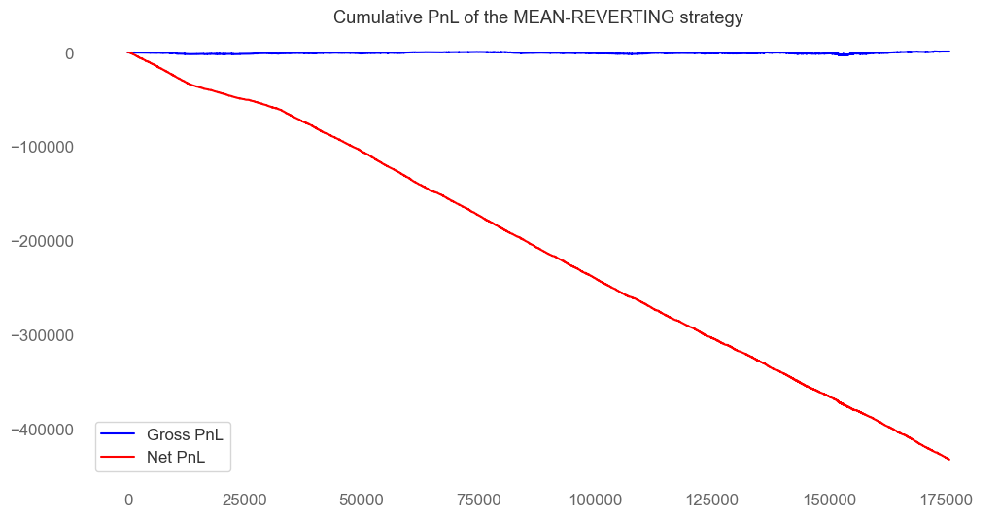

In [442]:
# Let's plot the cumulative gross and net PnL for the MEAN-REVERTING 
# strategy (only this one was profitable in the gross sense)

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross1_mr']), 
    color='blue', label='Gross PnL')
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_net1_mr']), 
    color='red', label='Net PnL')
plt.title("Cumulative PnL of the MEAN-REVERTING strategy")
plt.legend()
plt.grid()

# no chance of profiting from this strategy...

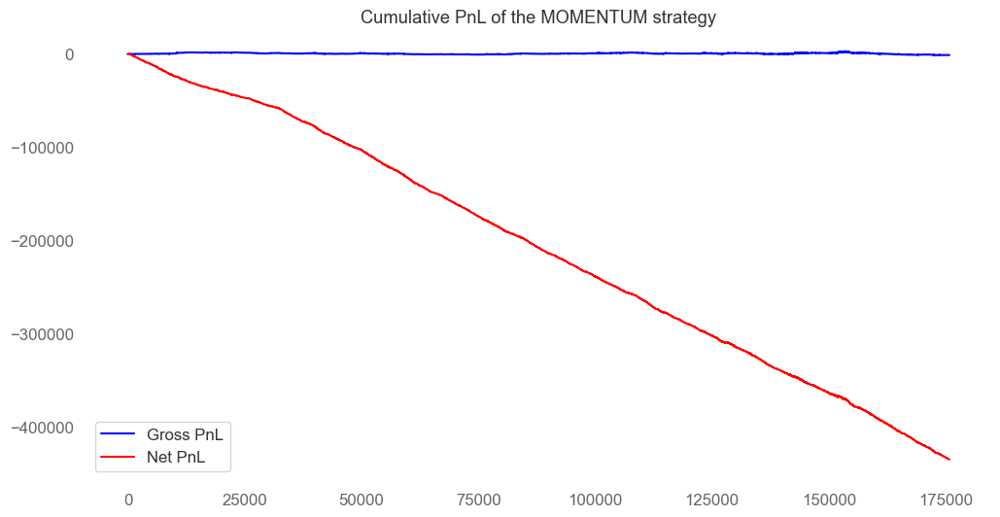

In [443]:
# How about MOMENTUM strategy?

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross1_mom']), 
    color='blue', label='Gross PnL')
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_net1_mom']), 
    color='red', label='Net PnL')
plt.title("Cumulative PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# still big loss ...

In [ ]:
# let's calculate the cumulative costs over the entire period

data1['ntrans1'].sum() * 12

# approximately 433 k $

np.float64(433644.0)

In [445]:
# Let's load the position visualization function
# prepared by the lecturer

from functions.plot_positions import plot_positions_ma

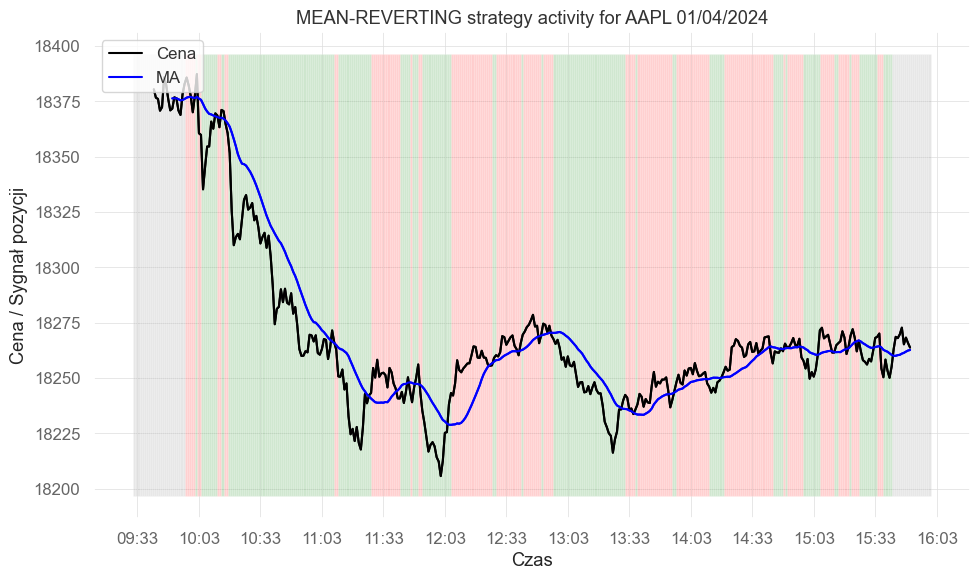

<Axes: title={'center': 'MEAN-REVERTING strategy activity for AAPL 01/04/2024'}, xlabel='Czas', ylabel='Cena / Sygnał pozycji'>

In [446]:
# let's see the strategy activity for the selected day

plot_positions_ma(
    data_plot = data1, # DataFrame with DatetimeIndex
    date_plot = '2024-04-01',      # Date as string 'YYYY-MM-DD'
    col_price = 'NQ',      # column with price
    col_ma = 'NQ_SMA20',   # column with moving average/median
    col_pos = 'position1_mr',      # column with position (-1, 0, 1)
    title = 'MEAN-REVERTING strategy activity for AAPL 01/04/2024')

# the function also has a save_graph argument (default: False),
# which saves the graph to a .png file
# you must also provide the file name in the file_name argument

# the strategy changes positions quite often...

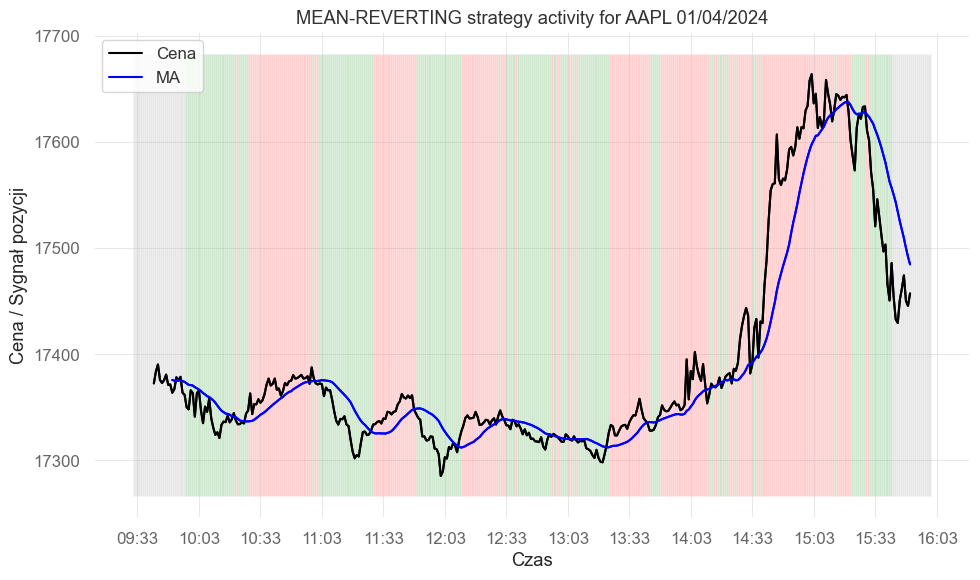

<Axes: title={'center': 'MEAN-REVERTING strategy activity for AAPL 01/04/2024'}, xlabel='Czas', ylabel='Cena / Sygnał pozycji'>

In [447]:
# let's see another day

plot_positions_ma(
    data_plot = data1, # DataFrame with DatetimeIndex
    date_plot = '2024-05-01',      # Date as string 'YYYY-MM-DD'
    col_price = 'NQ',      # column with price
    col_ma = 'NQ_SMA20',   # column with moving average/median
    col_pos = 'position1_mr',      # column with position (-1, 0, 1)
    title = 'MEAN-REVERTING strategy activity for AAPL 01/04/2024')

# the function also has a save_graph argument (default: False),
# which saves the graph to a .png file
# you must also provide the file name in the file_name argument

# the strategy changes positions quite often...

2b) 2 EMA (EMA60, EMA10)

In [448]:
# Let's calculate the position for the MOMENTUM strategy
# if fast MA(t-1) > slow MA(t-1) => pos(t) = 1 [long]
# if fast MA(t-1) <= slow MA(t-1) => pos(t) = -1 [short]

# NOTE: This strategy also always has a position! (no flat- for now only on restricted times)

cond2b_mom_long = data1['NQ_EMA10'].shift(1) > data1['NQ_EMA60'].shift(1)

# let's add filters that will check for NaN values
lagsema10_nonmiss = data1['NQ_EMA10'].shift(1).notna()
lagsema60_nonmiss = data1['NQ_EMA60'].shift(1).notna()

# Now we can add these conditions to our strategies
# If any of the values ​​are missing,
# then we cannot make a position decision

data1['position2b_mom'] = np.where(
        lagsema10_nonmiss & lagsema60_nonmiss,
        np.where(cond2b_mom_long, 1, -1),
        np.nan)

data1['position2b_mr'] = np.where(
        lagsema10_nonmiss & lagsema60_nonmiss,
        np.where(cond2b_mom_long, -1, 1),
        np.nan)
        

In [449]:
# Let's also assume that:
# - We ALWAYS exit positions 20 minutes before the end of the session (at 3:40 PM)
# - We NEVER enter positions in the first 25 minutes of the session (until 9:55 AM)

# We change the position to 0 for the 9:30–9:55 AM range

data1.loc[
    data1.between_time("09:30", "09:55").index,
    ['position2b_mom', 'position2b_mr']
] = 0

# For the interval 15:40–16:00
data1.loc[
    data1.between_time("15:41", "16:00").index,
    ['position2b_mom', 'position2b_mr']
] = 0

data1.tail(20)

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,...,NQ_MedAD60,position1_mom,position1_mr,pnl_gross1_mom,pnl_gross1_mr,ntrans1,pnl_net1_mom,pnl_net1_mr,position2b_mom,position2b_mr
datetime,,,,,,,,,,,,,,,,,,,,,
2025-06-30 15:41:00+00:00,22670.075,6201.595,22660.28605,22659.1023,22654.296700,22659.436026,22652.479340,10.108897,8.346473,7.6325,...,17.3110,0.0,0.0,0.0,0.0,1.0,-12.0,-12.0,0.0,0.0
2025-06-30 15:42:00+00:00,22670.389,6201.419,22660.82510,22660.3681,22655.133067,22661.427476,22653.634802,10.373216,8.415653,7.2555,...,17.0060,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:43:00+00:00,22674.564,6202.353,22661.70230,22662.2114,22656.076033,22663.815935,22654.985073,10.816534,8.555093,7.2555,...,16.4165,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:44:00+00:00,22677.586,6203.375,22662.63055,22663.6403,22657.099333,22666.319583,22656.443197,11.355920,8.762756,7.1875,...,15.7220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:45:00+00:00,22666.053,6200.426,22662.92000,22663.9880,22657.717100,22666.271113,22657.063184,11.320878,8.618347,6.6280,...,15.2230,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0
2025-06-30 15:46:00+00:00,22668.721,6201.941,22663.06230,22664.7569,22658.632667,22666.716547,22657.815302,11.050996,8.307178,6.6280,...,14.1450,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:47:00+00:00,22669.743,6202.694,22662.99625,22665.9502,22659.822333,22667.266811,22658.584831,10.202148,7.755533,6.0280,...,13.1285,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:48:00+00:00,22677.831,6204.918,22663.52230,22668.4714,22661.217067,22669.187573,22659.826519,9.678196,7.544271,5.9000,...,12.4840,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:49:00+00:00,22679.210,6206.386,22664.22685,22670.9671,22662.552300,22671.009832,22661.077066,9.284384,7.408567,5.9890,...,12.2610,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [450]:
# Calculating gross and net PnL for the strategy

# Gross
# MOMENTUM strategy:
data1['pnl_gross2b_mom'] = (
    data1['NQ'].diff() * 
    data1['position2b_mom'])

# similarly for the MEAN-REVERTING strategy
data1['pnl_gross2b_mr'] = (
    data1['NQ'].diff() * 
    data1['position2b_mr'])

# we replace missing values with 0
data1['pnl_gross2b_mom'] = data1['pnl_gross2b_mom'].fillna(0)
data1['pnl_gross2b_mr'] = data1['pnl_gross2b_mr'].fillna(0)

# number of transactions
data1['ntrans2b'] = data1['position2b_mom'].diff().abs()

# Net PnL
# for the MOMENTUM strategy
data1['pnl_net2b_mom'] = (
    data1['pnl_gross2b_mom'] -
    12 * data1['ntrans2b'])

# for the MEAN-REVERTING strategy
data1['pnl_net2b_mr'] = (
    data1['pnl_gross2b_mr'] -
    12 * data1['ntrans2b'])

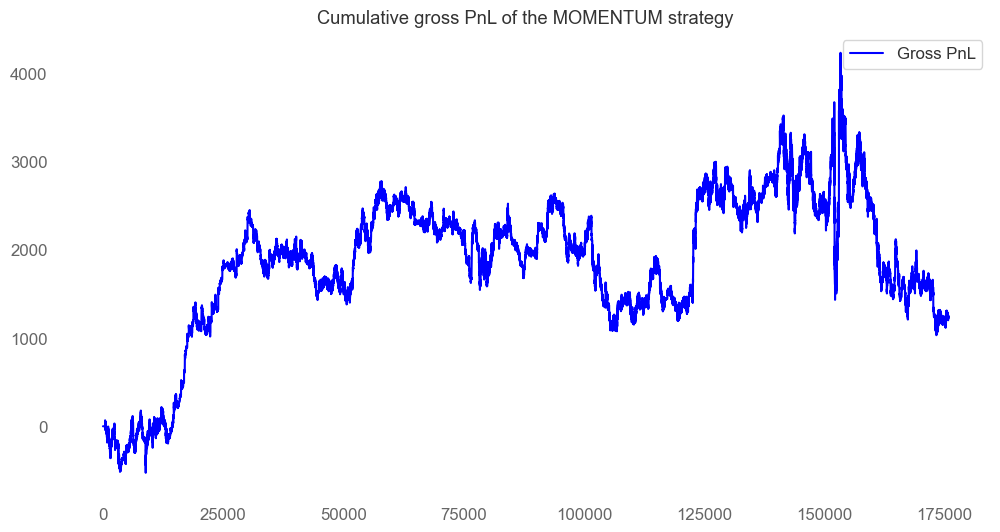

In [451]:
# let's draw the cumulative gross PnL for the MOMENTUM strategy

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross2b_mom']), 
    color='blue', label='Gross PnL')
plt.title("Cumulative gross PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# I don't think you can make any money here (neither MOM nor MR)...

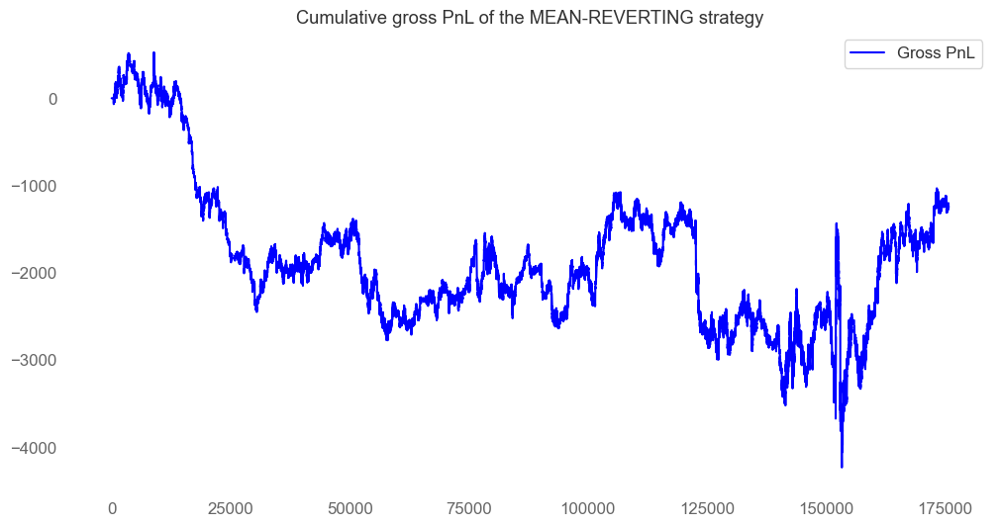

In [452]:
# let's draw the cumulative gross PnL for the MEAN-REVERTING strategy

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross2b_mr']), 
    color='blue', label='Gross PnL')
plt.title("Cumulative gross PnL of the MEAN-REVERTING strategy")
plt.legend()
plt.grid()

# I don't think you can make any money here (neither MOM nor MR)...

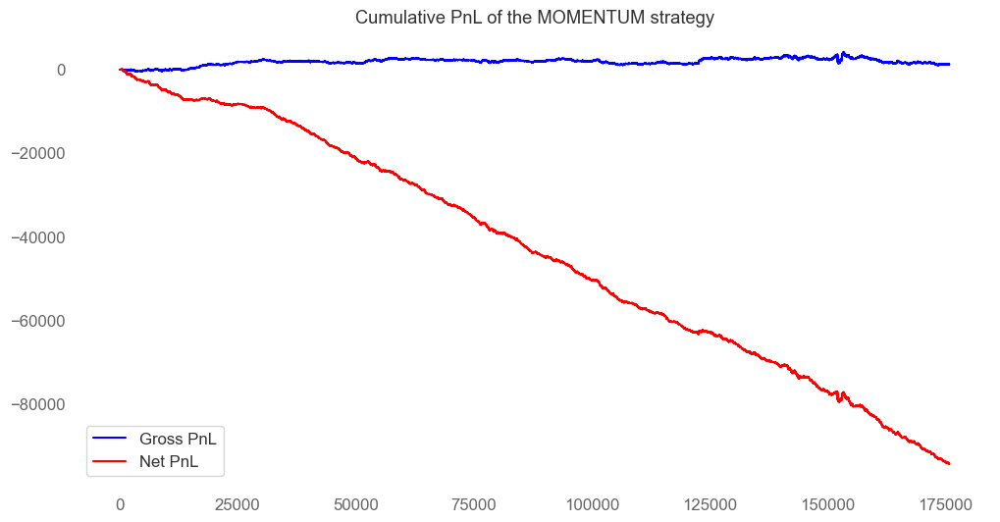

In [ ]:
# Let's add the cumulative net PnL for the MOMENTUM strategy
# (only this one was profitable in the gross sense)

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross2b_mom']), 
    color='blue', label='Gross PnL')
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_net2b_mom']), 
    color='red', label='Net PnL')
plt.title("Cumulative PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# even higher loss

In [ ]:
# let's calculate the cumulative costs of this strategy over the entire period

data1['ntrans2b'].sum() * 12

# over $95 k - 4-5 times more than in the single MA strategy,
# but still a lot

np.float64(95664.0)

In [455]:
from functions.plot_positions import plot_positions_2mas

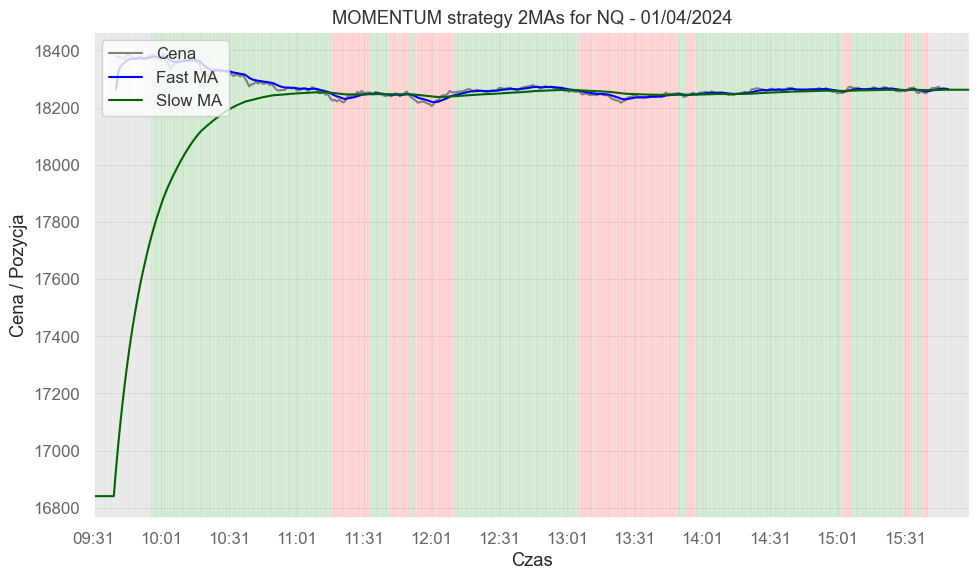

<Axes: title={'center': 'MOMENTUM strategy 2MAs for NQ - 01/04/2024'}, xlabel='Czas', ylabel='Cena / Pozycja'>

In [456]:
plot_positions_2mas(
    data_plot=data1,
    date_plot='2024-04-01',
    col_price='NQ',
    col_fma='NQ_EMA10',
    col_sma='NQ_EMA60',
    col_pos='position2b_mom',
    title='MOMENTUM strategy 2MAs for NQ - 01/04/2024',
    save_graph=False
)

# This strategy changes positions less frequently than 
# the previous one, but still too often to be profitable.

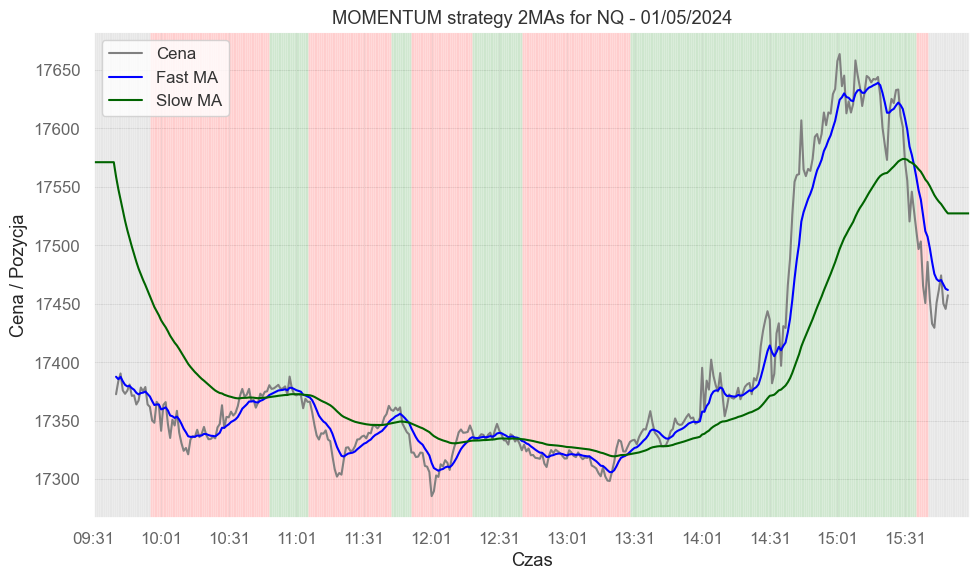

<Axes: title={'center': 'MOMENTUM strategy 2MAs for NQ - 01/05/2024'}, xlabel='Czas', ylabel='Cena / Pozycja'>

In [457]:
#Another day
plot_positions_2mas(
    data_plot=data1,
    date_plot='2024-05-01',
    col_price='NQ',
    col_fma='NQ_EMA10',
    col_sma='NQ_EMA60',
    col_pos='position2b_mom',
    title='MOMENTUM strategy 2MAs for NQ - 01/05/2024',
    save_graph=False
)


2a) 2 EMA (EMA60, EMA30)

In [458]:
# Let's calculate the position for the MOMENTUM strategy
# if fast MA(t-1) > slow MA(t-1) => pos(t) = 1 [long]
# if fast MA(t-1) <= slow MA(t-1) => pos(t) = -1 [short]

# NOTE: This strategy also always has a position! (no flat- for now only on restricted times)

cond2a_mom_long = data1['NQ_EMA30'].shift(1) > data1['NQ_EMA60'].shift(1)

# let's add filters that will check for NaN values
lagsema30_nonmiss = data1['NQ_EMA30'].shift(1).notna()
lagsema60_nonmiss = data1['NQ_EMA60'].shift(1).notna()

# Now we can add these conditions to our strategies
# If any of the values ​​are missing,
# then we cannot make a position decision

data1['position2a_mom'] = np.where(
        lagsema30_nonmiss & lagsema60_nonmiss,
        np.where(cond2a_mom_long, 1, -1),
        np.nan)

data1['position2a_mr'] = np.where(
        lagsema30_nonmiss & lagsema60_nonmiss,
        np.where(cond2a_mom_long, -1, 1),
        np.nan)
        

In [459]:
# Let's also assume that:
# - We ALWAYS exit positions 20 minutes before the end of the session (at 3:40 PM)
# - We NEVER enter positions in the first 25 minutes of the session (until 9:55 AM)

# We change the position to 0 for the 9:30–9:55 AM range

data1.loc[
    data1.between_time("09:30", "09:55").index,
    ['position2a_mom', 'position2a_mr']
] = 0

# For the interval 15:40–16:00
data1.loc[
    data1.between_time("15:41", "16:00").index,
    ['position2a_mom', 'position2a_mr']
] = 0

data1.tail(20)

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,...,pnl_net1_mr,position2b_mom,position2b_mr,pnl_gross2b_mom,pnl_gross2b_mr,ntrans2b,pnl_net2b_mom,pnl_net2b_mr,position2a_mom,position2a_mr
datetime,,,,,,,,,,,,,,,,,,,,,
2025-06-30 15:41:00+00:00,22670.075,6201.595,22660.28605,22659.1023,22654.296700,22659.436026,22652.479340,10.108897,8.346473,7.6325,...,-12.0,0.0,0.0,0.0,0.0,1.0,-12.0,-12.0,0.0,0.0
2025-06-30 15:42:00+00:00,22670.389,6201.419,22660.82510,22660.3681,22655.133067,22661.427476,22653.634802,10.373216,8.415653,7.2555,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:43:00+00:00,22674.564,6202.353,22661.70230,22662.2114,22656.076033,22663.815935,22654.985073,10.816534,8.555093,7.2555,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:44:00+00:00,22677.586,6203.375,22662.63055,22663.6403,22657.099333,22666.319583,22656.443197,11.355920,8.762756,7.1875,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:45:00+00:00,22666.053,6200.426,22662.92000,22663.9880,22657.717100,22666.271113,22657.063184,11.320878,8.618347,6.6280,...,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0
2025-06-30 15:46:00+00:00,22668.721,6201.941,22663.06230,22664.7569,22658.632667,22666.716547,22657.815302,11.050996,8.307178,6.6280,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:47:00+00:00,22669.743,6202.694,22662.99625,22665.9502,22659.822333,22667.266811,22658.584831,10.202148,7.755533,6.0280,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:48:00+00:00,22677.831,6204.918,22663.52230,22668.4714,22661.217067,22669.187573,22659.826519,9.678196,7.544271,5.9000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:49:00+00:00,22679.210,6206.386,22664.22685,22670.9671,22662.552300,22671.009832,22661.077066,9.284384,7.408567,5.9890,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [460]:
# Calculating gross and net PnL for the strategy

# Gross
# MOMENTUM strategy:
data1['pnl_gross2a_mom'] = (
    data1['NQ'].diff() * 
    data1['position2a_mom'])

# similarly for the MEAN-REVERTING strategy
data1['pnl_gross2a_mr'] = (
    data1['NQ'].diff() * 
    data1['position2a_mr'])

# we replace missing values with 0
data1['pnl_gross2a_mom'] = data1['pnl_gross2a_mom'].fillna(0)
data1['pnl_gross2a_mr'] = data1['pnl_gross2a_mr'].fillna(0)

# number of transactions
data1['ntrans2a'] = data1['position2a_mom'].diff().abs()

# Net PnL
# for the MOMENTUM strategy
data1['pnl_net2a_mom'] = (
    data1['pnl_gross2a_mom'] -
    12 * data1['ntrans2a'])

# for the MEAN-REVERTING strategy
data1['pnl_net2a_mr'] = (
    data1['pnl_gross2a_mr'] -
    12 * data1['ntrans2a'])

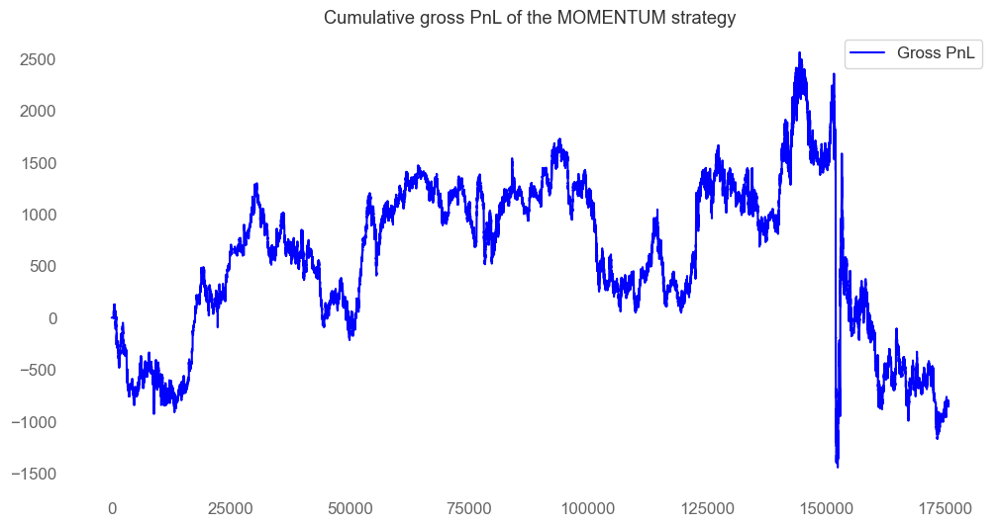

In [461]:
# let's draw the cumulative gross PnL for the MOMENTUM strategy

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross2a_mom']), 
    color='blue', label='Gross PnL')
plt.title("Cumulative gross PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# Even lower gross PnL value

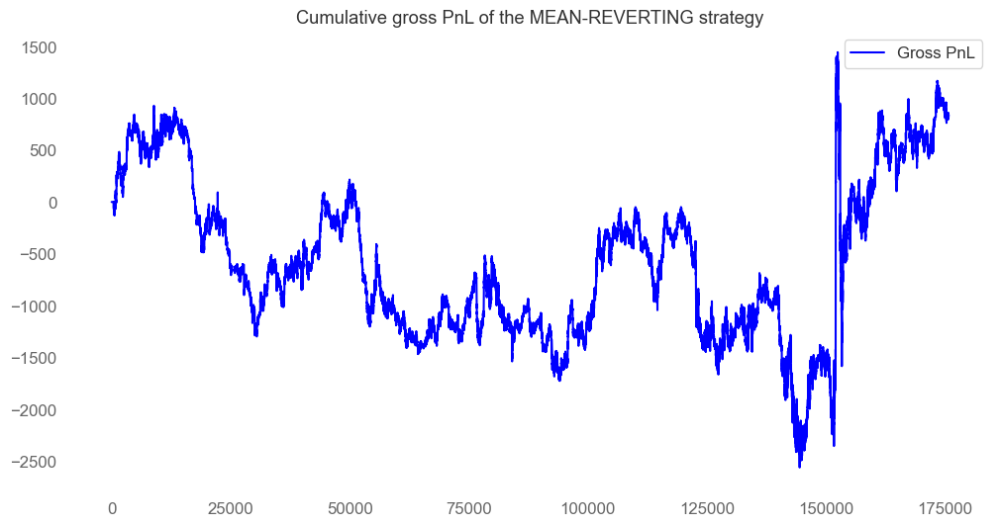

In [462]:
# let's draw the cumulative gross PnL for the MEAN-REVERTING strategy

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross2a_mr']), 
    color='blue', label='Gross PnL')
plt.title("Cumulative gross PnL of the MEAN-REVERTING strategy")
plt.legend()
plt.grid()

# Even lower gross PnL value

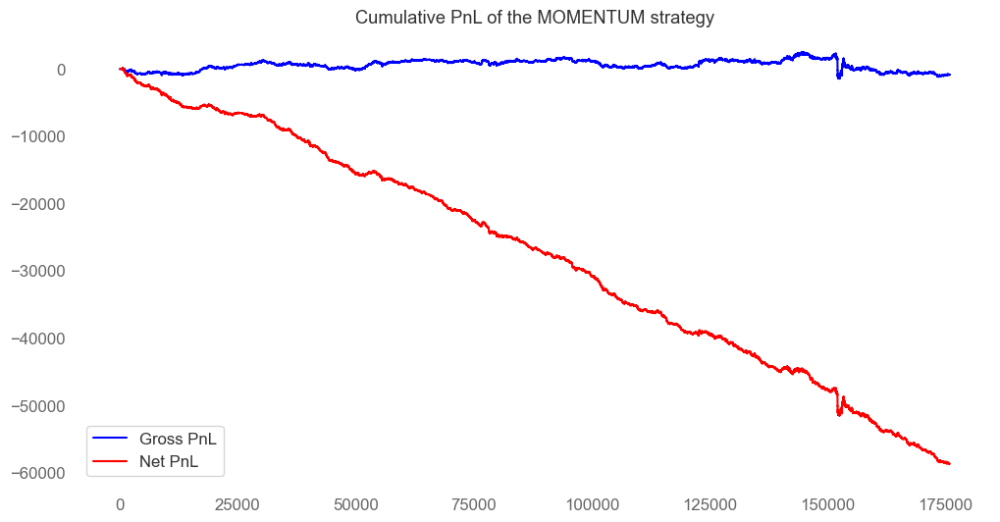

In [463]:
# Let's add the cumulative net PnL for the MOMENTUM strategy
# (only this one was profitable in the gross sense)

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross2a_mom']), 
    color='blue', label='Gross PnL')
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_net2a_mom']), 
    color='red', label='Net PnL')
plt.title("Cumulative PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# closer, closer to net=0 at least ...

In [ ]:
# let's calculate the cumulative costs of this strategy over the entire period

data1['ntrans2a'].sum() * 12

# in between with single SMA/double EMAs

np.float64(57888.0)

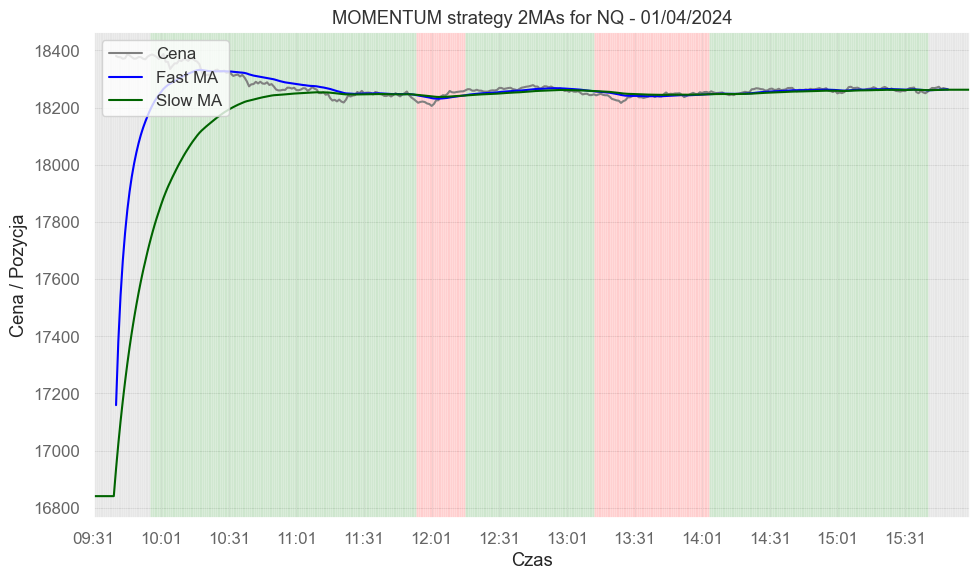

<Axes: title={'center': 'MOMENTUM strategy 2MAs for NQ - 01/04/2024'}, xlabel='Czas', ylabel='Cena / Pozycja'>

In [465]:
plot_positions_2mas(
    data_plot=data1,
    date_plot='2024-04-01',
    col_price='NQ',
    col_fma='NQ_EMA30',
    col_sma='NQ_EMA60',
    col_pos='position2a_mom',
    title='MOMENTUM strategy 2MAs for NQ - 01/04/2024',
    save_graph=False
)


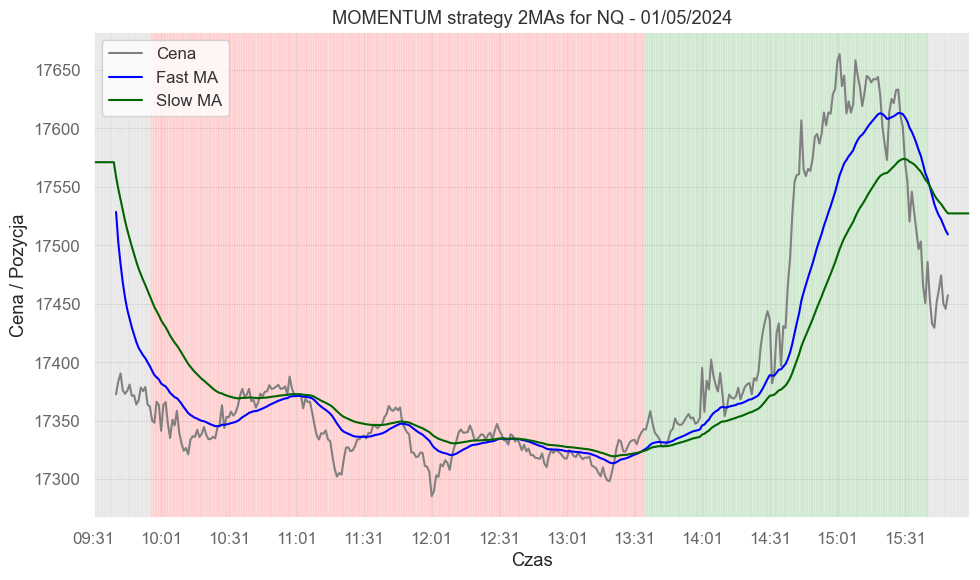

<Axes: title={'center': 'MOMENTUM strategy 2MAs for NQ - 01/05/2024'}, xlabel='Czas', ylabel='Cena / Pozycja'>

In [466]:
plot_positions_2mas(
    data_plot=data1,
    date_plot='2024-05-01',
    col_price='NQ',
    col_fma='NQ_EMA30',
    col_sma='NQ_EMA60',
    col_pos='position2a_mom',
    title='MOMENTUM strategy 2MAs for NQ - 01/05/2024',
    save_graph=False
)
 #only 2 signals

3b) 2 SMA (SMA60, SMA10)

In [467]:
# Let's calculate the position for the MOMENTUM strategy
# if fast MA(t-1) > slow MA(t-1) => pos(t) = 1 [long]
# if fast MA(t-1) <= slow MA(t-1) => pos(t) = -1 [short]

# NOTE: This strategy also always has a position! (no flat- for now only on restricted times)

cond3b_mom_long = data1['NQ_SMA10'].shift(1) > data1['NQ_SMA60'].shift(1)

# let's add filters that will check for NaN values
lagssma10_nonmiss = data1['NQ_SMA10'].shift(1).notna()
lagssma60_nonmiss = data1['NQ_SMA60'].shift(1).notna()

# Now we can add these conditions to our strategies
# If any of the values ​​are missing,
# then we cannot make a position decision

data1['position3b_mom'] = np.where(
        lagssma10_nonmiss & lagssma60_nonmiss,
        np.where(cond3b_mom_long, 1, -1),
        np.nan)

data1['position3b_mr'] = np.where(
        lagssma10_nonmiss & lagssma60_nonmiss,
        np.where(cond3b_mom_long, -1, 1),
        np.nan)
        

In [468]:
# Let's also assume that:
# - We ALWAYS exit positions 20 minutes before the end of the session (at 3:40 PM)
# - We NEVER enter positions in the first 25 minutes of the session (until 9:55 AM)

# We change the position to 0 for the 9:30–9:55 AM range

data1.loc[
    data1.between_time("09:30", "09:55").index,
    ['position3b_mom', 'position3b_mr']
] = 0

# For the interval 15:40–16:00
data1.loc[
    data1.between_time("15:41", "16:00").index,
    ['position3b_mom', 'position3b_mr']
] = 0

data1.tail(20)

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,...,pnl_net2b_mr,position2a_mom,position2a_mr,pnl_gross2a_mom,pnl_gross2a_mr,ntrans2a,pnl_net2a_mom,pnl_net2a_mr,position3b_mom,position3b_mr
datetime,,,,,,,,,,,,,,,,,,,,,
2025-06-30 15:41:00+00:00,22670.075,6201.595,22660.28605,22659.1023,22654.296700,22659.436026,22652.479340,10.108897,8.346473,7.6325,...,-12.0,0.0,0.0,0.0,0.0,1.0,-12.0,-12.0,0.0,0.0
2025-06-30 15:42:00+00:00,22670.389,6201.419,22660.82510,22660.3681,22655.133067,22661.427476,22653.634802,10.373216,8.415653,7.2555,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:43:00+00:00,22674.564,6202.353,22661.70230,22662.2114,22656.076033,22663.815935,22654.985073,10.816534,8.555093,7.2555,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:44:00+00:00,22677.586,6203.375,22662.63055,22663.6403,22657.099333,22666.319583,22656.443197,11.355920,8.762756,7.1875,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:45:00+00:00,22666.053,6200.426,22662.92000,22663.9880,22657.717100,22666.271113,22657.063184,11.320878,8.618347,6.6280,...,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0
2025-06-30 15:46:00+00:00,22668.721,6201.941,22663.06230,22664.7569,22658.632667,22666.716547,22657.815302,11.050996,8.307178,6.6280,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:47:00+00:00,22669.743,6202.694,22662.99625,22665.9502,22659.822333,22667.266811,22658.584831,10.202148,7.755533,6.0280,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:48:00+00:00,22677.831,6204.918,22663.52230,22668.4714,22661.217067,22669.187573,22659.826519,9.678196,7.544271,5.9000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-06-30 15:49:00+00:00,22679.210,6206.386,22664.22685,22670.9671,22662.552300,22671.009832,22661.077066,9.284384,7.408567,5.9890,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [469]:
# Calculating gross and net PnL for the strategy

# Gross
# MOMENTUM strategy:
data1['pnl_gross3b_mom'] = (
    data1['NQ'].diff() * 
    data1['position3b_mom'])

# similarly for the MEAN-REVERTING strategy
data1['pnl_gross3b_mr'] = (
    data1['NQ'].diff() * 
    data1['position3b_mr'])

# we replace missing values with 0
data1['pnl_gross3b_mom'] = data1['pnl_gross3b_mom'].fillna(0)
data1['pnl_gross3b_mr'] = data1['pnl_gross3b_mr'].fillna(0)

# number of transactions
data1['ntrans3b'] = data1['position3b_mom'].diff().abs()

# Net PnL
# for the MOMENTUM strategy
data1['pnl_net3b_mom'] = (
    data1['pnl_gross3b_mom'] -
    12 * data1['ntrans3b'])

# for the MEAN-REVERTING strategy
data1['pnl_net3b_mr'] = (
    data1['pnl_gross3b_mr'] -
    12 * data1['ntrans3b'])

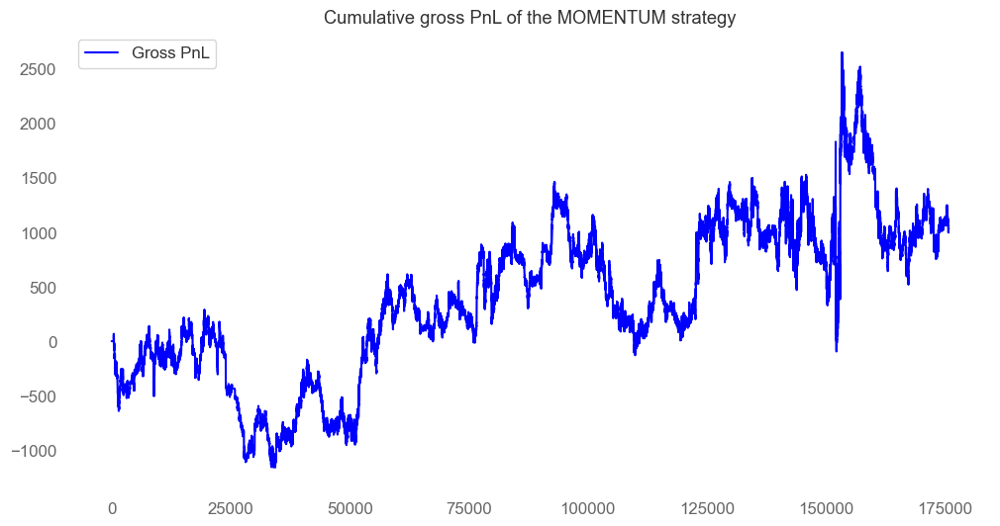

In [470]:
# let's draw the cumulative gross PnL for the MOMENTUM strategy

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross3b_mom']), 
    color='blue', label='Gross PnL')
plt.title("Cumulative gross PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# nice one

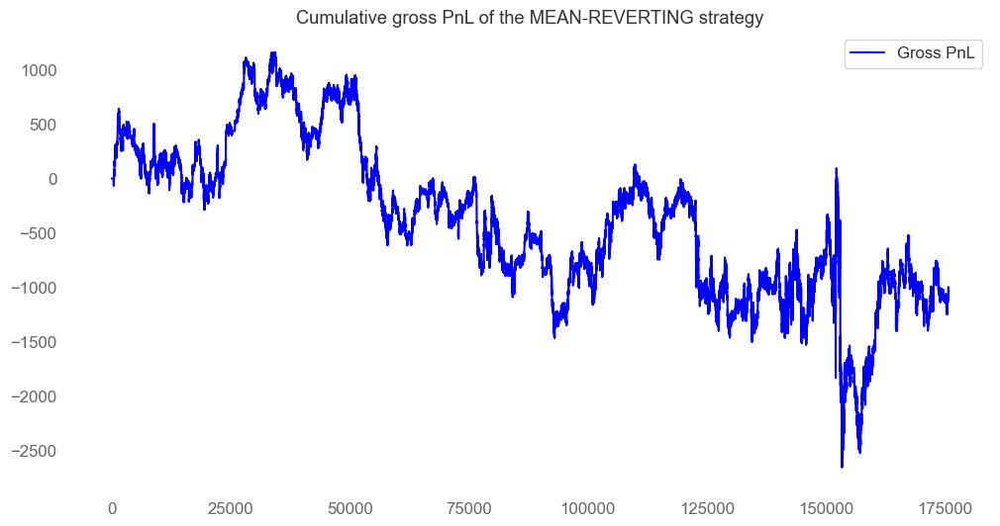

In [ ]:
# let's draw the cumulative gross PnL for the MEAN-REVERTING strategy

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross3b_mr']), 
    color='blue', label='Gross PnL')
plt.title("Cumulative gross PnL of the MEAN-REVERTING strategy")
plt.legend()
plt.grid()


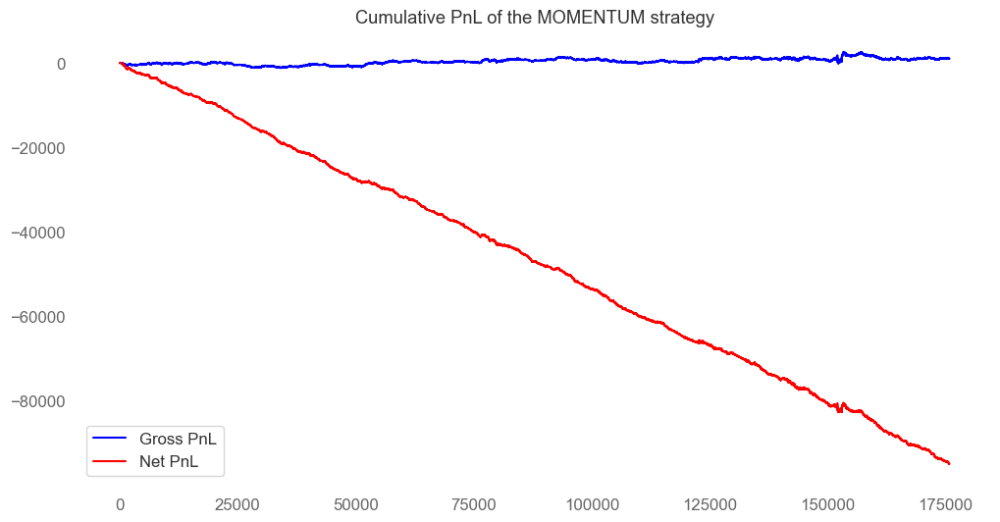

In [472]:
# Let's add the cumulative net PnL for the MOMENTUM strategy
# (only this one was profitable in the gross sense)

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross3b_mom']), 
    color='blue', label='Gross PnL')
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_net3b_mom']), 
    color='red', label='Net PnL')
plt.title("Cumulative PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# but one can see: transactional costs 'eat' all the profit

In [473]:
# let's calculate the cumulative costs of this strategy over the entire period

data1['ntrans3b'].sum() * 12

np.float64(96072.0)

4) VOLATILITY BREAKOUT

In [474]:
# Our strategy's signal will be the NQ price
# (it can also be the NQ fast moving average -
# faster than 60 minutes, which was used in the definition of
# entry/exit boundaries)

# Let's calculate the position for the MOMENTUM strategy
# (a more complicated formula than before)
# if pos(t-1) = 0 and
#   signal(t-1) > upper threshold(t-1) => pos(t) = 1 [long]
#   signal(t-1) < lower threshold(t-1) => pos(t) = -1 [short]
#   otherwise keep 0 position [flat]
# if pos(t-1) = 1 and
#   signal(t-1) > lower threshold(t-1) => pos(t) = 1 [keep long]
#   signal(t-1) < lower threshold(t-1) => pos(t) = -1 [switch to short]
# if pos(t-1) = -1 and
#   signal(t-1) < upper threshold(t-1) => pos(t) = -1 [keep short]
#   signal(t-1) > upper threshold(t-1) => pos(t) = 1 [switch to long]

# NOTE! This strategy always has a position if
# the entry and exit thresholds have the same multiplier!

# we will use a function written by the lecturer for this purpose

from functions.position_VB import positionVB

# function arguments:
# signal: strategy signal
# lower: lower threshold
# upper: upper threshold
# pos_flat - vector indicating when the position must be 0 (flat)
# strategy: strategy type: "mom" or "mr"

In [475]:
# Let's create a pos_flat vector that will indicate
# when the position must be 0 (flat)

# Let's first initialize it with zeros
pos_flat = np.zeros(len(data1))

# We assumed that we didn't want to take positions in the first 25 minutes
# and last 200 minutes of the session (until 9:40 and from 15:51)
pos_flat[(data1.index.time >= pd.to_datetime('15:41').time())] = 1
pos_flat[(data1.index.time <= pd.to_datetime('09:55').time())] = 1

# We only have weekdays in the data, 
# so we don't need to check weekends.

In [476]:
# let's see the frequencies of values ​​in this vector
pd.Series(pos_flat).value_counts()

0.0    155547
1.0     20265
Name: count, dtype: int64

In [477]:
# let's calculate the position for the MOMENTUM strategy
data1['position4_mom'] = positionVB(
    signal = data1['NQ'],  # NQ price is the signal
    lower = data1['NQ_SMA60'] - data1['NQ_STD60'] * 3,  # lower threshold
    upper = data1['NQ_SMA60'] + data1['NQ_STD60'] * 3,  # upper threshold
    pos_flat = pos_flat,  # flat position vector
    strategy = 'mom'  # MOMENTUM strategy
)

# let's calculate the position for the MEAN-REVERTING strategy
# for the same data it will simply be
# the opposite of the MOMENTUM position
data1['position4_mr'] = - data1['position4_mom']


In [478]:
# Calculating gross and net PnL for strategy 4

# Gross
# MOMENTUM strategy:
data1['pnl_gross4_mom'] = (
    data1['NQ'].diff() * 
    data1['position4_mom'])

# similarly for the MEAN-REVERTING strategy
data1['pnl_gross4_mr'] = (
    data1['NQ'].diff() * 
    data1['position4_mr'])

# we replace missing values with 0
data1['pnl_gross4_mom'] = data1['pnl_gross4_mom'].fillna(0)
data1['pnl_gross4_mr'] = data1['pnl_gross4_mr'].fillna(0)

# number of transactions
data1['ntrans4'] = data1['position4_mom'].diff().abs()

# Net PnL
# for the MOMENTUM strategy
data1['pnl_net4_mom'] = (
    data1['pnl_gross4_mom'] -
    1.5 * data1['ntrans4'])

# for the MEAN-REVERTING strategy
data1['pnl_net4_mr'] = (
    data1['pnl_gross4_mr'] -
    1.5 * data1['ntrans4'])

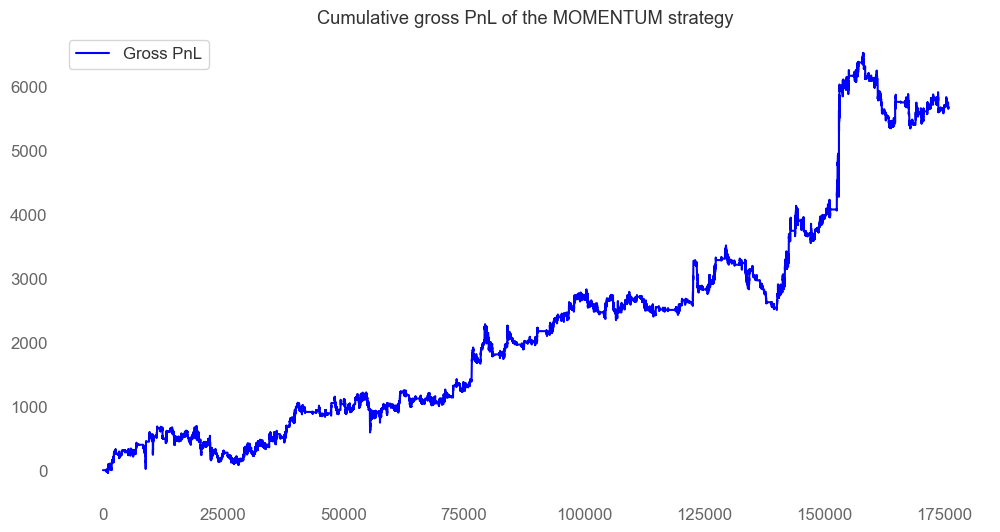

In [479]:
# Let's plot the cumulative gross PnL for the MOMENTUM strategy

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross4_mom']), 
    color='blue', label='Gross PnL')
plt.title("Cumulative gross PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# seems to be profitable, how about net?

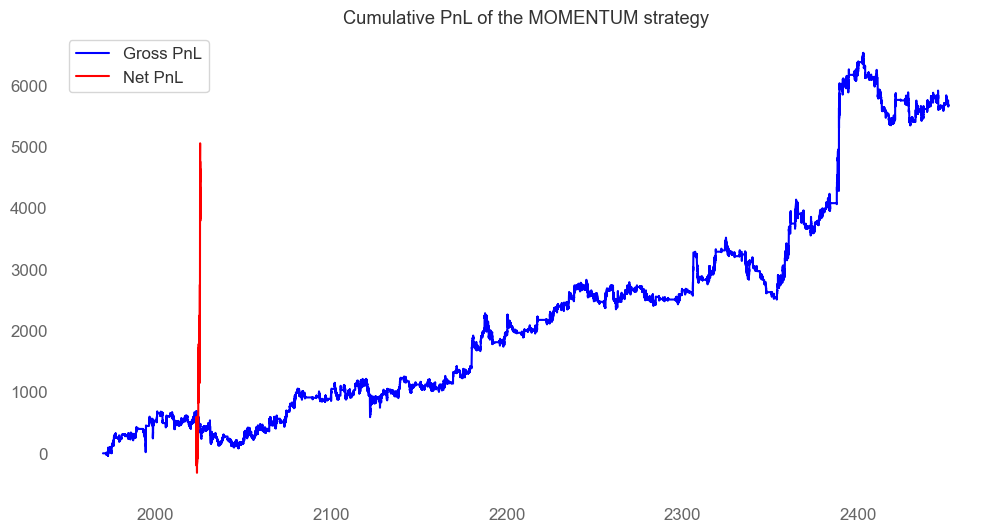

In [480]:
# Let's add the cumulative net PnL for the MOMENTUM strategy (NAPRAWIĆ)

plt.figure(figsize=(12, 6))
plt.plot(
    data1_plot.index, 
    np.cumsum(data1['pnl_gross4_mom']), 
    color='blue', label='Gross PnL')
plt.plot(
    data1.index, 
    np.cumsum(data1['pnl_net4_mom']), 
    color='red', label='Net PnL')

plt.title("Cumulative PnL of the MOMENTUM strategy")
plt.legend()
plt.grid()

# in net terms we are still losing, although "only" about $700

In [ ]:
# let's calculate the cumulative costs of 
# this strategy over the entire period

data1['ntrans4'].sum() * 12

# lowest transactional costs than other models - 12936$

np.float64(12936.0)

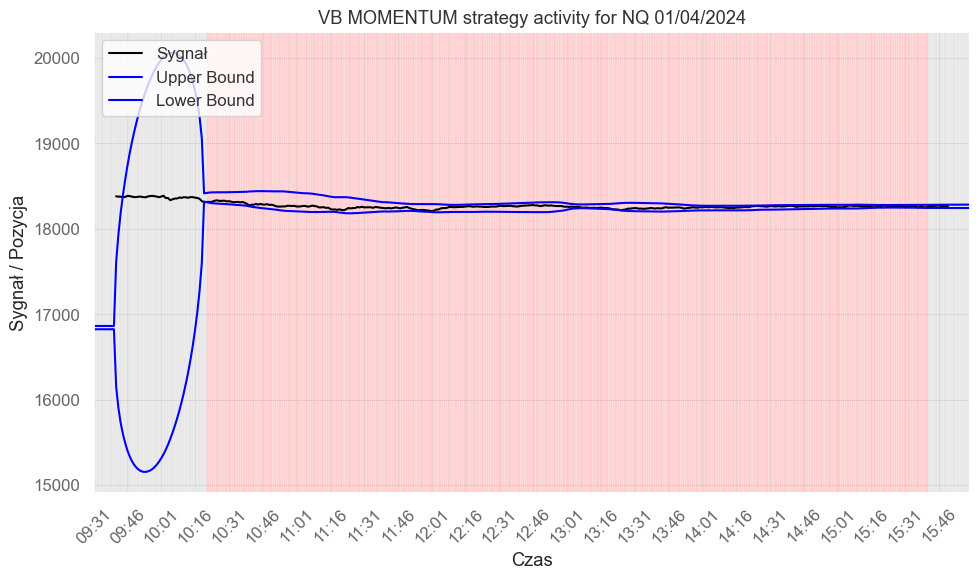

<Axes: title={'center': 'VB MOMENTUM strategy activity for NQ 01/04/2024'}, xlabel='Czas', ylabel='Sygnał / Pozycja'>

In [482]:
# let's load the function to visualize the position
from functions.plot_positions import plot_positions_vb

# the function requires referencing column names from the data frame

# let's create these for col_lower and col_upper
data1['NQ_VB_lower'] = (
    data1['NQ_SMA60'] - 
    data1['NQ_STD60'] * 3)

data1['NQ_VB_upper'] = (
    data1['NQ_SMA60'] +
    data1['NQ_STD60'] * 3)

# let's see the strategy activity for the selected day
plot_positions_vb(
    data_plot = data1, # DataFrame with DatetimeIndex
    date_plot = '2024-04-01',      # Date as string 'YYYY-MM-DD'
    col_signal = 'NQ',      # column with price
    col_lower = 'NQ_VB_lower',  # lower threshold
    col_upper = 'NQ_VB_upper',  # upper threshold
    col_pos = 'position4_mom',     # column with position (-1, 0, 1)
    title = 'VB MOMENTUM strategy activity for NQ 01/04/2024')

# only 1 signal?

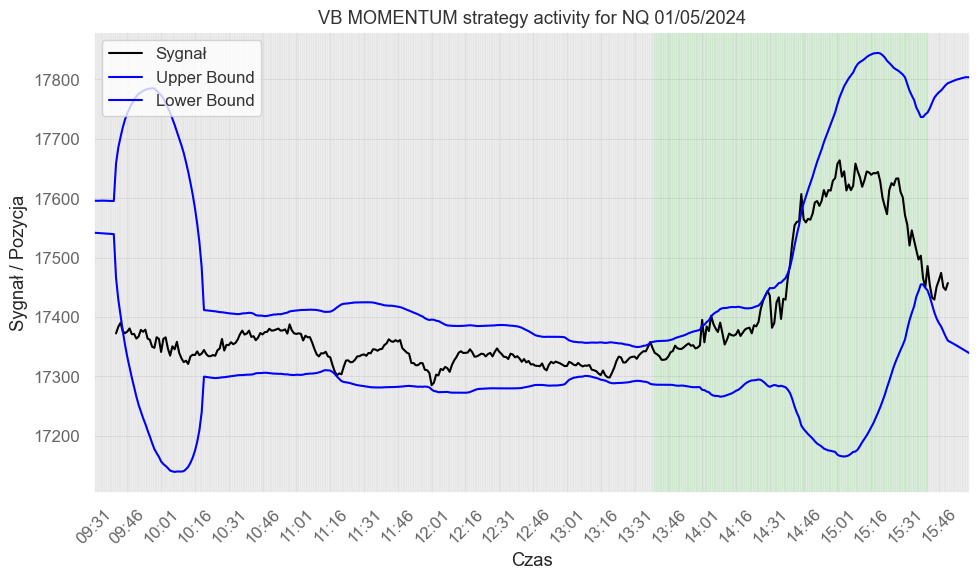

<Axes: title={'center': 'VB MOMENTUM strategy activity for NQ 01/05/2024'}, xlabel='Czas', ylabel='Sygnał / Pozycja'>

In [483]:
# let's load the function to visualize the position
from functions.plot_positions import plot_positions_vb

# the function requires referencing column names from the data frame

# let's create these for col_lower and col_upper
data1['NQ_VB_lower'] = (
    data1['NQ_SMA60'] - 
    data1['NQ_STD60'] * 3)

data1['NQ_VB_upper'] = (
    data1['NQ_SMA60'] +
    data1['NQ_STD60'] * 3)

# let's see the strategy activity for the selected day
plot_positions_vb(
    data_plot = data1, # DataFrame with DatetimeIndex
    date_plot = '2024-05-01',      # Date as string 'YYYY-MM-DD'
    col_signal = 'NQ',      # column with price
    col_lower = 'NQ_VB_lower',  # lower threshold
    col_upper = 'NQ_VB_upper',  # upper threshold
    col_pos = 'position4_mom',     # column with position (-1, 0, 1)
    title = 'VB MOMENTUM strategy activity for NQ 01/05/2024')

# 2 signals

In [484]:
# let's save the data in its current form to the parquet file
data1.to_parquet('data1_entrymodels.parquet')

## FURTHER ASSESMENT OF STRATEGY PERFORMANCE

From previous section, volatility breakout model (as a SMA60 and STD60 transformation) seems to be the 'local champion'

In [486]:
data1 = pd.read_parquet("data1_entrymodels.parquet")
data1.head(401)

,NQ,SP,NQ_SMA20,NQ_SMA10,NQ_SMA30,NQ_EMA10,NQ_EMA30,NQ_STD30,NQ_MAD30,NQ_MedAD30,...,pnl_net3b_mr,position4_mom,position4_mr,pnl_gross4_mom,pnl_gross4_mr,ntrans4,pnl_net4_mom,pnl_net4_mr,NQ_VB_lower,NQ_VB_upper
datetime,,,,,,,,,,,,,,,,,,,,,
2023-01-02 09:31:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN


In [487]:
#Let's analyse previously designed breakout model

# Let's check the number of minutes in an average trading day -
# So the strategy works between 9:55 and 15:40.

# Let's save the number of minutes to the object.

TradingMinsInDay = (6.5 * 60 +15)

TradingMinsInDay

405.0

In [488]:
# Let's calculate the annualized Sharpe Ratio (SR)

# We will write a simple mySR function
# with 2 parameters:

# x: profit/loss series
# scale: scale, e.g., 252 for daily data

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

In [489]:
# Gross SR for MOMENTUM strategy based on breakout

mySR(x = data1['pnl_gross4_mom'],
     scale = 252 * TradingMinsInDay)

# positive

np.float64(1.9996095115417474)

In [490]:
# net SR for the same strategy

mySR(data1['pnl_net4_mom'],
     scale = 252 * TradingMinsInDay)

# yaay, actually seems profitable

np.float64(1.4283450660197643)

In [491]:
# Let's add the profit/loss columns in percentage terms
# (as a % of invested capital)

# Since we're assuming the purchase and sale of 1 NQ share (no fractions), 
# the invested capital is the NQ share price at the time 
# beginning of the interval.

# strategy 4
data1['pnl_gross4_mom_pct'] = (
    data1['pnl_gross4_mom'] /
    data1['NQ'].shift(1))
data1['pnl_net4_mom_pct'] = (
    data1['pnl_net4_mom'] /
    data1['NQ'].shift(1))
data1['pnl_gross4_mr_pct'] = (
    data1['pnl_gross4_mr'] /
    data1['NQ'].shift(1))
data1['pnl_net4_mr_pct'] = (
    data1['pnl_net4_mr'] /
    data1['NQ'].shift(1))

In [492]:
# Let's see if the SR calculated based on percentage profits/losses
# is the same as the SR calculated based on USD profits/losses

mySR(data1['pnl_gross4_mom_pct'],
     scale = 252 * TradingMinsInDay)

np.float64(2.0396839625110674)

In [ ]:
# net SR
mySR(data1['pnl_net4_mom_pct'],
        scale = 252 * TradingMinsInDay)

# values are very similar (even if some discrepancies at 2th decimal point, more for gross SR)

np.float64(1.4112517475551718)

In [494]:
# for calculating various profitability measures
# let's aggregate the calculated profit/loss by days
# for all columns whose names start with "pnl_"
# or "ntrans_"

data1_daily = (
    data1.resample('D') # split by days
    # and aggregate for selected columns
    .agg({col: 'sum' for col in data1.columns if col.startswith('pnl_') or col.startswith('ntrans')})
)

data1_daily.head()

,pnl_gross1_mom,pnl_gross1_mr,ntrans1,pnl_net1_mom,pnl_net1_mr,pnl_gross2b_mom,pnl_gross2b_mr,ntrans2b,pnl_net2b_mom,pnl_net2b_mr,...,pnl_net3b_mr,pnl_gross4_mom,pnl_gross4_mr,ntrans4,pnl_net4_mom,pnl_net4_mr,pnl_gross4_mom_pct,pnl_net4_mom_pct,pnl_gross4_mr_pct,pnl_net4_mr_pct
datetime,,,,,,,,,,,,,,,,,,,,,
2023-01-02 00:00:00+00:00,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.0,0.000,0.000,...,0.000,0.00,0.00,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.000000
2023-01-03 00:00:00+00:00,-25.790,25.790,78.0,-961.790,-910.210,-57.846,57.846,15.0,-236.296,-123.704,...,-29.860,-9.29,9.29,2.0,-12.29,6.29,-0.000845,-0.001121,0.000845,0.000569
2023-01-04 00:00:00+00:00,85.742,-85.742,74.0,-802.258,-973.742,2.410,-2.410,16.0,-189.590,-194.410,...,-127.450,88.14,-88.14,2.0,85.14,-91.14,0.008028,0.007753,-0.008028,-0.008304
2023-01-05 00:00:00+00:00,-57.132,57.132,90.0,-1137.132,-1022.868,-271.036,271.036,34.0,-679.036,-136.964,...,-64.144,-43.46,43.46,2.0,-46.46,40.46,-0.004000,-0.004279,0.004000,0.003722
2023-01-06 00:00:00+00:00,120.954,-120.954,80.0,-839.046,-1080.954,214.910,-214.910,12.0,70.910,-358.910,...,-368.010,108.56,-108.56,2.0,105.56,-111.56,0.009879,0.009606,-0.009879,-0.010151


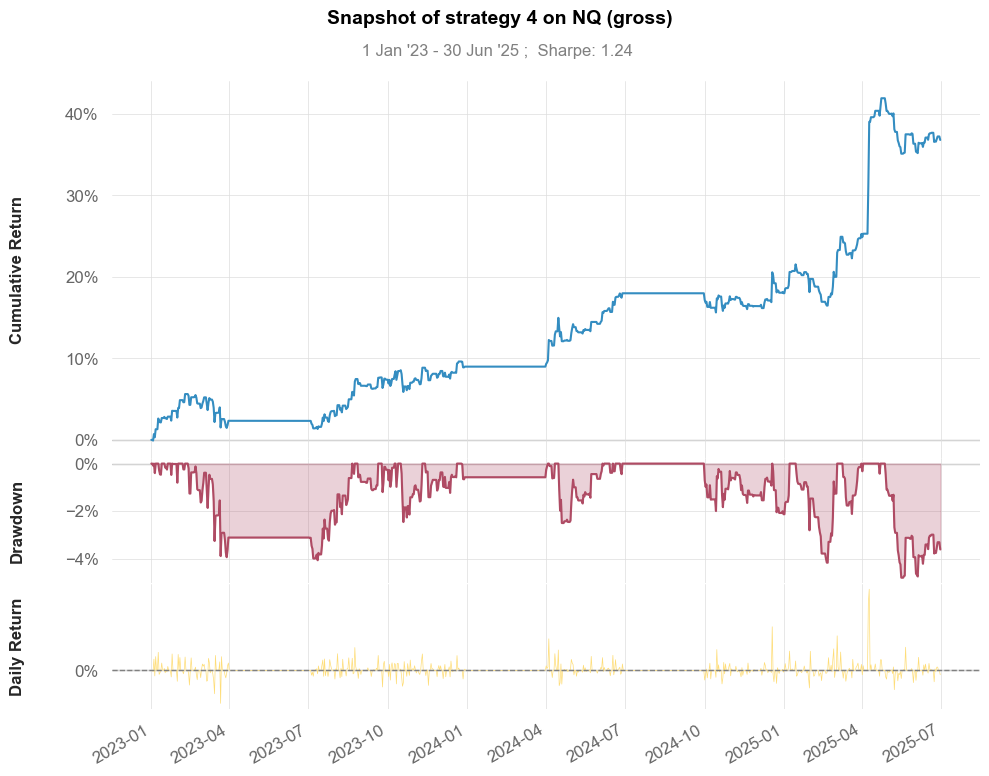

In [495]:
# Let's see the summary of strategy 1 in a MOMENTUM variant
# - equity curve, drawdown, and daily profits/losses

# !! IMPORTANT !!
# functions from qs library require a series of returns
# i.e., profit/loss in percentage terms w/o missing values

returns_strategy = data1_daily['pnl_gross4_mom_pct'].dropna()

qs.plots.snapshot(returns_strategy, 
                  title = "Snapshot of strategy 4 on NQ (gross)")

In [496]:
# function for SR from the quantstats package

sharpe = qs.stats.sharpe(returns_strategy)
# values will be slightly different from calculations on minute data

# alternative measures
calmar = qs.stats.calmar(returns_strategy)
sortino = qs.stats.sortino(returns_strategy)
omega = qs.stats.omega(returns_strategy)

print(f"Sharpe Ratio: {sharpe:.4f}")
print(f"Calmar Ratio: {calmar:.4f}")
print(f"Sortino Ratio: {sortino:.4f}")
print(f"Omega Ratio: {omega:.4f}") #i mean, pretty good eh?


Sharpe Ratio: 1.2425
Calmar Ratio: 1.8891
Sortino Ratio: 2.5048
Omega Ratio: 1.4874


In [ ]:
# Calculation of the maximum drawdown for the entire period.

qs.stats.max_drawdown(returns_strategy)

# -4.8%

-0.04793722090292629

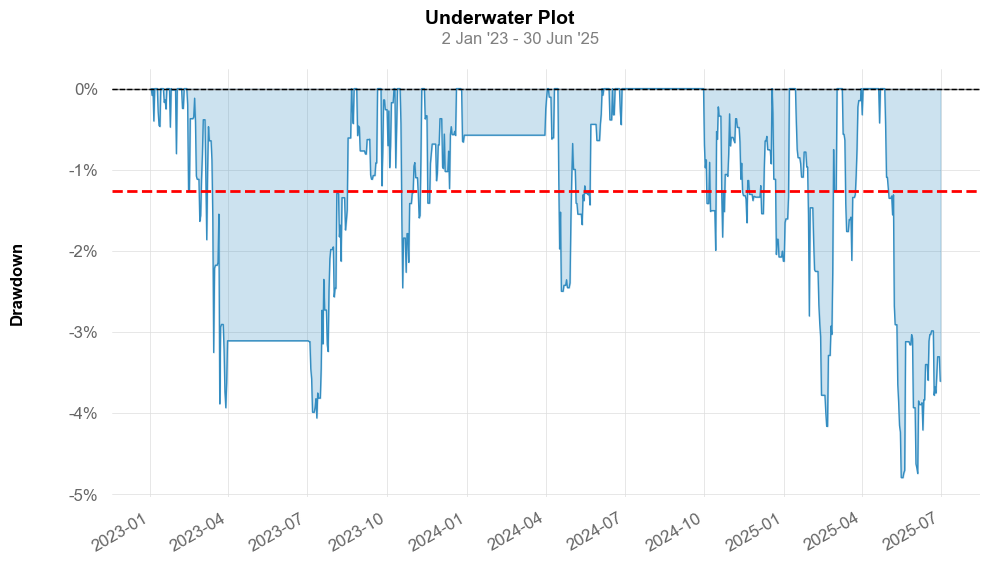

In [498]:
# Visualization of the drawdown ("underwater" plot)
qs.plots.drawdown(returns_strategy, figsize=(10, 6))

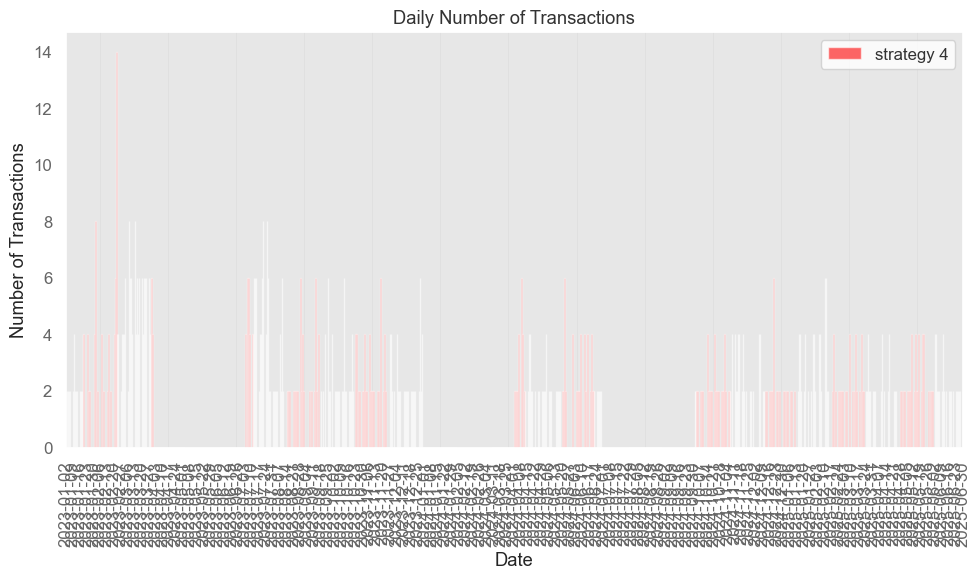

In [ ]:
#(NAPRAWIĆ)
# display the number of transactions for each strategy
# day by day in a bar chart

plt.figure(figsize = (10, 6))

data1_daily['ntrans4'].plot(kind = 'bar',
                                   color = 'red',
                                   alpha = 0.6,
                                   label = 'strategy 4')

# labels on X axis only for Mondays (weekday == 0)
plt.xticks(
    ticks = np.arange(len(data1_daily.index)),
    labels = [date.strftime('%Y-%m-%d') if date.weekday() == 0 else '' for date in data1_daily.index],
    rotation=90)

plt.title('Daily Number of Transactions')
plt.ylabel('Number of Transactions')
plt.xlabel('Date')
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show() # rather low values, good- 'evasion' from transactional costs

In [501]:
# Let's calculate the average daily number of transactions
# for each strategy (excluding weekends,
# because the stock market is closed then)

# Let's ignore weekends (Saturday = 5, Sunday = 6)
weekdays_only = data1_daily[data1_daily.index.dayofweek < 5]

avg_ntrans = weekdays_only[[col for col in weekdays_only.columns if col.startswith('ntrans')]].mean()
print("Average daily number of transactions for each strategy:")
print(avg_ntrans) #see the difference? Przydałyby sie wczesniej tez ploty dla porównania

Average daily number of transactions for each strategy:
ntrans1     55.509985
ntrans2b    12.245776
ntrans2a     7.410138
ntrans3b    12.298003
ntrans4      1.655914
dtype: float64


### OPTIMIZATION OF STRATEGY

#### NASDAQ FUTURES (NQ)

In [550]:
data1 = pd.read_pickle("data1_input.pkl")
data1.head(401)

,NQ,SP
datetime,,
2023-01-02 09:31:00+00:00,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN
...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN


In [551]:
data1.tail(11)

,NQ,SP
datetime,,
2025-06-30 15:50:00+00:00,22678.865,6205.469
2025-06-30 15:51:00+00:00,NaN,NaN
2025-06-30 15:52:00+00:00,NaN,NaN
2025-06-30 15:53:00+00:00,NaN,NaN
2025-06-30 15:54:00+00:00,NaN,NaN
2025-06-30 15:55:00+00:00,NaN,NaN
2025-06-30 15:56:00+00:00,NaN,NaN
2025-06-30 15:57:00+00:00,NaN,NaN
2025-06-30 15:58:00+00:00,NaN,NaN


In [552]:
# Let's split the data into training and test sets
# let's assume that data for the first two years (2023, 2024) is for training
# and data for 2025 is for testing

# train: all data up to end of 2024
data1_train = data1[data1.index < "2025-01-01"]

# test: all data from 2025 onwards
data1_test = data1[data1.index >= "2025-01-01"]

data1_train.tail()

,NQ,SP
datetime,,
2024-12-31 15:56:00+00:00,NaN,NaN
2024-12-31 15:57:00+00:00,NaN,NaN
2024-12-31 15:58:00+00:00,NaN,NaN
2024-12-31 15:59:00+00:00,NaN,NaN
2024-12-31 16:00:00+00:00,NaN,NaN


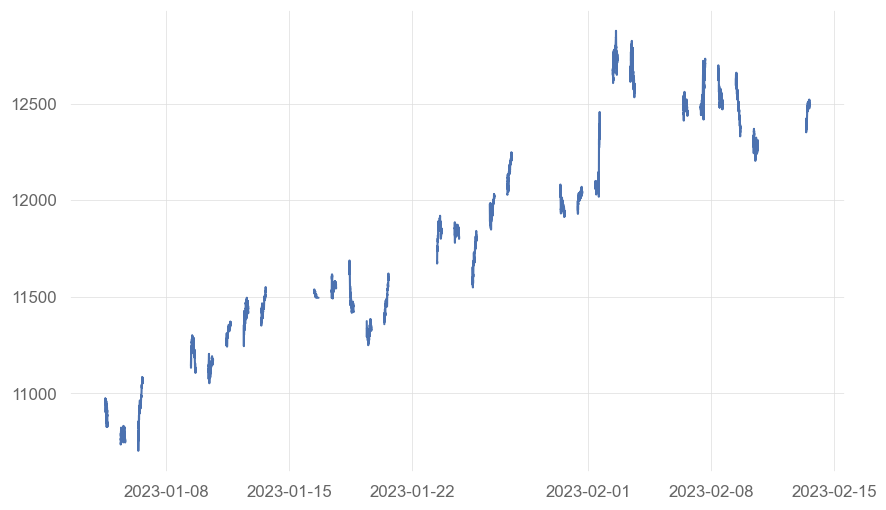

In [553]:
# Lets take NQ values

NQ = data1_train['NQ']

# check sample break in session

plt.figure(figsize = (10,6))
plt.plot(NQ[960:12000])

In [554]:
# Let's assume that we CLOSE ALL POSITIONS before the break (at 15:40).
# so finally, the position will always be 0 between 14:40 and 16:00.
# similarly as earlier, let's create an object named "pos_flat" 
# = 1 if position has to be flat (= 0) - we do not trade
# = 0 otherwise

# let's fill it first with zeros
pos_flat = np.zeros(len(NQ))

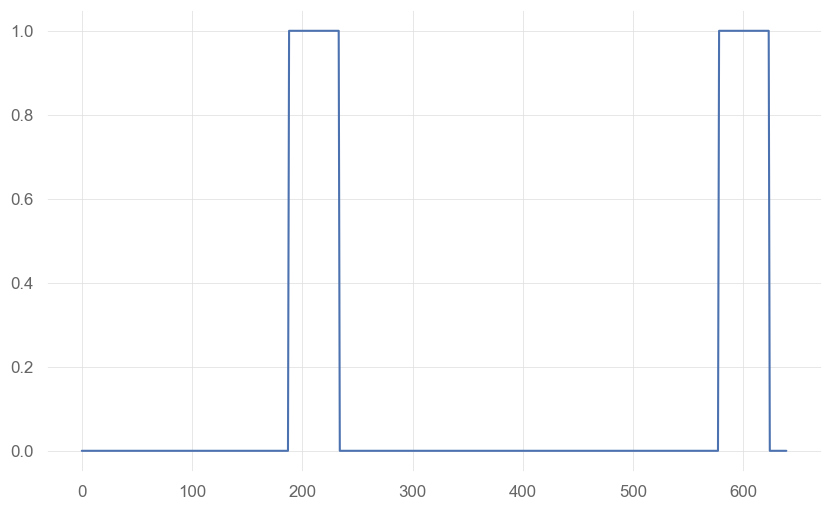

In [555]:
# put our assumptions into pos_flat
pos_flat = np.zeros(len(NQ))

t = NQ.index.time

breaks = (
    ((t >= pd.to_datetime("09:30").time()) & (t <= pd.to_datetime("09:55").time())) |
    ((t >= pd.to_datetime("15:40").time()) & (t <= pd.to_datetime("16:00").time()))
)

pos_flat[breaks] = 1


# let's see an example break in the session from the perspective of pos_flat

plt.figure(figsize = (10,6))
plt.plot(pos_flat[960:1600])

In [556]:
# lets check which weekdays we have data for

dweek_ = NQ.index.dayofweek + 1  # Adjust so that 0 = Monday, ..., 6 = Sunday
print(dweek_.value_counts())

# no Saturdays and Sundays in the data (perfect distribution?)

datetime
2    25612
5    25346
4    25299
3    24943
1    24701
Name: count, dtype: int64


In [557]:
# lets create a time_ object (vector of times)

time_ = NQ.index.time

# and let's fill the pos_flat vector with ones for weekends

pos_flat[((dweek_ == 5) & (time_ > pd.to_datetime('16:00').time())) |      # end of Friday
          (dweek_ == 6) |                                                  # whole Saturday (just in case)
          ((dweek_ == 7) & (time_ <= pd.to_datetime('9:55').time()))] = 1 # beginning of Sunday

Strategy 1: 2 intersecting moving averages

In [558]:
# we check various parameter combinations in a loop

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

fastEMA_parameters = [10, 15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [60, 75, 90, 120, 150, 180, 240, 300, 360, 420]

# create a dataframe to store results
summary_all_2MAs = pd.DataFrame()

# Loop over different parameter combinations
for fastEMA in fastEMA_parameters:
    for slowEMA in slowEMA_parameters:
                
                # ensure that fastEMA is less than slowEMA
                if fastEMA >= slowEMA:
                    continue

                print(f"fastEMA = {fastEMA}, slowEMA = {slowEMA}")

                # We calculate the appropriate EMA
                fastEMA_values = NQ.ewm(span = fastEMA).mean()
                slowEMA_values = NQ.ewm(span = slowEMA).mean()

                # Insert NaNs wherever the original price is missing
                fastEMA_values[NQ.isna()] = np.nan
                slowEMA_values[NQ.isna()] = np.nan 

                # Calculate position for momentum strategy
                cond2b_mom_long = fastEMA_values.shift(1) > slowEMA_values.shift(1)
                
                # let's add filters that check for the presence of NaN values
                fastEMA_nonmiss = fastEMA_values.shift(1).notna()
                slowEMA_nonmiss = slowEMA_values.shift(1).notna()

                # Now we can add these conditions to our strategies
                # if any of the values is missing,
                # we cannot make a position decision

                pos_mom = np.where(fastEMA_nonmiss & slowEMA_nonmiss,
                                   np.where(cond2b_mom_long, 1, -1),
                                   np.nan)
                pos_mr = -pos_mom 

                # Set position to 0 where pos_flat is 1
                pos_mom[pos_flat == 1] = 0
                pos_mr[pos_flat == 1] = 0
                
                # Calculate gross pnl
                pnl_gross_mom = np.where(np.isnan(pos_mom * NQ.diff()), 0, pos_mom * NQ.diff() * 20) 
                pnl_gross_mr = np.where(np.isnan(pos_mr * NQ.diff()), 0, pos_mr * NQ.diff() * 20) 
                # point value for NQ

                # Calculate number of transactions
                ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                # Calculate net pnl
                pnl_net_mom = pnl_gross_mom - ntrans * 12  # cost $12 per transaction on NQ
                pnl_net_mr = pnl_gross_mr - ntrans * 12  # cost $12 per transaction on NQ
                  
                # Aggregate to daily data
                pnl_gross_mom = pd.Series(pnl_gross_mom)
                pnl_gross_mom.index = NQ.index.time
                pnl_gross_mom_d = pnl_gross_mom.groupby(NQ.index.date).sum()
                pnl_gross_mr = pd.Series(pnl_gross_mr)
                pnl_gross_mr.index = NQ.index.time
                pnl_gross_mr_d = pnl_gross_mr.groupby(NQ.index.date).sum()

                pnl_net_mom = pd.Series(pnl_net_mom)
                pnl_net_mom.index = NQ.index.time
                pnl_net_mom_d = pnl_net_mom.groupby(NQ.index.date).sum()
                pnl_net_mr = pd.Series(pnl_net_mr)
                pnl_net_mr.index = NQ.index.time
                pnl_net_mr_d = pnl_net_mr.groupby(NQ.index.date).sum()

                ntrans = pd.Series(ntrans)
                ntrans.index = NQ.index.time
                ntrans_d = ntrans.groupby(NQ.index.date).sum()

                # Calculate Sharpe Ratio and PnL
                gross_SR_mom = mySR(pnl_gross_mom_d, scale=252)
                net_SR_mom = mySR(pnl_net_mom_d, scale=252)
                gross_PnL_mom = pnl_gross_mom_d.sum()
                net_PnL_mom = pnl_net_mom_d.sum()
                gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                gross_PnL_mr = pnl_gross_mr_d.sum()
                net_PnL_mr = pnl_net_mr_d.sum()

                av_daily_ntrans = ntrans_d.mean()

                # Collect necessary results into one object
                summary = pd.DataFrame({
                    'fastEMA': fastEMA,
                    'slowEMA': slowEMA,
                    'period': '2023-2024',
                    'gross_SR_mom': gross_SR_mom,
                    'net_SR_mom': net_SR_mom,
                    'gross_PnL_mom': gross_PnL_mom,
                    'net_PnL_mom': net_PnL_mom,
                    'gross_SR_mr': gross_SR_mr,
                    'net_SR_mr': net_SR_mr,
                    'gross_PnL_mr': gross_PnL_mr,
                    'net_PnL_mr': net_PnL_mr,
                    'av_daily_ntrans': av_daily_ntrans
                }, index=[0])

                # Append results to the summary
                summary_all_2MAs = pd.concat([summary_all_2MAs, summary], ignore_index=True)

fastEMA = 10, slowEMA = 60
fastEMA = 10, slowEMA = 75
fastEMA = 10, slowEMA = 90
fastEMA = 10, slowEMA = 120
fastEMA = 10, slowEMA = 150
fastEMA = 10, slowEMA = 180
fastEMA = 10, slowEMA = 240
fastEMA = 10, slowEMA = 300
fastEMA = 10, slowEMA = 360
fastEMA = 10, slowEMA = 420
fastEMA = 15, slowEMA = 60
fastEMA = 15, slowEMA = 75
fastEMA = 15, slowEMA = 90
fastEMA = 15, slowEMA = 120
fastEMA = 15, slowEMA = 150
fastEMA = 15, slowEMA = 180
fastEMA = 15, slowEMA = 240
fastEMA = 15, slowEMA = 300
fastEMA = 15, slowEMA = 360
fastEMA = 15, slowEMA = 420
fastEMA = 20, slowEMA = 60
fastEMA = 20, slowEMA = 75
fastEMA = 20, slowEMA = 90
fastEMA = 20, slowEMA = 120
fastEMA = 20, slowEMA = 150
fastEMA = 20, slowEMA = 180
fastEMA = 20, slowEMA = 240
fastEMA = 20, slowEMA = 300
fastEMA = 20, slowEMA = 360
fastEMA = 20, slowEMA = 420
fastEMA = 30, slowEMA = 60
fastEMA = 30, slowEMA = 75
fastEMA = 30, slowEMA = 90
fastEMA = 30, slowEMA = 120
fastEMA = 30, slowEMA = 150
fastEMA = 30, slowEMA = 180
fast

In [559]:
# lets see top 5 stategies with respect to net_SR_mom
summary_all_2MAs.sort_values(by = 'net_PnL_mom',
                            ascending = False).head(5) #High profits and net SR ratios on momentum strategies (up to +31K $!)

,fastEMA,slowEMA,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
68,90,150,2023-2024,0.969389,0.598878,51246.94,31912.14,-0.969389,-1.349064,-51246.94,-70768.14,4.996914
54,60,180,2023-2024,0.973567,0.583457,51252.50,30981.70,-0.973567,-1.373717,-51252.50,-71709.70,5.237654
72,90,360,2023-2024,0.713294,0.433216,37641.78,22986.98,-0.713294,-0.999812,-37641.78,-52482.98,3.793210
62,75,180,2023-2024,0.755421,0.383501,39633.38,20274.58,-0.755421,-1.136358,-39633.38,-59178.58,5.003086
61,75,150,2023-2024,0.743443,0.353208,38811.34,18588.54,-0.743443,-1.143370,-38811.34,-59220.54,5.225309


In [560]:
# lets see top 5 stategies with respect to net_SR_mr
summary_all_2MAs.sort_values(by = 'net_PnL_mr',
                            ascending = False).head(5)

,fastEMA,slowEMA,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
26,20,240,2023-2024,-0.418677,-0.907595,-22741.86,-50044.66,0.418677,-0.088701,22741.86,-4747.34,7.046296
7,10,300,2023-2024,-0.295834,-0.876991,-15626.86,-47249.66,0.295834,-0.312392,15626.86,-16182.34,8.157407
17,15,300,2023-2024,-0.179725,-0.670551,-9704.14,-36790.94,0.179725,-0.330572,9704.14,-17569.06,6.990741
16,15,240,2023-2024,-0.186599,-0.729378,-10057.10,-39975.90,0.186599,-0.378183,10057.10,-20048.10,7.719136
47,45,300,2023-2024,0.045299,-0.303665,2419.46,-16363.34,-0.045299,-0.403939,-2419.46,-21388.66,4.854938


In [516]:
# lets import a function written by the lecturer
# to visualize the strategy results in a form of a heatmap
from functions.plot_heatmap import plot_heatmap

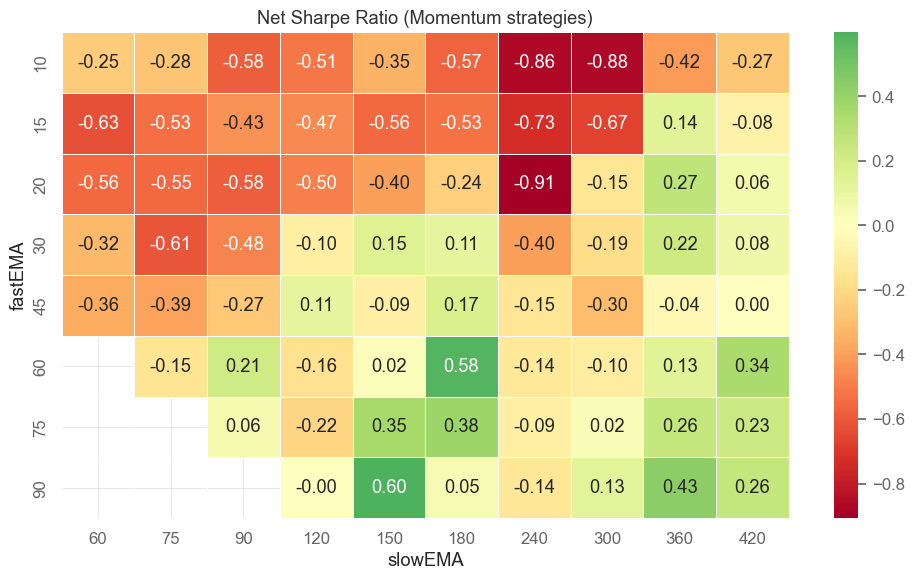

In [ ]:
# we wil use it to visualize net SR values
# for the momentum strategy (MOM)

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_SR_mom',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    title = 'Net Sharpe Ratio (Momentum strategies)'
)

#Several combinations with positive net SR (90:150 the best)

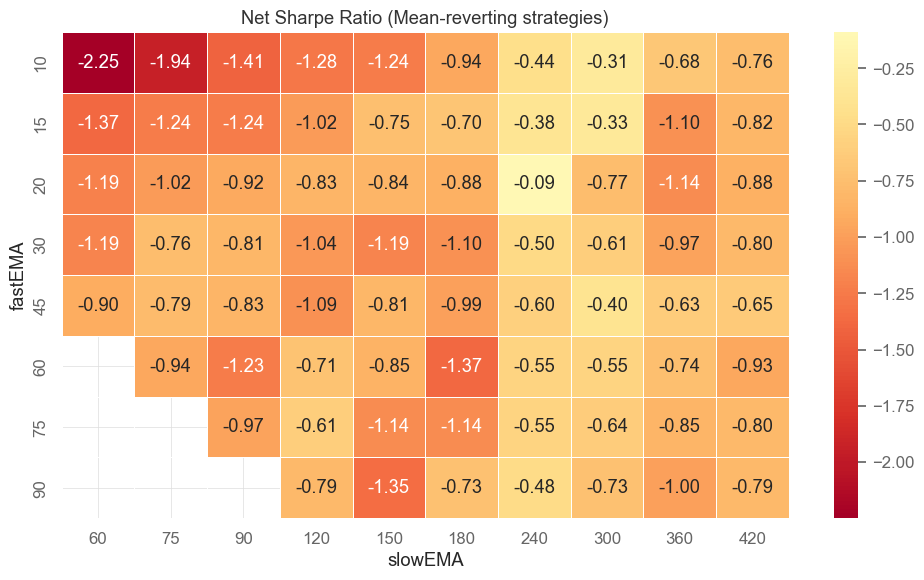

In [518]:
# we wil use it to visualize net SR values
# for the mean-reverting strategy (MOM)

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_SR_mr',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    title = 'Net Sharpe Ratio (Mean-reverting strategies)'
)

# No positive SR


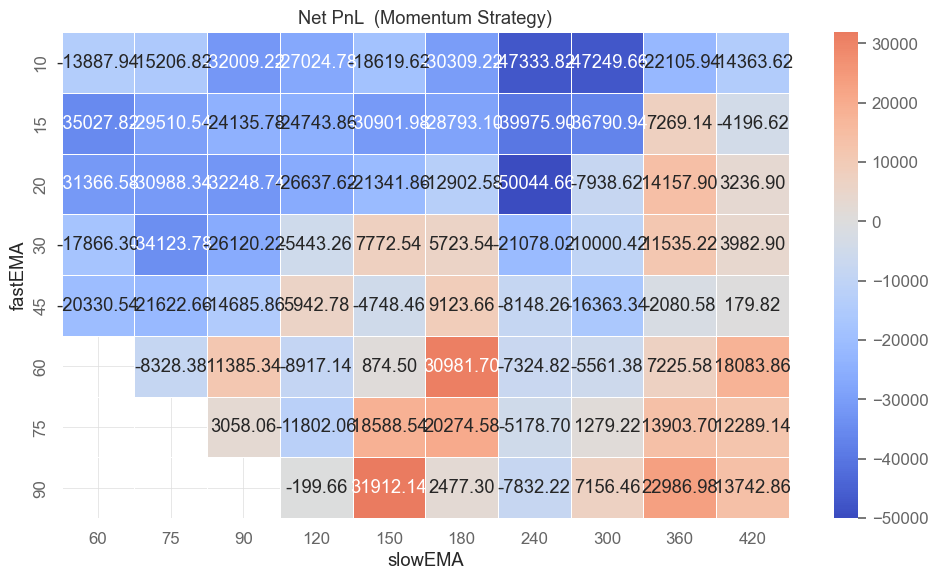

In [ ]:
# How about net PnL for Momentum strategy?

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_PnL_mom',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    cmap = "coolwarm",
    title = 'Net PnL  (Momentum Strategy)'
) #Strategy with highest net SR leads to higher profit, results seems pretty reasonable

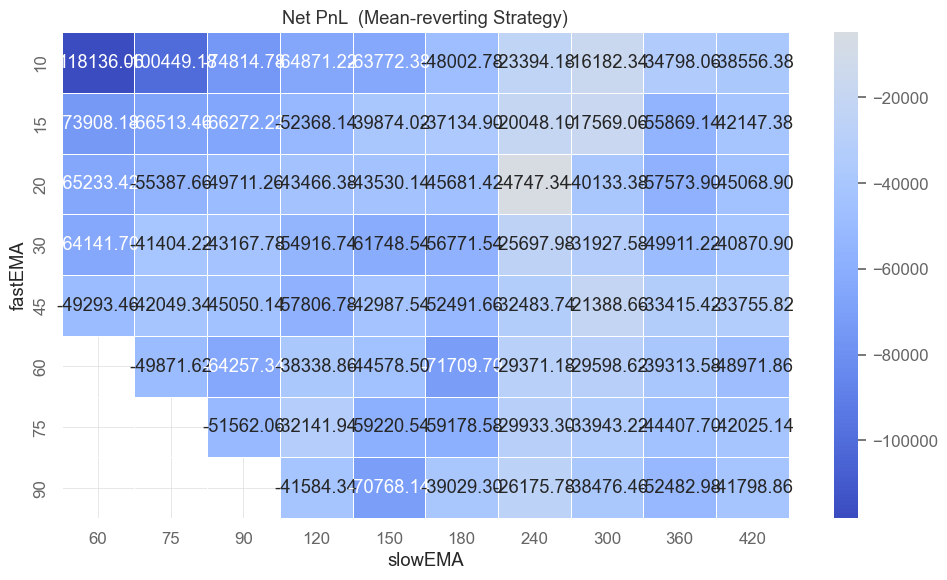

In [ ]:
# How about net PnL for Mean-reverting strategy?

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_PnL_mr',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    cmap = "coolwarm",
    title = 'Net PnL  (Mean-reverting Strategy)'
) 

Strategy 2: Volatility breakout

In [562]:
#Update of sharpe ratio so it won't divide by 0
def mySR(x, scale=252):
    mu = np.nanmean(x)
    sigma = np.nanstd(x)

    if sigma == 0 or np.isnan(sigma):
        return np.nan

    return np.sqrt(scale) * mu / sigma

# let's use fastEMA as the strategy signal
# and use slowEMA+/-m*std as volatility boundaries

from functions.position_VB import positionVB

# we check various parameter combinations in a loop

signalEMA_parameters = [10, 15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [60, 90, 120, 150, 180, 200, 240, 300]
volat_sd_parameters = [60, 90, 120]
m_parameters = [1, 2, 3]

# create a dataframe to store results
summary_all_breakout = pd.DataFrame()

# loop over different parameter combinations
for signalEMA in signalEMA_parameters:
    print(f"signalEMA = {signalEMA}")
    for slowEMA in slowEMA_parameters:
        for volat_sd in volat_sd_parameters:
            for m in m_parameters:
               
                # We calculate the appropriate EMA
                signalEMA_values = NQ.ewm(span = signalEMA).mean().to_numpy()
                slowEMA_values = NQ.ewm(span = slowEMA).mean().to_numpy()
                                
                # We calculate the standard deviation
                volat_sd_values = NQ.rolling(window = volat_sd).std().to_numpy()

                # Insert NaNs wherever the original price is missing
                signalEMA_values[NQ.isna()] = np.nan
                slowEMA_values[NQ.isna()] = np.nan 
                volat_sd_values[NQ.isna()] = np.nan 

                # Calculate position for momentum strategy
                pos_mom = positionVB(signal = signalEMA_values, 
                                     lower = slowEMA_values - m * volat_sd_values,
                                     upper = slowEMA_values + m * volat_sd_values,
                                     pos_flat = pos_flat,
                                     strategy = "mom")
                
                pos_mr = -pos_mom 

                # Calculate gross pnl
                pnl_gross_mom = np.where(np.isnan(pos_mom * NQ.diff()), 0, pos_mom * NQ.diff() * 20) 
                pnl_gross_mr = np.where(np.isnan(pos_mr * NQ.diff()), 0, pos_mr * NQ.diff() * 20) 
                # point value for NQ = 20$

                # Calculate number of transactions
                ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                # Calculate net pnl
                pnl_net_mom = pnl_gross_mom - ntrans * 12  # cost $12 per transaction on NQ
                pnl_net_mr = pnl_gross_mr - ntrans * 12  # cost $12 per transaction on NQ
                  
                # Aggregate to daily data
                pnl_gross_mom = pd.Series(pnl_gross_mom)
                pnl_gross_mom.index = NQ.index.time
                pnl_gross_mom_d = pnl_gross_mom.groupby(NQ.index.date).sum()
                pnl_gross_mr = pd.Series(pnl_gross_mr)
                pnl_gross_mr.index = NQ.index.time
                pnl_gross_mr_d = pnl_gross_mr.groupby(NQ.index.date).sum()

                pnl_net_mom = pd.Series(pnl_net_mom)
                pnl_net_mom.index = NQ.index.time
                pnl_net_mom_d = pnl_net_mom.groupby(NQ.index.date).sum()
                pnl_net_mr = pd.Series(pnl_net_mr)
                pnl_net_mr.index = NQ.index.time
                pnl_net_mr_d = pnl_net_mr.groupby(NQ.index.date).sum()

                ntrans = pd.Series(ntrans)
                ntrans.index = NQ.index.time
                ntrans_d = ntrans.groupby(NQ.index.date).sum()

                # Calculate Sharpe Ratio and PnL
                gross_SR_mom = mySR(pnl_gross_mom_d, scale=252)
                net_SR_mom = mySR(pnl_net_mom_d, scale=252)
                gross_PnL_mom = pnl_gross_mom_d.sum()
                net_PnL_mom = pnl_net_mom_d.sum()
                gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                gross_PnL_mr = pnl_gross_mr_d.sum()
                net_PnL_mr = pnl_net_mr_d.sum()

                av_daily_ntrans = ntrans_d.mean()

                # Collect the necessary results into one object
                summary = pd.DataFrame({
                    'signalEMA': signalEMA,
                    'slowEMA': slowEMA,
                    'volat_sd': volat_sd,
                    'm': m,
                    'period': '2023-2024',
                    'gross_SR_mom': gross_SR_mom,
                    'net_SR_mom': net_SR_mom,
                    'gross_PnL_mom': gross_PnL_mom,
                    'net_PnL_mom': net_PnL_mom,
                    'gross_SR_mr': gross_SR_mr,
                    'net_SR_mr': net_SR_mr,
                    'gross_PnL_mr': gross_PnL_mr,
                    'net_PnL_mr': net_PnL_mr,
                    'av_daily_ntrans': av_daily_ntrans
                }, index=[0])

                # Append the results to the summary
                summary_all_breakout = pd.concat([summary_all_breakout, summary], ignore_index=True)

    # it takes a while
    # approximately 11 (!) minutes

signalEMA = 10
signalEMA = 15
signalEMA = 20
signalEMA = 30
signalEMA = 45
signalEMA = 60
signalEMA = 75
signalEMA = 90


In [563]:
# check 10 strategies with the best net_SR_mom (momentum strategies)

summary_all_breakout.sort_values(by = 'net_PnL_mom', 
                                 ascending = False).head(10) # 31K profit, slightly lower than for 2xEMA

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
25,10,120,120,2,2023-2024,2.012353,1.828681,55044.08,50028.08,-2.012353,-2.195836,-55044.08,-60060.08,1.290123
147,20,60,90,1,2023-2024,1.828984,1.663058,50822.34,46238.34,-1.828984,-1.994874,-50822.34,-55406.34,1.179012
52,10,200,120,2,2023-2024,1.519710,1.296177,51175.16,43711.16,-1.519710,-1.743799,-51175.16,-58639.16,1.919753
207,20,300,60,1,2023-2024,1.281095,0.982590,54990.40,42414.40,-1.281095,-1.582908,-54990.40,-67566.40,3.234568
81,15,90,60,1,2023-2024,1.415303,1.028515,57902.00,42350.00,-1.415303,-1.807014,-57902.00,-73454.00,4.000000
34,10,150,120,2,2023-2024,1.704335,1.476219,48545.26,42089.26,-1.704335,-1.932716,-48545.26,-55001.26,1.660494
22,10,120,90,2,2023-2024,1.480509,1.259104,47779.08,40699.08,-1.480509,-1.702501,-47779.08,-54859.08,1.820988
231,30,90,120,1,2023-2024,1.959921,1.793708,43833.90,40089.90,-1.959921,-2.125605,-43833.90,-47577.90,0.962963
282,30,300,90,1,2023-2024,1.255161,0.989408,50363.28,39851.28,-1.255161,-1.522907,-50363.28,-60875.28,2.703704
153,20,90,60,1,2023-2024,1.297734,0.964195,53316.28,39828.28,-1.297734,-1.634828,-53316.28,-66804.28,3.469136


In [564]:
# check 10 strategies with the best net_SR_mr

summary_all_breakout.sort_values(by = 'net_PnL_mr', 
                                 ascending = False).head(10) #Here also not bat, 19K net profit

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
504,90,60,60,1,2023-2024,-1.268553,-1.461137,-31632.00,-36432.00,1.268553,1.075822,31632.00,26832.00,1.234568
318,45,150,90,1,2023-2024,-0.563220,-0.808853,-20717.94,-29861.94,0.563220,0.315779,20717.94,11573.94,2.351852
434,75,60,60,3,2023-2024,-0.897195,-1.037670,-12633.88,-14625.88,0.897195,0.756154,12633.88,10641.88,0.512346
433,75,60,60,2,2023-2024,-0.866767,-1.010897,-12213.66,-14253.66,0.866767,0.722160,12213.66,10173.66,0.524691
438,75,60,120,1,2023-2024,-1.183850,-1.269630,-10335.00,-11127.00,1.183850,1.097103,10335.00,9543.00,0.203704
511,90,60,120,2,2023-2024,-1.183850,-1.269630,-10335.00,-11127.00,1.183850,1.097103,10335.00,9543.00,0.203704
510,90,60,120,1,2023-2024,-1.183850,-1.272380,-10335.00,-11151.00,1.183850,1.094326,10335.00,9519.00,0.209877
512,90,60,120,3,2023-2024,-1.170149,-1.256185,-10197.56,-10989.56,1.170149,1.083152,10197.56,9405.56,0.203704
437,75,60,90,3,2023-2024,-1.175061,-1.268719,-10246.36,-11110.36,1.175061,1.080263,10246.36,9382.36,0.222222
435,75,60,90,1,2023-2024,-1.175061,-1.268719,-10246.36,-11110.36,1.175061,1.080263,10246.36,9382.36,0.222222


In [565]:
# summarize the results for the mom strategy
# in the form of a heatmap

# here we have four parameters
# signalEMA, slowEMA, volat_sd and m,
# so to present the results in the form of a heatmap,
# we need to combine them in pairs

summary_all_breakout["signalEMA_slowEMA"] = (
    summary_all_breakout["signalEMA"].astype(int).astype(str).str.zfill(3) + "_" +
    summary_all_breakout["slowEMA"].astype(int).astype(str).str.zfill(3)
)

summary_all_breakout["volat_sd_m"] = (
    summary_all_breakout["volat_sd"].astype(int).astype(str).str.zfill(3) + "_" +
    summary_all_breakout["m"].astype(str)
)

summary_all_breakout.head()

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans,signalEMA_slowEMA,volat_sd_m
0,10,60,60,1,2023-2024,0.562714,0.120463,24786.96,5346.96,-0.562714,-1.011718,-24786.96,-44226.96,5.000000,010_060,060_1
1,10,60,60,2,2023-2024,2.031493,1.875766,33892.16,31228.16,-2.031493,-2.185898,-33892.16,-36556.16,0.685185,010_060,060_2
2,10,60,60,3,2023-2024,1.827548,1.702850,27399.88,25455.88,-1.827548,-1.950893,-27399.88,-29343.88,0.500000,010_060,060_3
3,10,60,90,1,2023-2024,0.278661,-0.103205,11168.12,-4167.88,-0.278661,-0.666362,-11168.12,-26504.12,3.944444,010_060,090_1
4,10,60,90,2,2023-2024,1.527079,1.449598,26993.78,25577.78,-1.527079,-1.604066,-26993.78,-28409.78,0.364198,010_060,090_2


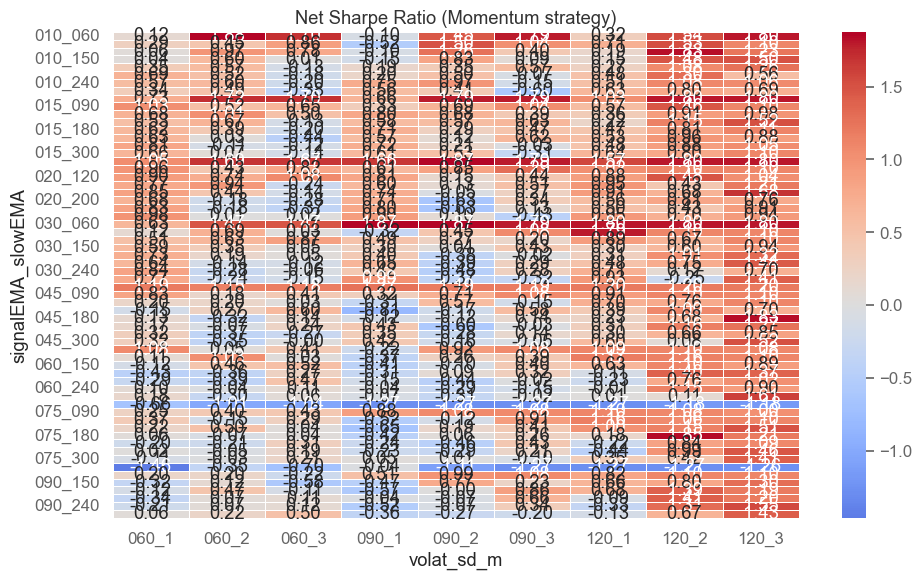

In [526]:
# now we can plot the heatmap
plot_heatmap(
    summary_all_breakout,
    value_col = 'net_SR_mom',
    index_col = 'signalEMA_slowEMA',
    columns_col = 'volat_sd_m',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

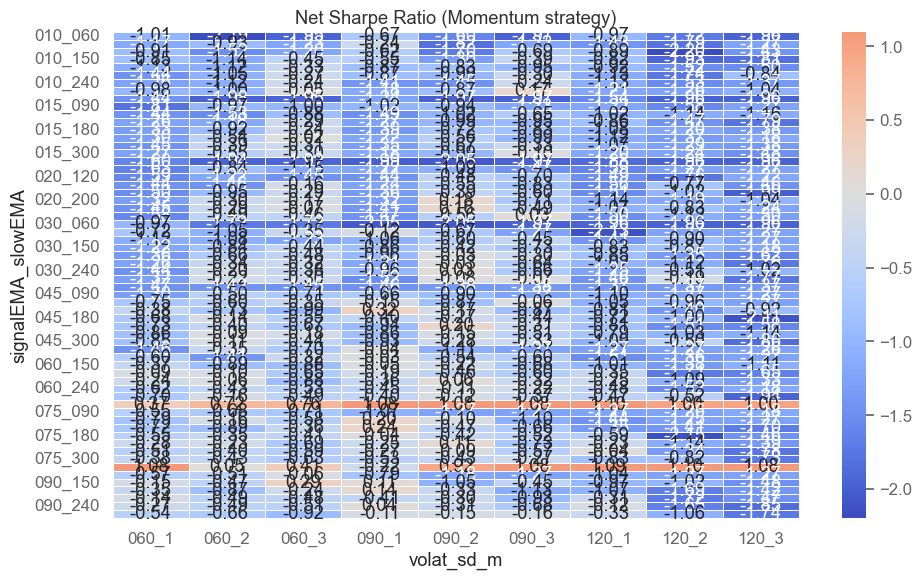

In [527]:
# for mean-reverting
plot_heatmap(
    summary_all_breakout,
    value_col = 'net_SR_mr',
    index_col = 'signalEMA_slowEMA',
    columns_col = 'volat_sd_m',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

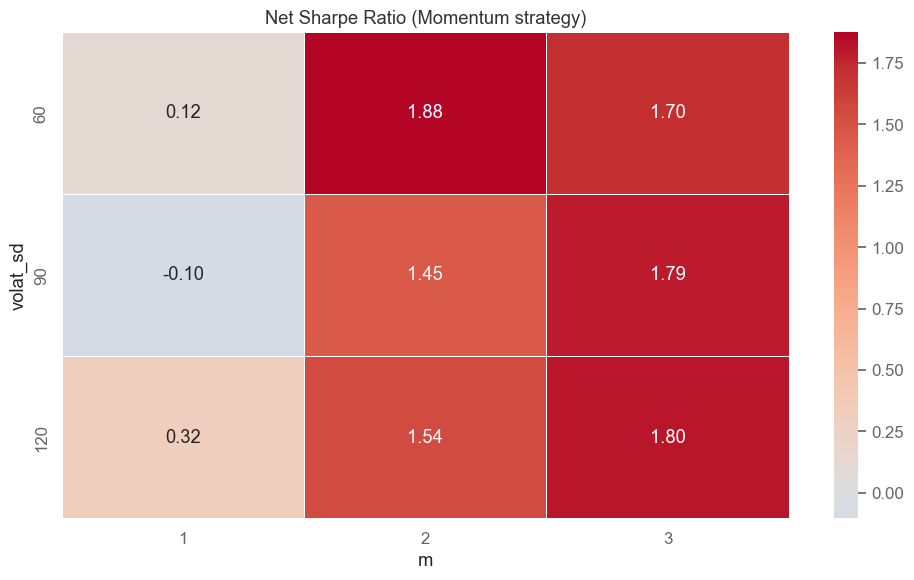

In [ ]:
# Momentum: the highest net SR are for signalEMA = 10 and slowEMA = 60

# let's check the sensitivity analysis of SR to m and volat_sd

# we select only rows with values of signalEMA and slowEMA
summary_all_breakout_wybrane = summary_all_breakout[
    (summary_all_breakout['signalEMA'] == 10) & (summary_all_breakout['slowEMA'] == 60)
]

# and we create a heatmap for them
plot_heatmap(
    summary_all_breakout_wybrane,
    value_col = 'net_SR_mom',
    index_col = 'volat_sd',
    columns_col = 'm',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

# Rather not an anomally

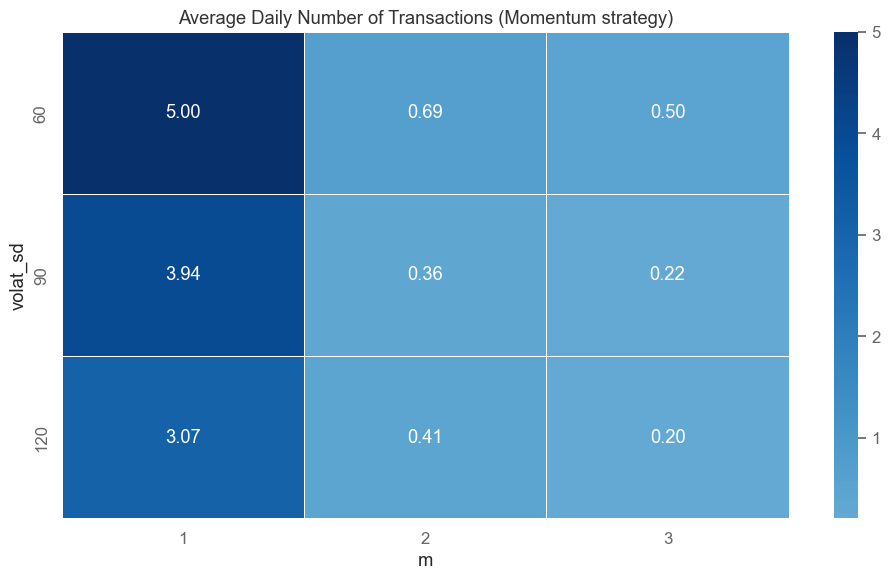

In [529]:
# heatmap plot can also be used to analyze transaction frequency

plot_heatmap(
    summary_all_breakout_wybrane,
    value_col = 'av_daily_ntrans',
    index_col = 'volat_sd',
    columns_col = 'm',
    title = 'Average Daily Number of Transactions (Momentum strategy)',
    cmap = "Blues")

    # in line with expectations
    # the larger the m, the fewer the transactions

Testing of developped strategies

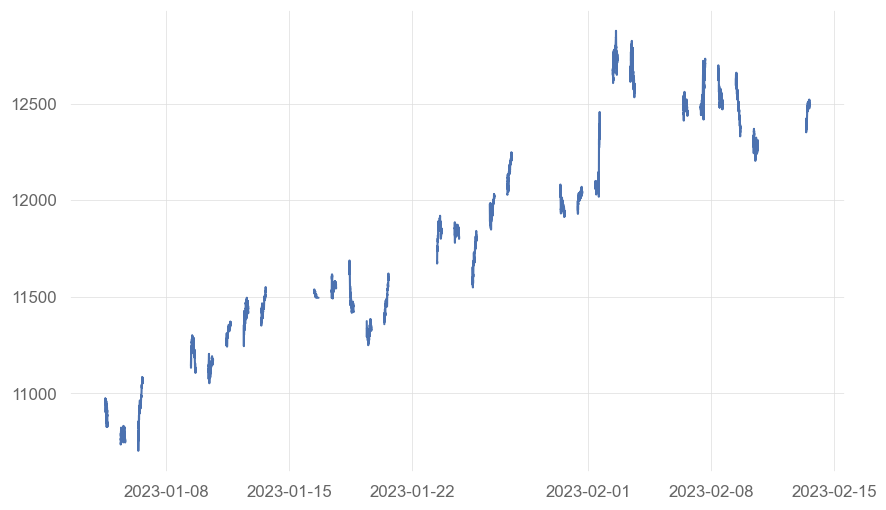

In [566]:
# Lets take NQ values

NQ_test = data1_test['NQ']

# check sample break in session

plt.figure(figsize = (10,6))
plt.plot(NQ[960:12000])

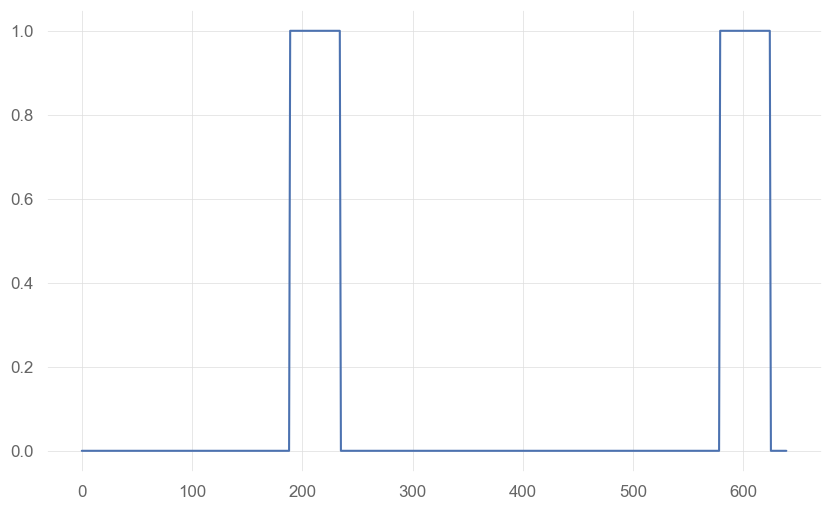

In [567]:
# put our assumptions into pos_flat
pos_flat = np.zeros(len(NQ_test))

t = NQ_test.index.time

breaks = (
    ((t >= pd.to_datetime("09:30").time()) & (t <= pd.to_datetime("09:55").time())) |
    ((t >= pd.to_datetime("15:40").time()) & (t <= pd.to_datetime("16:00").time()))
)

pos_flat[breaks] = 1


# let's see an example break in the session from the perspective of pos_flat

plt.figure(figsize = (10,6))
plt.plot(pos_flat[960:1600])

In [568]:
# lets check which weekdays we have data for

dweek_ = NQ_test.index.dayofweek + 1  # Adjust so that 0 = Monday, ..., 6 = Sunday
print(dweek_.value_counts())

# no Saturdays and Sundays in the data

datetime
4    10140
5    10138
1    10137
2     9750
3     9746
Name: count, dtype: int64


In [569]:
# lets create a time_ object (vector of times)

time_ = NQ_test.index.time

# and let's fill the pos_flat vector with ones for weekends

pos_flat[((dweek_ == 5) & (time_ > pd.to_datetime('16:00').time())) |      # end of Friday
          (dweek_ == 6) |                                                  # whole Saturday (just in case)
          ((dweek_ == 7) & (time_ <= pd.to_datetime('9:55').time()))] = 1 # beginning of Sunday

Strategy 1: 2 intersecting moving averages

In [570]:
# we check various parameter combinations in a loop

fastEMA_parameters = [10, 15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [60, 75, 90, 120, 150, 180, 240, 300, 360, 420]

# create a dataframe to store results
summary_all_2MAs = pd.DataFrame()

# Loop over different parameter combinations
for fastEMA in fastEMA_parameters:
    for slowEMA in slowEMA_parameters:
                
                # ensure that fastEMA is less than slowEMA
                if fastEMA >= slowEMA:
                    continue

                print(f"fastEMA = {fastEMA}, slowEMA = {slowEMA}")

                # We calculate the appropriate EMA
                fastEMA_values = NQ_test.ewm(span = fastEMA).mean()
                slowEMA_values = NQ_test.ewm(span = slowEMA).mean()

                # Insert NaNs wherever the original price is missing
                fastEMA_values[NQ_test.isna()] = np.nan
                slowEMA_values[NQ_test.isna()] = np.nan 

                # Calculate position for momentum strategy
                cond2b_mom_long = fastEMA_values.shift(1) > slowEMA_values.shift(1)
                
                # let's add filters that check for the presence of NaN values
                fastEMA_nonmiss = fastEMA_values.shift(1).notna()
                slowEMA_nonmiss = slowEMA_values.shift(1).notna()

                # Now we can add these conditions to our strategies
                # if any of the values is missing,
                # we cannot make a position decision

                pos_mom = np.where(fastEMA_nonmiss & slowEMA_nonmiss,
                                   np.where(cond2b_mom_long, 1, -1),
                                   np.nan)
                pos_mr = -pos_mom 

                # Set position to 0 where pos_flat is 1
                pos_mom[pos_flat == 1] = 0
                pos_mr[pos_flat == 1] = 0
                
                # Calculate gross pnl
                pnl_gross_mom = np.where(np.isnan(pos_mom * NQ_test.diff()), 0, pos_mom * NQ_test.diff() * 20) 
                pnl_gross_mr = np.where(np.isnan(pos_mr * NQ_test.diff()), 0, pos_mr * NQ_test.diff() * 20) 
                # point value for NQ

                # Calculate number of transactions
                ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                # Calculate net pnl
                pnl_net_mom = pnl_gross_mom - ntrans * 12  # cost $12 per transaction on NQ
                pnl_net_mr = pnl_gross_mr - ntrans * 12  # cost $12 per transaction on NQ
                  
                # Aggregate to daily data
                pnl_gross_mom = pd.Series(pnl_gross_mom)
                pnl_gross_mom.index = NQ_test.index.time
                pnl_gross_mom_d = pnl_gross_mom.groupby(NQ_test.index.date).sum()
                pnl_gross_mr = pd.Series(pnl_gross_mr)
                pnl_gross_mr.index = NQ_test.index.time
                pnl_gross_mr_d = pnl_gross_mr.groupby(NQ_test.index.date).sum()

                pnl_net_mom = pd.Series(pnl_net_mom)
                pnl_net_mom.index = NQ_test.index.time
                pnl_net_mom_d = pnl_net_mom.groupby(NQ_test.index.date).sum()
                pnl_net_mr = pd.Series(pnl_net_mr)
                pnl_net_mr.index = NQ_test.index.time
                pnl_net_mr_d = pnl_net_mr.groupby(NQ_test.index.date).sum()

                ntrans = pd.Series(ntrans)
                ntrans.index = NQ_test.index.time
                ntrans_d = ntrans.groupby(NQ_test.index.date).sum()

                # Calculate Sharpe Ratio and PnL
                gross_SR_mom = mySR(pnl_gross_mom_d, scale=252)
                net_SR_mom = mySR(pnl_net_mom_d, scale=252)
                gross_PnL_mom = pnl_gross_mom_d.sum()
                net_PnL_mom = pnl_net_mom_d.sum()
                gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                gross_PnL_mr = pnl_gross_mr_d.sum()
                net_PnL_mr = pnl_net_mr_d.sum()

                av_daily_ntrans = ntrans_d.mean()

                # Collect necessary results into one object
                summary = pd.DataFrame({
                    'fastEMA': fastEMA,
                    'slowEMA': slowEMA,
                    'period': '2025',
                    'gross_SR_mom': gross_SR_mom,
                    'net_SR_mom': net_SR_mom,
                    'gross_PnL_mom': gross_PnL_mom,
                    'net_PnL_mom': net_PnL_mom,
                    'gross_SR_mr': gross_SR_mr,
                    'net_SR_mr': net_SR_mr,
                    'gross_PnL_mr': gross_PnL_mr,
                    'net_PnL_mr': net_PnL_mr,
                    'av_daily_ntrans': av_daily_ntrans
                }, index=[0])

                # Append results to the summary
                summary_all_2MAs = pd.concat([summary_all_2MAs, summary], ignore_index=True)

fastEMA = 10, slowEMA = 60
fastEMA = 10, slowEMA = 75
fastEMA = 10, slowEMA = 90
fastEMA = 10, slowEMA = 120
fastEMA = 10, slowEMA = 150
fastEMA = 10, slowEMA = 180
fastEMA = 10, slowEMA = 240
fastEMA = 10, slowEMA = 300
fastEMA = 10, slowEMA = 360
fastEMA = 10, slowEMA = 420
fastEMA = 15, slowEMA = 60
fastEMA = 15, slowEMA = 75
fastEMA = 15, slowEMA = 90
fastEMA = 15, slowEMA = 120
fastEMA = 15, slowEMA = 150
fastEMA = 15, slowEMA = 180
fastEMA = 15, slowEMA = 240
fastEMA = 15, slowEMA = 300
fastEMA = 15, slowEMA = 360
fastEMA = 15, slowEMA = 420
fastEMA = 20, slowEMA = 60
fastEMA = 20, slowEMA = 75
fastEMA = 20, slowEMA = 90
fastEMA = 20, slowEMA = 120
fastEMA = 20, slowEMA = 150
fastEMA = 20, slowEMA = 180
fastEMA = 20, slowEMA = 240
fastEMA = 20, slowEMA = 300
fastEMA = 20, slowEMA = 360
fastEMA = 20, slowEMA = 420
fastEMA = 30, slowEMA = 60
fastEMA = 30, slowEMA = 75
fastEMA = 30, slowEMA = 90
fastEMA = 30, slowEMA = 120
fastEMA = 30, slowEMA = 150
fastEMA = 30, slowEMA = 180
fast

In [571]:
# lets see top 5 stategies with respect to net_SR_mom
summary_all_2MAs.sort_values(by = 'net_PnL_mom',
                            ascending = False).head(5) #net profit with negative value

,fastEMA,slowEMA,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
28,20,360,2025,0.016178,-0.201797,592.38,-7423.62,-0.016178,-0.236183,-592.38,-8608.38,5.218750
63,75,240,2025,-0.131786,-0.310778,-4676.46,-11060.46,0.131786,-0.048260,4676.46,-1707.54,4.156250
70,90,240,2025,-0.283987,-0.445479,-10601.18,-16673.18,0.283987,0.121645,10601.18,4529.18,3.953125
29,20,420,2025,-0.245351,-0.456595,-9106.06,-17026.06,0.245351,0.032106,9106.06,1186.06,5.156250
19,15,420,2025,-0.238625,-0.473459,-8639.82,-17231.82,0.238625,0.001328,8639.82,47.82,5.593750


In [572]:
# lets see top 5 stategies with respect to net_SR_mr
summary_all_2MAs.sort_values(by = 'net_PnL_mr',
                            ascending = False).head(5) #actual jump of profit up to 71K ???

,fastEMA,slowEMA,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
42,45,90,2025,-1.549633,-1.745886,-95021.82,-107357.82,1.549633,1.352232,95021.82,82685.82,8.031250
41,45,75,2025,-1.508936,-1.727171,-91364.30,-104876.30,1.508936,1.289413,91364.30,77852.30,8.796875
52,60,120,2025,-1.912106,-2.137196,-81297.02,-91329.02,1.912106,1.684617,81297.02,71265.02,6.531250
50,60,75,2025,-1.604024,-1.830099,-82677.30,-94653.30,1.604024,1.376345,82677.30,70701.30,7.796875
26,20,240,2025,-1.397355,-1.587895,-79302.14,-90462.14,1.397355,1.205287,79302.14,68142.14,7.265625


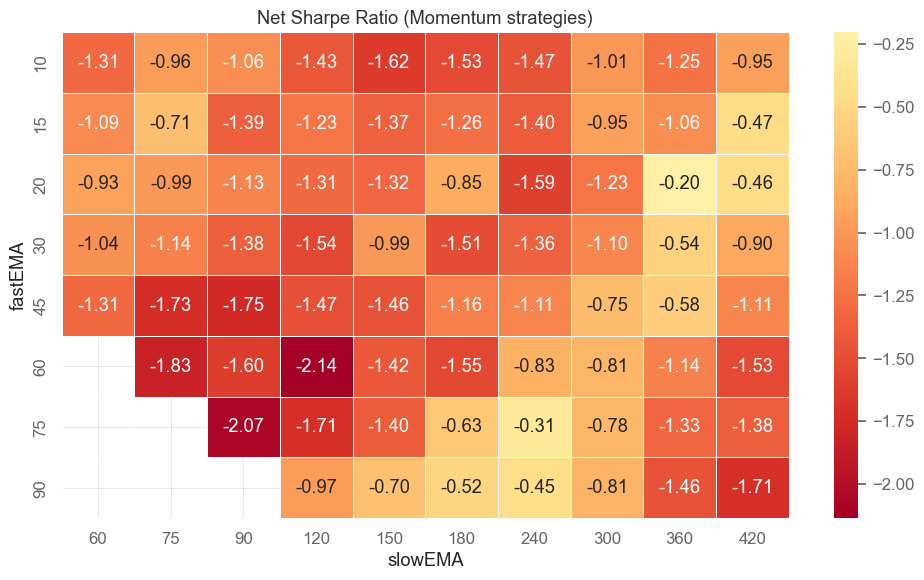

In [538]:
# we wil use it to visualize net SR values
# for the momentum strategy (MOM)

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_SR_mom',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    title = 'Net Sharpe Ratio (Momentum strategies)'
)

#Some different results

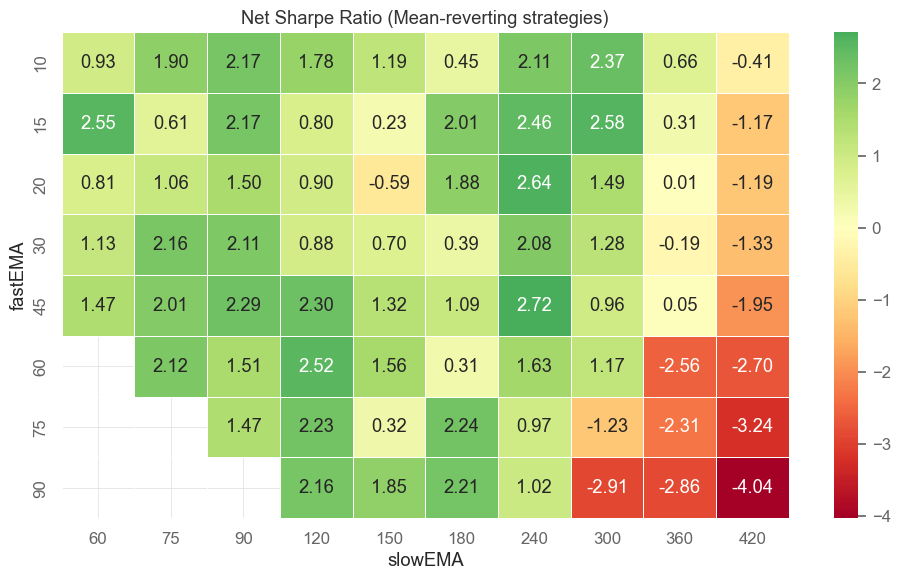

In [ ]:
# we wil use it to visualize net SR values
# for the mean-reverting strategy (MR)

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_SR_mr',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    title = 'Net Sharpe Ratio (Mean-reverting strategies)'
)

#Mean-reverting on testing is better? inconsistent results with training though

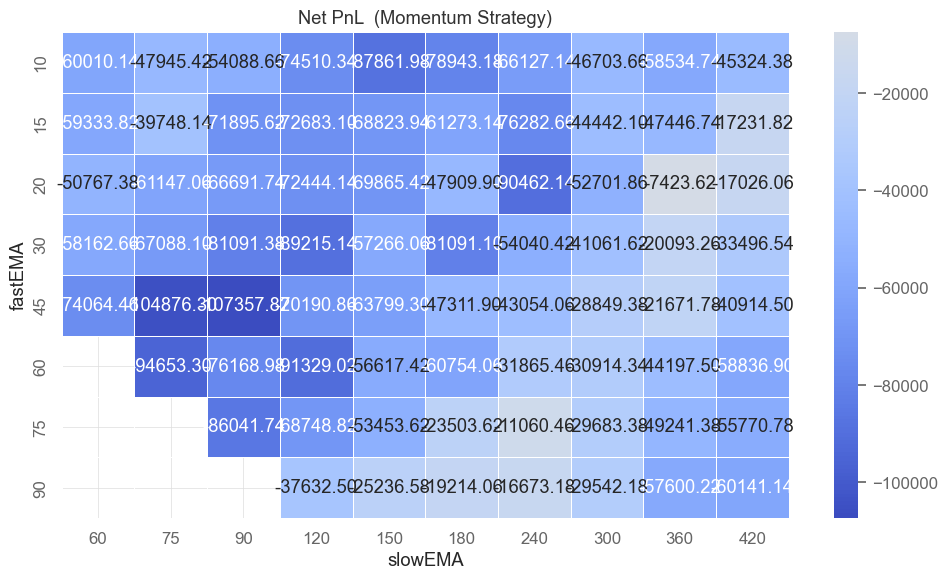

In [539]:
# How about net PnL for MOM strategy?

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_PnL_mom',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    cmap = "coolwarm",
    title = 'Net PnL  (Momentum Strategy)'
) #Different results, bottom-right corner pretty consistent (slowEMA=420 ^ fastEMA=60 as safe pick)

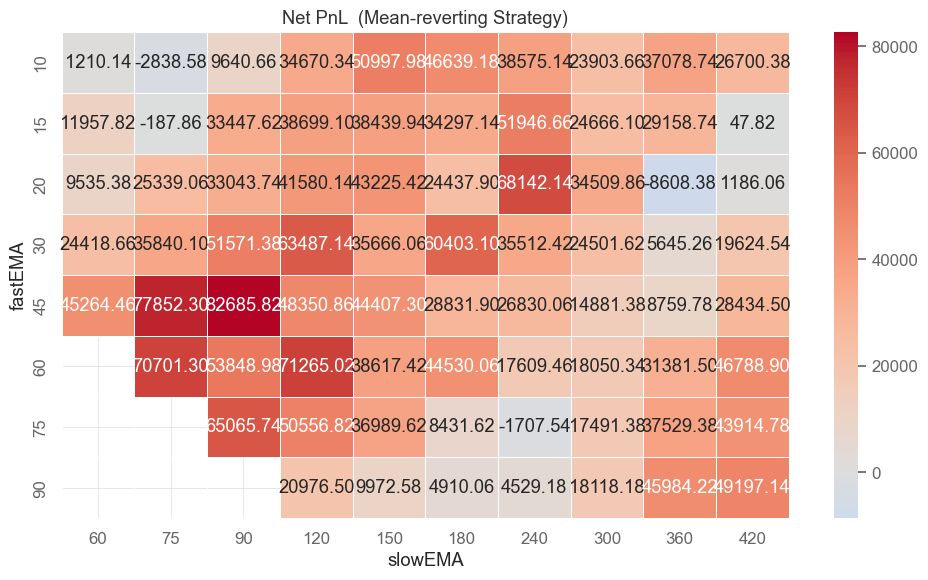

In [540]:
# How about net PnL for MR strategy?

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_PnL_mr',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    cmap = "coolwarm",
    title = 'Net PnL  (Mean-reverting Strategy)'
) 

Strategy 2: Volatility breakout

In [573]:
# lets use fastEMA as the strategy signal
# and use slowEMA+/-m*std as volatility boundaries

#Update of sharpe ratio so it won't divide by 0
def mySR(x, scale=252):
    mu = np.nanmean(x)
    sigma = np.nanstd(x)

    if sigma == 0 or np.isnan(sigma):
        return np.nan

    return np.sqrt(scale) * mu / sigma

from functions.position_VB import positionVB

# we check various parameter combinations in a loop

signalEMA_parameters = [10, 15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [60, 90, 120, 150, 180, 200, 240, 300]
volat_sd_parameters = [60, 90, 120]
m_parameters = [1, 2, 3]

# create a dataframe to store results
summary_all_breakout = pd.DataFrame()

# loop over different parameter combinations
for signalEMA in signalEMA_parameters:
    print(f"signalEMA = {signalEMA}")
    for slowEMA in slowEMA_parameters:
        for volat_sd in volat_sd_parameters:
            for m in m_parameters:
               
                # We calculate the appropriate EMA
                signalEMA_values = NQ_test.ewm(span = signalEMA).mean().to_numpy()
                slowEMA_values = NQ_test.ewm(span = slowEMA).mean().to_numpy()
                                
                # We calculate the standard deviation
                volat_sd_values = NQ_test.rolling(window = volat_sd).std().to_numpy()

                # Insert NaNs wherever the original price is missing
                signalEMA_values[NQ_test.isna()] = np.nan
                slowEMA_values[NQ_test.isna()] = np.nan 
                volat_sd_values[NQ_test.isna()] = np.nan 

                # Calculate position for momentum strategy
                pos_mom = positionVB(signal = signalEMA_values, 
                                     lower = slowEMA_values - m * volat_sd_values,
                                     upper = slowEMA_values + m * volat_sd_values,
                                     pos_flat = pos_flat,
                                     strategy = "mom")
                
                pos_mr = -pos_mom 

                # Calculate gross pnl
                pnl_gross_mom = np.where(np.isnan(pos_mom * NQ_test.diff()), 0, pos_mom * NQ_test.diff() * 20) 
                pnl_gross_mr = np.where(np.isnan(pos_mr * NQ_test.diff()), 0, pos_mr * NQ_test.diff() * 20) 
                # point value for NQ = 20$

                # Calculate number of transactions
                ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                # Calculate net pnl
                pnl_net_mom = pnl_gross_mom - ntrans * 12  # cost $12 per transaction on NQ
                pnl_net_mr = pnl_gross_mr - ntrans * 12  # cost $12 per transaction on NQ
                  
                # Aggregate to daily data
                pnl_gross_mom = pd.Series(pnl_gross_mom)
                pnl_gross_mom.index = NQ_test.index.time
                pnl_gross_mom_d = pnl_gross_mom.groupby(NQ_test.index.date).sum()
                pnl_gross_mr = pd.Series(pnl_gross_mr)
                pnl_gross_mr.index = NQ_test.index.time
                pnl_gross_mr_d = pnl_gross_mr.groupby(NQ_test.index.date).sum()

                pnl_net_mom = pd.Series(pnl_net_mom)
                pnl_net_mom.index = NQ_test.index.time
                pnl_net_mom_d = pnl_net_mom.groupby(NQ_test.index.date).sum()
                pnl_net_mr = pd.Series(pnl_net_mr)
                pnl_net_mr.index = NQ_test.index.time
                pnl_net_mr_d = pnl_net_mr.groupby(NQ_test.index.date).sum()

                ntrans = pd.Series(ntrans)
                ntrans.index = NQ_test.index.time
                ntrans_d = ntrans.groupby(NQ_test.index.date).sum()

                # Calculate Sharpe Ratio and PnL
                gross_SR_mom = mySR(pnl_gross_mom_d, scale=252)
                net_SR_mom = mySR(pnl_net_mom_d, scale=252)
                gross_PnL_mom = pnl_gross_mom_d.sum()
                net_PnL_mom = pnl_net_mom_d.sum()
                gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                gross_PnL_mr = pnl_gross_mr_d.sum()
                net_PnL_mr = pnl_net_mr_d.sum()

                av_daily_ntrans = ntrans_d.mean()

                # Collect the necessary results into one object
                summary = pd.DataFrame({
                    'signalEMA': signalEMA,
                    'slowEMA': slowEMA,
                    'volat_sd': volat_sd,
                    'm': m,
                    'period': '2025',
                    'gross_SR_mom': gross_SR_mom,
                    'net_SR_mom': net_SR_mom,
                    'gross_PnL_mom': gross_PnL_mom,
                    'net_PnL_mom': net_PnL_mom,
                    'gross_SR_mr': gross_SR_mr,
                    'net_SR_mr': net_SR_mr,
                    'gross_PnL_mr': gross_PnL_mr,
                    'net_PnL_mr': net_PnL_mr,
                    'av_daily_ntrans': av_daily_ntrans
                }, index=[0])

                # Append the results to the summary
                summary_all_breakout = pd.concat([summary_all_breakout, summary], ignore_index=True)

    # it takes a (smaller) while
    # approximately 5 minutes

signalEMA = 10
signalEMA = 15
signalEMA = 20
signalEMA = 30
signalEMA = 45
signalEMA = 60
signalEMA = 75
signalEMA = 90


In [575]:
# check 10 strategies with the best net_SR_mom (momentum strategies)

summary_all_breakout.sort_values(by = 'net_PnL_mom', 
                                 ascending = False).head(20) # 14K profit, different set of hyperparameters

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
75,15,60,90,1,2025,2.556297,2.391585,63841.72,59833.72,-2.556297,-2.721540,-63841.72,-67849.72,2.609375
3,10,60,90,1,2025,1.714759,1.534066,60142.44,53926.44,-1.714759,-1.896239,-60142.44,-66358.44,4.046875
78,15,60,120,1,2025,1.955306,1.840801,55010.94,51818.94,-1.955306,-2.069917,-55010.94,-58202.94,2.078125
159,20,90,120,1,2025,1.807509,1.683198,51534.38,48030.38,-1.807509,-1.932009,-51534.38,-55038.38,2.281250
0,10,60,60,1,2025,1.766997,1.514506,54299.62,46667.62,-1.766997,-2.020815,-54299.62,-61931.62,4.968750
15,10,90,120,1,2025,1.596600,1.427139,52056.40,46632.40,-1.596600,-1.766770,-52056.40,-57480.40,3.531250
87,15,90,120,1,2025,1.623616,1.478711,50929.20,46465.20,-1.623616,-1.769007,-50929.20,-55393.20,2.906250
93,15,120,90,1,2025,1.424008,1.261928,48051.04,42675.04,-1.424008,-1.586777,-48051.04,-53427.04,3.500000
84,15,90,90,1,2025,1.312090,1.152588,44064.70,38784.70,-1.312090,-1.472206,-44064.70,-49344.70,3.437500
12,10,90,90,1,2025,1.230013,1.038662,43011.50,36411.50,-1.230013,-1.422303,-43011.50,-49611.50,4.296875


In [579]:
# check 10 strategies with the best net_SR_mr (mean-reverting strategies)

summary_all_breakout.sort_values(by = 'net_PnL_mr', 
                                 ascending = False).head(20) # also pretty high profits

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
558,90,240,60,1,2025,-3.028774,-3.145933,-98383.88,-102391.88,3.028774,2.911132,98383.88,94375.88,2.609375
570,90,300,90,1,2025,-2.965781,-3.078631,-93438.36,-97134.36,2.965781,2.852589,93438.36,89742.36,2.406250
426,60,300,90,1,2025,-2.828114,-2.940465,-93304.50,-97192.50,2.828114,2.715331,93304.50,89416.50,2.531250
486,75,240,60,1,2025,-2.659679,-2.775799,-90705.44,-94857.44,2.659679,2.543072,90705.44,86553.44,2.703125
352,45,300,60,2,2025,-2.630727,-2.738901,-85869.16,-89541.16,2.630727,2.522197,85869.16,82197.16,2.390625
280,30,300,60,2,2025,-2.453023,-2.561377,-81753.36,-85497.36,2.453023,2.344319,81753.36,78009.36,2.437500
208,20,300,60,2,2025,-2.372184,-2.482116,-80120.34,-83960.34,2.372184,2.261907,80120.34,76280.34,2.500000
495,75,300,60,1,2025,-2.342380,-2.456621,-80322.58,-84402.58,2.342380,2.227685,80322.58,76242.58,2.656250
568,90,300,60,2,2025,-2.544159,-2.644552,-78411.74,-81603.74,2.544159,2.443511,78411.74,75219.74,2.078125
567,90,300,60,1,2025,-2.488162,-2.609492,-79073.96,-83105.96,2.488162,2.366302,79073.96,75041.96,2.625000


In [312]:
# summarize the results for the mom strategy
# in the form of a heatmap

# here we have four parameters
# signalEMA, slowEMA, volat_sd and m,
# so to present the results in the form of a heatmap,
# we need to combine them in pairs

summary_all_breakout["signalEMA_slowEMA"] = (
    summary_all_breakout["signalEMA"].astype(int).astype(str).str.zfill(3) + "_" +
    summary_all_breakout["slowEMA"].astype(int).astype(str).str.zfill(3)
)

summary_all_breakout["volat_sd_m"] = (
    summary_all_breakout["volat_sd"].astype(int).astype(str).str.zfill(3) + "_" +
    summary_all_breakout["m"].astype(str)
)

summary_all_breakout.head()

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans,signalEMA_slowEMA,volat_sd_m
0,10,60,60,1,2024-04,-0.287063,-0.696727,-745.08,-1825.08,0.287063,-0.130236,745.08,-334.92,4.5,010_060,060_1
1,10,60,60,2,2024-04,3.641862,3.613261,3250.86,3202.86,-3.641862,-3.669869,-3250.86,-3298.86,0.2,010_060,060_2
2,10,60,60,3,2024-04,NaN,-3.641862,0.00,-24.00,NaN,-3.641862,0.00,-24.00,0.1,010_060,060_3
3,10,60,90,1,2024-04,-5.038695,-5.370441,-13396.30,-14404.30,5.038695,4.700925,13396.30,12388.30,4.2,010_060,090_1
4,10,60,90,2,2024-04,3.641862,3.610102,2930.86,2882.86,-3.641862,-3.672891,-2930.86,-2978.86,0.2,010_060,090_2


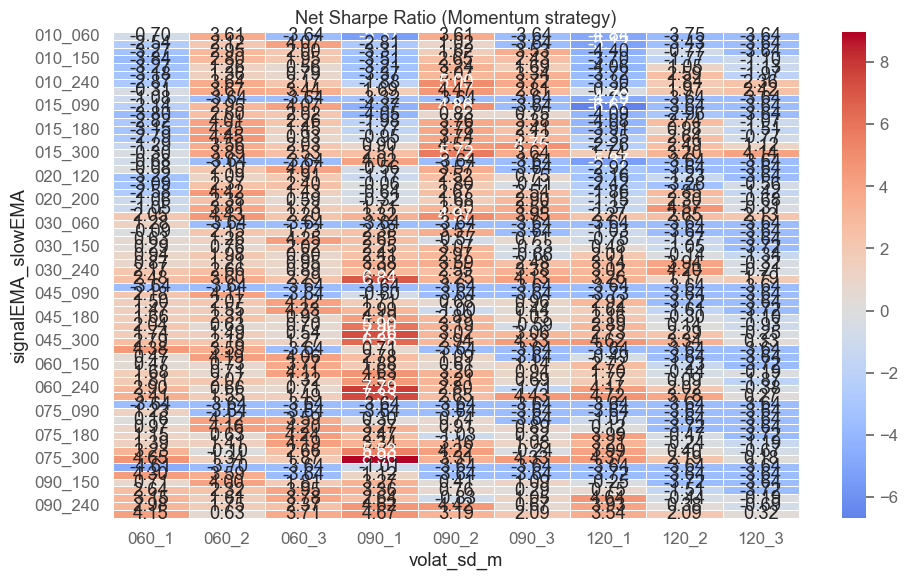

In [313]:
# now we can plot the heatmap
plot_heatmap(
    summary_all_breakout,
    value_col = 'net_SR_mom',
    index_col = 'signalEMA_slowEMA',
    columns_col = 'volat_sd_m',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

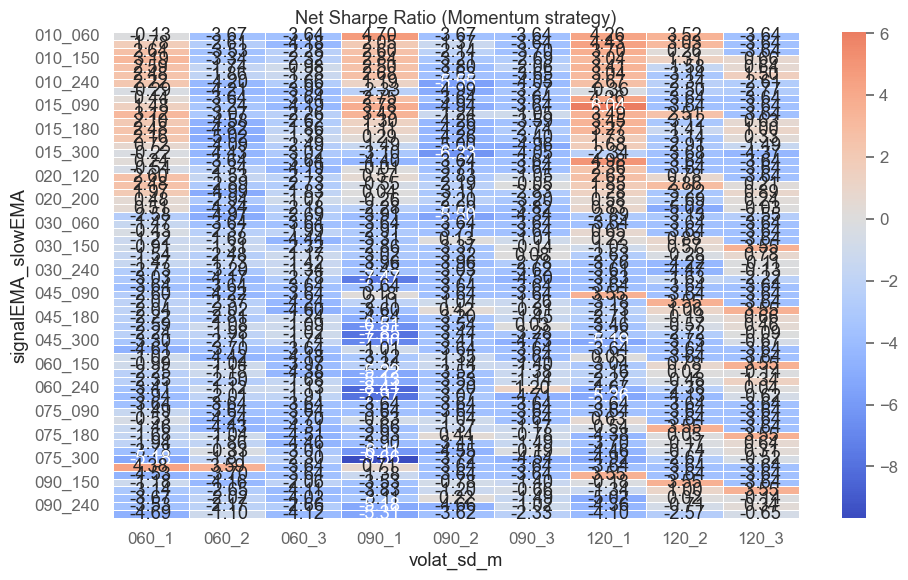

In [314]:
# now we can plot the heatmap
plot_heatmap(
    summary_all_breakout,
    value_col = 'net_SR_mr',
    index_col = 'signalEMA_slowEMA',
    columns_col = 'volat_sd_m',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

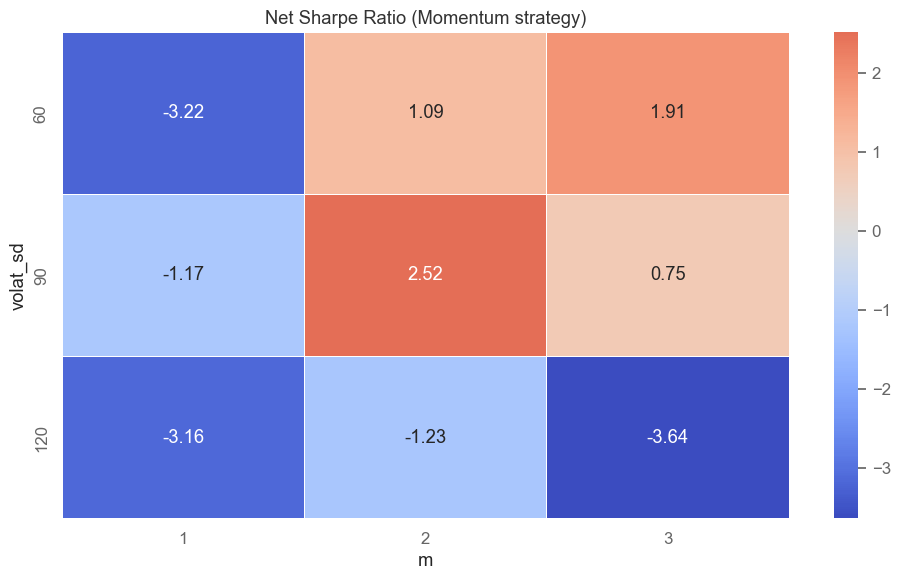

In [ ]:
# Momentum: different set of hyperparameters, what about previous model with the highest net SR are for signalEMA = 20 and slowEMA = 120

# let's check the sensitivity analysis of SR to m and volat_sd

# we select only rows with values of signalEMA and slowEMA
summary_all_breakout_wybrane = summary_all_breakout[
    (summary_all_breakout['signalEMA'] == 20) & (summary_all_breakout['slowEMA'] == 120)
]

# and we create a heatmap for them
plot_heatmap(
    summary_all_breakout_wybrane,
    value_col = 'net_SR_mom',
    index_col = 'volat_sd',
    columns_col = 'm',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

# not with all paramet3ers, but still some positive values

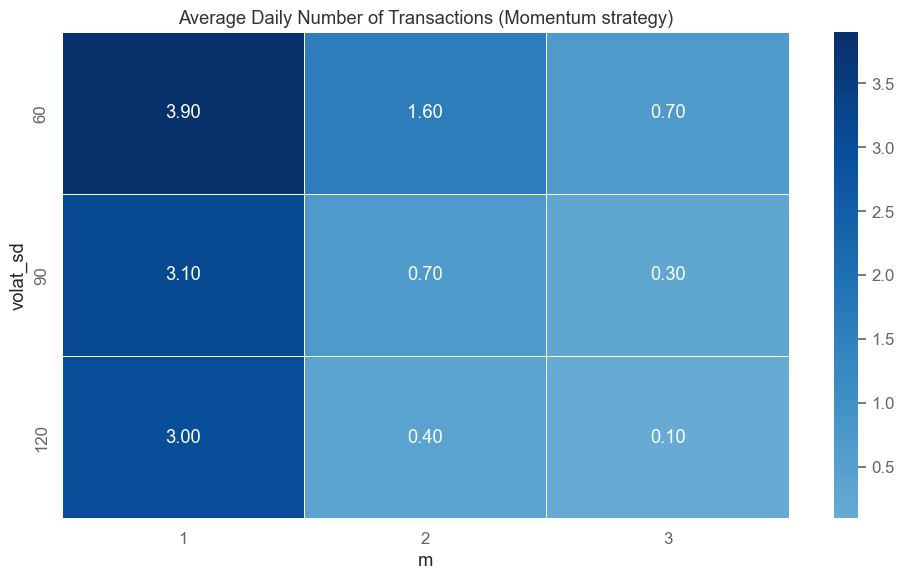

In [320]:
# heatmap plot can also be used to analyze transaction frequency

plot_heatmap(
    summary_all_breakout_wybrane,
    value_col = 'av_daily_ntrans',
    index_col = 'volat_sd',
    columns_col = 'm',
    title = 'Average Daily Number of Transactions (Momentum strategy)',
    cmap = "Blues")

    # in line with expectations
    # the larger the m, the fewer the transactions

#### S&P500 FUTURES (SP)

In [588]:
data1 = pd.read_pickle("data1_input.pkl")
data1.head(401)

,NQ,SP
datetime,,
2023-01-02 09:31:00+00:00,NaN,NaN
2023-01-02 09:32:00+00:00,NaN,NaN
2023-01-02 09:33:00+00:00,NaN,NaN
2023-01-02 09:34:00+00:00,NaN,NaN
2023-01-02 09:35:00+00:00,NaN,NaN
...,...,...
2023-01-03 09:38:00+00:00,NaN,NaN
2023-01-03 09:39:00+00:00,NaN,NaN
2023-01-03 09:40:00+00:00,NaN,NaN


In [589]:
# Let's split the data into training and test sets
# let's assume that data for the first two years (2023, 2024) is for training
# and data for 2025 is for testing

# train: all data up to end of 2024
data1_train = data1[data1.index < "2025-01-01"]

# test: all data from 2025 onwards
data1_test = data1[data1.index >= "2025-01-01"]

data1_train.tail()

,NQ,SP
datetime,,
2024-12-31 15:56:00+00:00,NaN,NaN
2024-12-31 15:57:00+00:00,NaN,NaN
2024-12-31 15:58:00+00:00,NaN,NaN
2024-12-31 15:59:00+00:00,NaN,NaN
2024-12-31 16:00:00+00:00,NaN,NaN


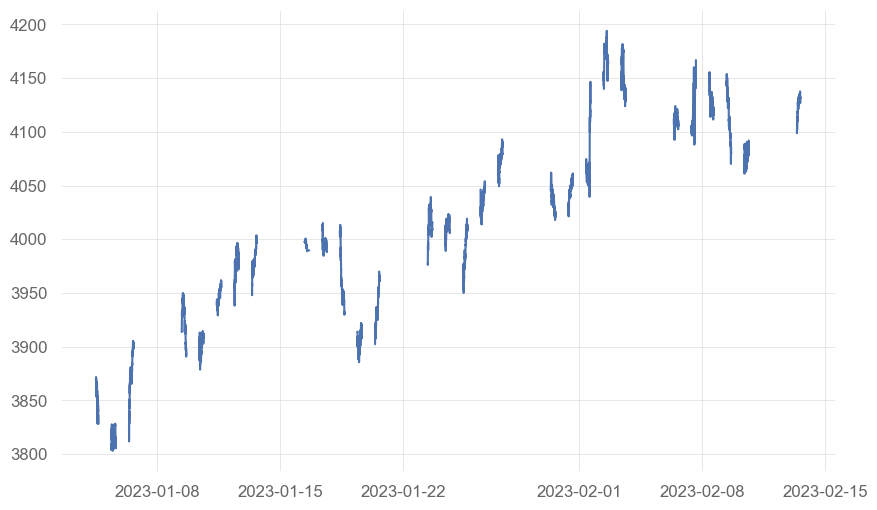

In [591]:
# Lets take NQ values

SP = data1_train['SP']

# check sample break in session

plt.figure(figsize = (10,6))
plt.plot(SP[960:12000])

In [592]:
# Let's assume that we CLOSE ALL POSITIONS before the break (at 15:40).
# so finally, the position will always be 0 between 14:40 and 16:00.
# similarly as earlier, let's create an object named "pos_flat" 
# = 1 if position has to be flat (= 0) - we do not trade
# = 0 otherwise

# let's fill it first with zeros
pos_flat = np.zeros(len(SP))

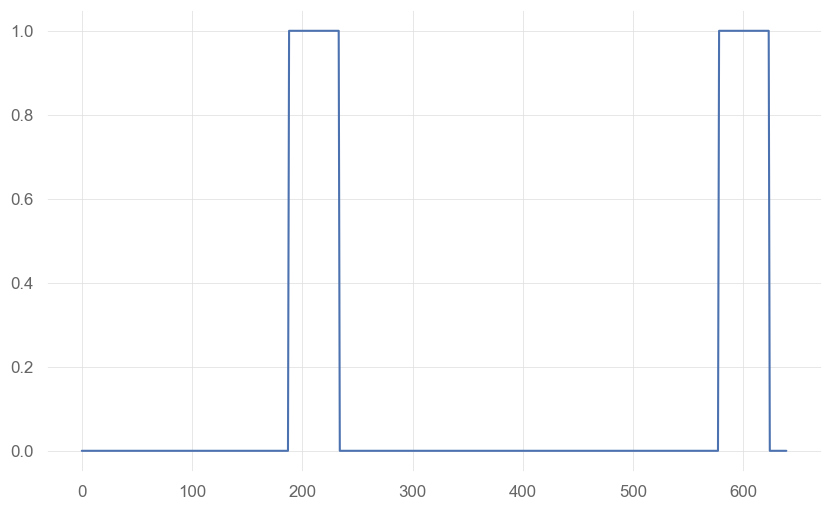

In [593]:
# put our assumptions into pos_flat
pos_flat = np.zeros(len(SP))

t = SP.index.time

breaks = (
    ((t >= pd.to_datetime("09:30").time()) & (t <= pd.to_datetime("09:55").time())) |
    ((t >= pd.to_datetime("15:40").time()) & (t <= pd.to_datetime("16:00").time()))
)

pos_flat[breaks] = 1


# let's see an example break in the session from the perspective of pos_flat

plt.figure(figsize = (10,6))
plt.plot(pos_flat[960:1600])

In [594]:
# lets check which weekdays we have data for

dweek_ = SP.index.dayofweek + 1  # Adjust so that 0 = Monday, ..., 6 = Sunday
print(dweek_.value_counts())

# no Saturdays and Sundays in the data (perfect distribution?)

datetime
2    25612
5    25346
4    25299
3    24943
1    24701
Name: count, dtype: int64


In [595]:
# lets create a time_ object (vector of times)

time_ = SP.index.time

# and let's fill the pos_flat vector with ones for weekends

pos_flat[((dweek_ == 5) & (time_ > pd.to_datetime('16:00').time())) |      # end of Friday
          (dweek_ == 6) |                                                  # whole Saturday (just in case)
          ((dweek_ == 7) & (time_ <= pd.to_datetime('9:55').time()))] = 1 # beginning of Sunday

Strategy 1: 2 intersecting moving averages

In [596]:
# we check various parameter combinations in a loop

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

fastEMA_parameters = [10, 15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [60, 75, 90, 120, 150, 180, 240, 300, 360, 420]

# create a dataframe to store results
summary_all_2MAs = pd.DataFrame()

# Loop over different parameter combinations
for fastEMA in fastEMA_parameters:
    for slowEMA in slowEMA_parameters:
                
                # ensure that fastEMA is less than slowEMA
                if fastEMA >= slowEMA:
                    continue

                print(f"fastEMA = {fastEMA}, slowEMA = {slowEMA}")

                # We calculate the appropriate EMA
                fastEMA_values = SP.ewm(span = fastEMA).mean()
                slowEMA_values = SP.ewm(span = slowEMA).mean()

                # Insert NaNs wherever the original price is missing
                fastEMA_values[SP.isna()] = np.nan
                slowEMA_values[SP.isna()] = np.nan 

                # Calculate position for momentum strategy
                cond2b_mom_long = fastEMA_values.shift(1) > slowEMA_values.shift(1)
                
                # let's add filters that check for the presence of NaN values
                fastEMA_nonmiss = fastEMA_values.shift(1).notna()
                slowEMA_nonmiss = slowEMA_values.shift(1).notna()

                # Now we can add these conditions to our strategies
                # if any of the values is missing,
                # we cannot make a position decision

                pos_mom = np.where(fastEMA_nonmiss & slowEMA_nonmiss,
                                   np.where(cond2b_mom_long, 1, -1),
                                   np.nan)
                pos_mr = -pos_mom 

                # Set position to 0 where pos_flat is 1
                pos_mom[pos_flat == 1] = 0
                pos_mr[pos_flat == 1] = 0
                
                # Calculate gross pnl
                pnl_gross_mom = np.where(np.isnan(pos_mom * SP.diff()), 0, pos_mom * SP.diff() * 50) 
                pnl_gross_mr = np.where(np.isnan(pos_mr * SP.diff()), 0, pos_mr * SP.diff() * 50) 
                # point value for SP

                # Calculate number of transactions
                ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                # Calculate net pnl
                pnl_net_mom = pnl_gross_mom - ntrans * 12  # cost $12 per transaction on SP
                pnl_net_mr = pnl_gross_mr - ntrans * 12  # cost $12 per transaction on SP
                  
                # Aggregate to daily data
                pnl_gross_mom = pd.Series(pnl_gross_mom)
                pnl_gross_mom.index = SP.index.time
                pnl_gross_mom_d = pnl_gross_mom.groupby(SP.index.date).sum()
                pnl_gross_mr = pd.Series(pnl_gross_mr)
                pnl_gross_mr.index = SP.index.time
                pnl_gross_mr_d = pnl_gross_mr.groupby(SP.index.date).sum()

                pnl_net_mom = pd.Series(pnl_net_mom)
                pnl_net_mom.index = SP.index.time
                pnl_net_mom_d = pnl_net_mom.groupby(SP.index.date).sum()
                pnl_net_mr = pd.Series(pnl_net_mr)
                pnl_net_mr.index = SP.index.time
                pnl_net_mr_d = pnl_net_mr.groupby(SP.index.date).sum()

                ntrans = pd.Series(ntrans)
                ntrans.index = SP.index.time
                ntrans_d = ntrans.groupby(SP.index.date).sum()

                # Calculate Sharpe Ratio and PnL
                gross_SR_mom = mySR(pnl_gross_mom_d, scale=252)
                net_SR_mom = mySR(pnl_net_mom_d, scale=252)
                gross_PnL_mom = pnl_gross_mom_d.sum()
                net_PnL_mom = pnl_net_mom_d.sum()
                gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                gross_PnL_mr = pnl_gross_mr_d.sum()
                net_PnL_mr = pnl_net_mr_d.sum()

                av_daily_ntrans = ntrans_d.mean()

                # Collect necessary results into one object
                summary = pd.DataFrame({
                    'fastEMA': fastEMA,
                    'slowEMA': slowEMA,
                    'period': '2023-2024',
                    'gross_SR_mom': gross_SR_mom,
                    'net_SR_mom': net_SR_mom,
                    'gross_PnL_mom': gross_PnL_mom,
                    'net_PnL_mom': net_PnL_mom,
                    'gross_SR_mr': gross_SR_mr,
                    'net_SR_mr': net_SR_mr,
                    'gross_PnL_mr': gross_PnL_mr,
                    'net_PnL_mr': net_PnL_mr,
                    'av_daily_ntrans': av_daily_ntrans
                }, index=[0])

                # Append results to the summary
                summary_all_2MAs = pd.concat([summary_all_2MAs, summary], ignore_index=True)

fastEMA = 10, slowEMA = 60
fastEMA = 10, slowEMA = 75
fastEMA = 10, slowEMA = 90
fastEMA = 10, slowEMA = 120
fastEMA = 10, slowEMA = 150
fastEMA = 10, slowEMA = 180
fastEMA = 10, slowEMA = 240
fastEMA = 10, slowEMA = 300
fastEMA = 10, slowEMA = 360
fastEMA = 10, slowEMA = 420
fastEMA = 15, slowEMA = 60
fastEMA = 15, slowEMA = 75
fastEMA = 15, slowEMA = 90
fastEMA = 15, slowEMA = 120
fastEMA = 15, slowEMA = 150
fastEMA = 15, slowEMA = 180
fastEMA = 15, slowEMA = 240
fastEMA = 15, slowEMA = 300
fastEMA = 15, slowEMA = 360
fastEMA = 15, slowEMA = 420
fastEMA = 20, slowEMA = 60
fastEMA = 20, slowEMA = 75
fastEMA = 20, slowEMA = 90
fastEMA = 20, slowEMA = 120
fastEMA = 20, slowEMA = 150
fastEMA = 20, slowEMA = 180
fastEMA = 20, slowEMA = 240
fastEMA = 20, slowEMA = 300
fastEMA = 20, slowEMA = 360
fastEMA = 20, slowEMA = 420
fastEMA = 30, slowEMA = 60
fastEMA = 30, slowEMA = 75
fastEMA = 30, slowEMA = 90
fastEMA = 30, slowEMA = 120
fastEMA = 30, slowEMA = 150
fastEMA = 30, slowEMA = 180
fast

In [597]:
# lets see top 5 stategies with respect to net_SR_mom
summary_all_2MAs.sort_values(by = 'net_PnL_mom',
                            ascending = False).head(5) #High profits and net SR ratios on momentum strategies (up to +31K $!)

,fastEMA,slowEMA,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
57,60,360,2023-2024,1.194628,0.648500,34410.5,18905.6,-1.194628,-1.756042,-34410.5,-49985.6,3.996914
49,45,420,2023-2024,1.120864,0.550821,31917.8,15884.9,-1.120864,-1.707463,-31917.8,-48020.9,4.132716
65,75,360,2023-2024,1.036557,0.510694,29790.1,14837.2,-1.036557,-1.576042,-29790.1,-44813.2,3.854938
62,75,180,2023-2024,1.172655,0.497247,33228.4,14291.5,-1.172655,-1.869466,-33228.4,-52235.5,4.879630
54,60,180,2023-2024,1.167586,0.450469,33337.6,13080.7,-1.167586,-1.911095,-33337.6,-53664.7,5.219136


In [598]:
# lets see top 5 stategies with respect to net_SR_mr
summary_all_2MAs.sort_values(by = 'net_PnL_mr',
                            ascending = False).head(5)

,fastEMA,slowEMA,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
15,15,180,2023-2024,-0.106142,-1.169447,-3198.3,-36247.2,0.106142,-1.021073,3198.3,-29920.8,8.509259
73,90,420,2023-2024,0.557897,0.055399,15898.7,1593.8,-0.557897,-1.072264,-15898.7,-30273.8,3.688272
25,20,180,2023-2024,0.078256,-0.859897,2383.5,-26825.4,-0.078256,-1.064443,-2383.5,-31662.6,7.521605
35,30,180,2023-2024,0.279082,-0.544266,8504.0,-16960.9,-0.279082,-1.142287,-8504.0,-34039.1,6.558642
14,15,150,2023-2024,-0.058369,-1.198948,-1796.8,-38013.7,0.058369,-1.153634,1796.8,-34490.3,9.324074


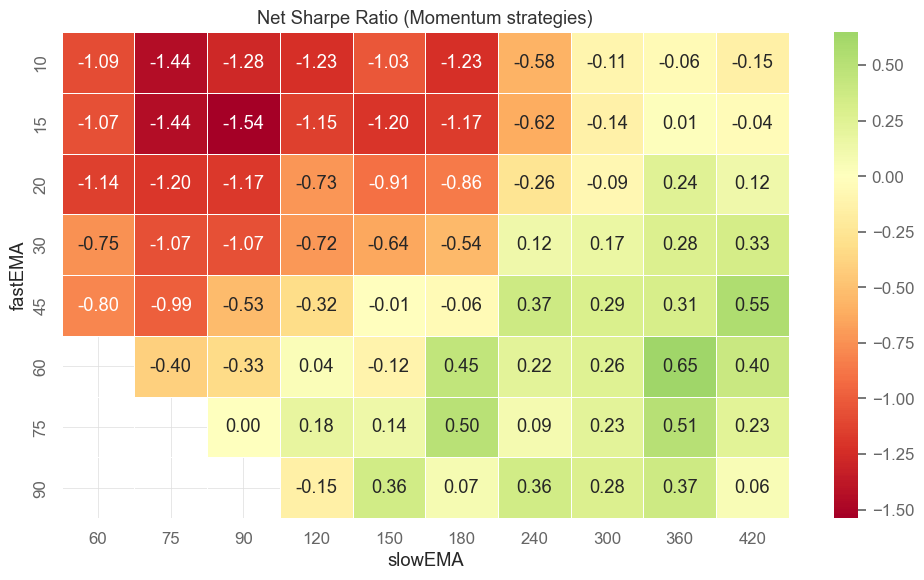

In [599]:
# we wil use it to visualize net SR values
# for the momentum strategy (MOM)

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_SR_mom',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    title = 'Net Sharpe Ratio (Momentum strategies)'
)

#Several combinations with positive net SR (90:150 the best)

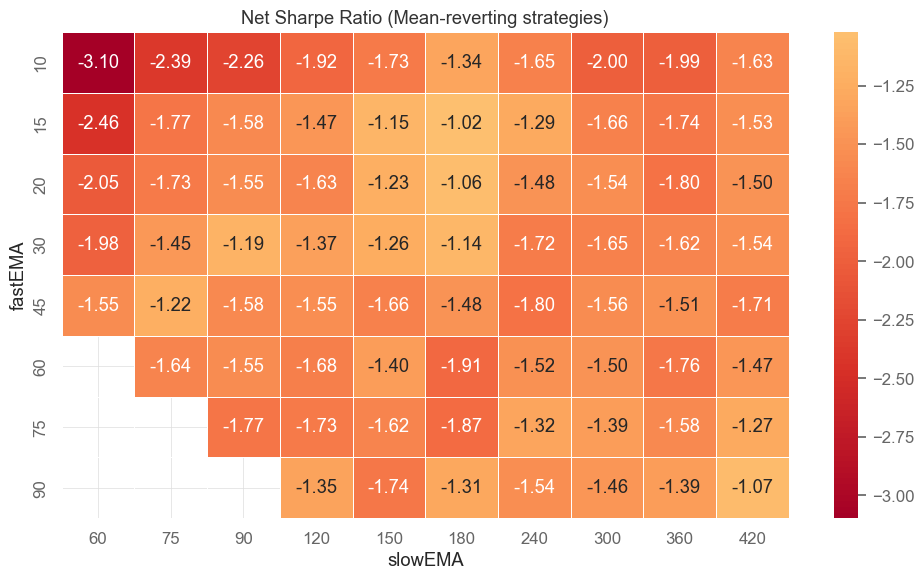

In [ ]:
# we wil use it to visualize net SR values
# for the mean-reverting strategy (MR)

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_SR_mr',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    title = 'Net Sharpe Ratio (Mean-reverting strategies)'
)

# No positive SR


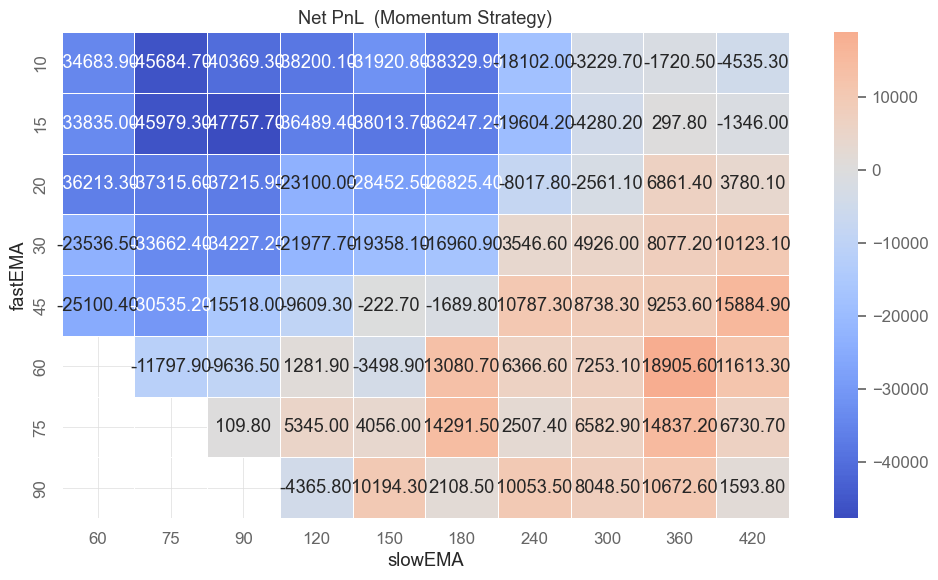

In [601]:
# How about net PnL for Momentum strategy?

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_PnL_mom',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    cmap = "coolwarm",
    title = 'Net PnL  (Momentum Strategy)'
) #Strategy with highest net SR leads to higher profit, results seems pretty reasonable

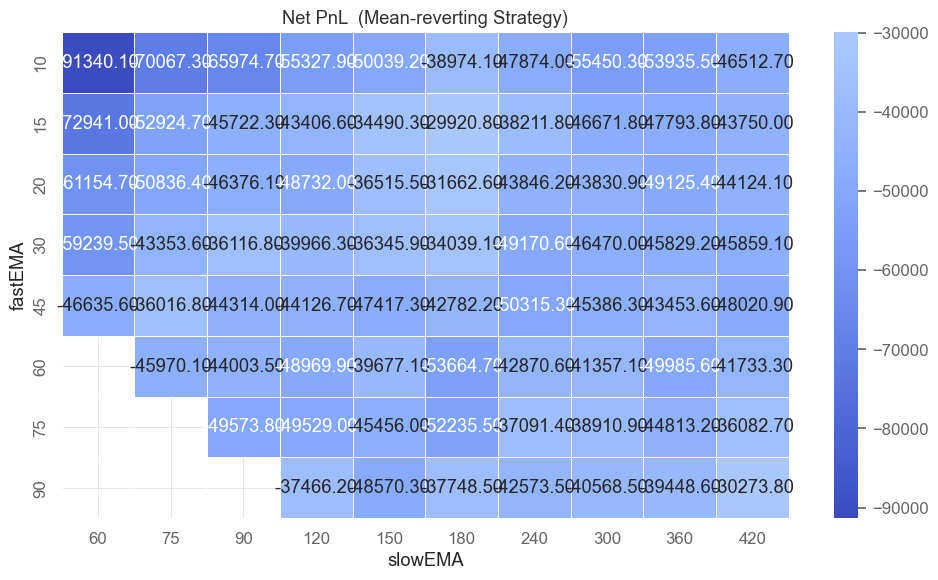

In [ ]:
# How about net PnL for Mean-reverting strategy?

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_PnL_mr',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    cmap = "coolwarm",
    title = 'Net PnL  (Mean-reverting Strategy)'
)  #No positive PnL

Strategy 2: Volatility breakout

In [603]:
#Update of sharpe ratio so it won't divide by 0
def mySR(x, scale=252):
    mu = np.nanmean(x)
    sigma = np.nanstd(x)

    if sigma == 0 or np.isnan(sigma):
        return np.nan

    return np.sqrt(scale) * mu / sigma

# let's use fastEMA as the strategy signal
# and use slowEMA+/-m*std as volatility boundaries

from functions.position_VB import positionVB

# we check various parameter combinations in a loop

signalEMA_parameters = [10, 15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [60, 90, 120, 150, 180, 200, 240, 300]
volat_sd_parameters = [60, 90, 120]
m_parameters = [1, 2, 3]

# create a dataframe to store results
summary_all_breakout = pd.DataFrame()

# loop over different parameter combinations
for signalEMA in signalEMA_parameters:
    print(f"signalEMA = {signalEMA}")
    for slowEMA in slowEMA_parameters:
        for volat_sd in volat_sd_parameters:
            for m in m_parameters:
               
                # We calculate the appropriate EMA
                signalEMA_values = SP.ewm(span = signalEMA).mean().to_numpy()
                slowEMA_values = SP.ewm(span = slowEMA).mean().to_numpy()
                                
                # We calculate the standard deviation
                volat_sd_values = SP.rolling(window = volat_sd).std().to_numpy()

                # Insert NaNs wherever the original price is missing
                signalEMA_values[SP.isna()] = np.nan
                slowEMA_values[SP.isna()] = np.nan 
                volat_sd_values[SP.isna()] = np.nan 

                # Calculate position for momentum strategy
                pos_mom = positionVB(signal = signalEMA_values, 
                                     lower = slowEMA_values - m * volat_sd_values,
                                     upper = slowEMA_values + m * volat_sd_values,
                                     pos_flat = pos_flat,
                                     strategy = "mom")
                
                pos_mr = -pos_mom 

                # Calculate gross pnl
                pnl_gross_mom = np.where(np.isnan(pos_mom * SP.diff()), 0, pos_mom * SP.diff() * 50) 
                pnl_gross_mr = np.where(np.isnan(pos_mr * SP.diff()), 0, pos_mr * SP.diff() * 50) 
                # point value for SP = 50$

                # Calculate number of transactions
                ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                # Calculate net pnl
                pnl_net_mom = pnl_gross_mom - ntrans * 12  # cost $12 per transaction on SP
                pnl_net_mr = pnl_gross_mr - ntrans * 12  # cost $12 per transaction on SP
                  
                # Aggregate to daily data
                pnl_gross_mom = pd.Series(pnl_gross_mom)
                pnl_gross_mom.index = SP.index.time
                pnl_gross_mom_d = pnl_gross_mom.groupby(SP.index.date).sum()
                pnl_gross_mr = pd.Series(pnl_gross_mr)
                pnl_gross_mr.index = SP.index.time
                pnl_gross_mr_d = pnl_gross_mr.groupby(SP.index.date).sum()

                pnl_net_mom = pd.Series(pnl_net_mom)
                pnl_net_mom.index = SP.index.time
                pnl_net_mom_d = pnl_net_mom.groupby(SP.index.date).sum()
                pnl_net_mr = pd.Series(pnl_net_mr)
                pnl_net_mr.index = SP.index.time
                pnl_net_mr_d = pnl_net_mr.groupby(SP.index.date).sum()

                ntrans = pd.Series(ntrans)
                ntrans.index = SP.index.time
                ntrans_d = ntrans.groupby(SP.index.date).sum()

                # Calculate Sharpe Ratio and PnL
                gross_SR_mom = mySR(pnl_gross_mom_d, scale=252)
                net_SR_mom = mySR(pnl_net_mom_d, scale=252)
                gross_PnL_mom = pnl_gross_mom_d.sum()
                net_PnL_mom = pnl_net_mom_d.sum()
                gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                gross_PnL_mr = pnl_gross_mr_d.sum()
                net_PnL_mr = pnl_net_mr_d.sum()

                av_daily_ntrans = ntrans_d.mean()

                # Collect the necessary results into one object
                summary = pd.DataFrame({
                    'signalEMA': signalEMA,
                    'slowEMA': slowEMA,
                    'volat_sd': volat_sd,
                    'm': m,
                    'period': '2023-2024',
                    'gross_SR_mom': gross_SR_mom,
                    'net_SR_mom': net_SR_mom,
                    'gross_PnL_mom': gross_PnL_mom,
                    'net_PnL_mom': net_PnL_mom,
                    'gross_SR_mr': gross_SR_mr,
                    'net_SR_mr': net_SR_mr,
                    'gross_PnL_mr': gross_PnL_mr,
                    'net_PnL_mr': net_PnL_mr,
                    'av_daily_ntrans': av_daily_ntrans
                }, index=[0])

                # Append the results to the summary
                summary_all_breakout = pd.concat([summary_all_breakout, summary], ignore_index=True)

    # it takes a while
    # approximately 11 (!) minutes

signalEMA = 10
signalEMA = 15
signalEMA = 20
signalEMA = 30
signalEMA = 45
signalEMA = 60
signalEMA = 75
signalEMA = 90


In [604]:
# check 10 strategies with the best net_SR_mom (momentum strategies)

summary_all_breakout.sort_values(by = 'net_PnL_mom', 
                                 ascending = False).head(10) # 31K profit, slightly lower than for 2xEMA

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
177,20,150,120,1,2023-2024,2.256449,1.702779,45003.55,34203.55,-2.256449,-2.817636,-45003.55,-55803.55,2.777778
165,20,120,90,1,2023-2024,2.088376,1.532166,45850.05,33922.05,-2.088376,-2.653671,-45850.05,-57778.05,3.067901
162,20,120,60,1,2023-2024,2.002954,1.373034,46047.15,31911.15,-2.002954,-2.646374,-46047.15,-60183.15,3.635802
267,30,200,120,1,2023-2024,2.104394,1.601968,41163.50,31515.50,-2.104394,-2.612348,-41163.50,-50811.50,2.481481
195,20,200,120,1,2023-2024,2.012110,1.483910,41640.20,30912.20,-2.012110,-2.547034,-41640.20,-52368.20,2.759259
213,20,300,120,1,2023-2024,1.943570,1.434079,40583.45,30143.45,-1.943570,-2.459594,-40583.45,-51023.45,2.685185
52,10,200,120,2,2023-2024,2.079728,1.658646,36694.65,29326.65,-2.079728,-2.502147,-36694.65,-44062.65,1.895062
171,20,150,60,1,2023-2024,1.819418,1.211927,43043.80,28979.80,-1.819418,-2.439722,-43043.80,-57107.80,3.617284
204,20,240,120,1,2023-2024,1.839138,1.331462,39182.45,28550.45,-1.839138,-2.353198,-39182.45,-49814.45,2.734568
186,20,180,120,1,2023-2024,1.902199,1.364659,39123.25,28251.25,-1.902199,-2.446505,-39123.25,-49995.25,2.796296


In [605]:
# check 10 strategies with the best net_SR_mr

summary_all_breakout.sort_values(by = 'net_PnL_mr', 
                                 ascending = False).head(10) #Here also not bat, 19K net profit

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
558,90,240,60,1,2023-2024,-0.803246,-1.226936,-19052.35,-29300.35,0.803246,0.373709,19052.35,8804.35,2.635802
507,90,60,90,1,2023-2024,-0.806398,-0.938081,-8348.40,-9716.40,0.806398,0.674331,8348.40,6980.40,0.351852
511,90,60,120,2,2023-2024,-0.963658,-1.036671,-7211.65,-7787.65,0.963658,0.889842,7211.65,6635.65,0.148148
512,90,60,120,3,2023-2024,-0.963658,-1.036671,-7211.65,-7787.65,0.963658,0.889842,7211.65,6635.65,0.148148
509,90,60,90,3,2023-2024,-0.936326,-1.026771,-7011.05,-7707.05,0.936326,0.845130,7011.05,6315.05,0.179012
508,90,60,90,2,2023-2024,-0.936326,-1.026771,-7011.05,-7707.05,0.936326,0.845130,7011.05,6315.05,0.179012
318,45,150,90,1,2023-2024,-0.750910,-1.193876,-15310.55,-24502.55,0.750910,0.302035,15310.55,6118.55,2.364198
506,90,60,60,3,2023-2024,-0.716456,-0.899419,-7664.45,-9608.45,0.716456,0.533644,7664.45,5720.45,0.500000
510,90,60,120,1,2023-2024,-0.805060,-0.890187,-6177.30,-6849.30,0.805060,0.719221,6177.30,5505.30,0.172840
387,60,150,60,1,2023-2024,-0.670362,-1.122199,-15359.30,-25895.30,0.670362,0.212007,15359.30,4823.30,2.709877


In [606]:
# summarize the results for the mom strategy
# in the form of a heatmap

# here we have four parameters
# signalEMA, slowEMA, volat_sd and m,
# so to present the results in the form of a heatmap,
# we need to combine them in pairs

summary_all_breakout["signalEMA_slowEMA"] = (
    summary_all_breakout["signalEMA"].astype(int).astype(str).str.zfill(3) + "_" +
    summary_all_breakout["slowEMA"].astype(int).astype(str).str.zfill(3)
)

summary_all_breakout["volat_sd_m"] = (
    summary_all_breakout["volat_sd"].astype(int).astype(str).str.zfill(3) + "_" +
    summary_all_breakout["m"].astype(str)
)

summary_all_breakout.head()

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans,signalEMA_slowEMA,volat_sd_m
0,10,60,60,1,2023-2024,0.704538,-0.095796,17588.50,-2427.50,-0.704538,-1.528896,-17588.50,-37604.50,5.148148,010_060,060_1
1,10,60,60,2,2023-2024,0.235488,0.009743,2954.70,122.70,-0.235488,-0.462634,-2954.70,-5786.70,0.728395,010_060,060_2
2,10,60,60,3,2023-2024,0.060055,-0.123539,650.05,-1341.95,-0.060055,-0.244785,-650.05,-2642.05,0.512346,010_060,060_3
3,10,60,90,1,2023-2024,0.697486,0.065125,16777.25,1585.25,-0.697486,-1.344899,-16777.25,-31969.25,3.907407,010_060,090_1
4,10,60,90,2,2023-2024,0.971028,0.832423,10454.70,8966.70,-0.971028,-1.109233,-10454.70,-11942.70,0.382716,010_060,090_2


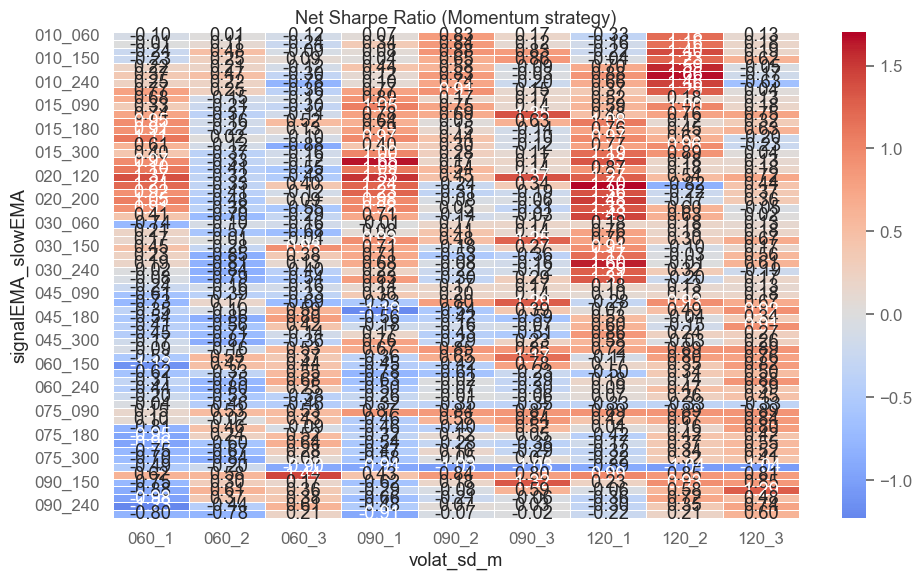

In [607]:
# now we can plot the heatmap
plot_heatmap(
    summary_all_breakout,
    value_col = 'net_SR_mom',
    index_col = 'signalEMA_slowEMA',
    columns_col = 'volat_sd_m',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

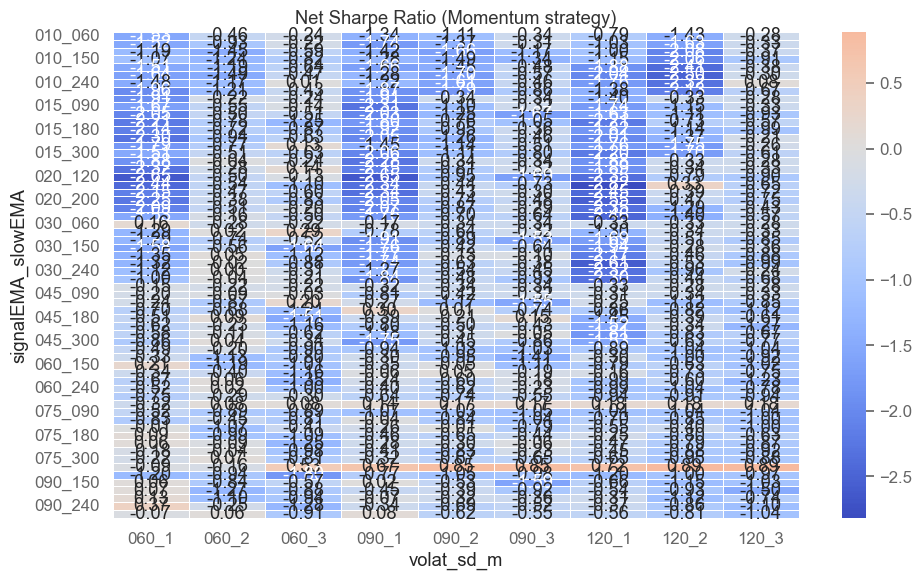

In [608]:
# for mean-reverting
plot_heatmap(
    summary_all_breakout,
    value_col = 'net_SR_mr',
    index_col = 'signalEMA_slowEMA',
    columns_col = 'volat_sd_m',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

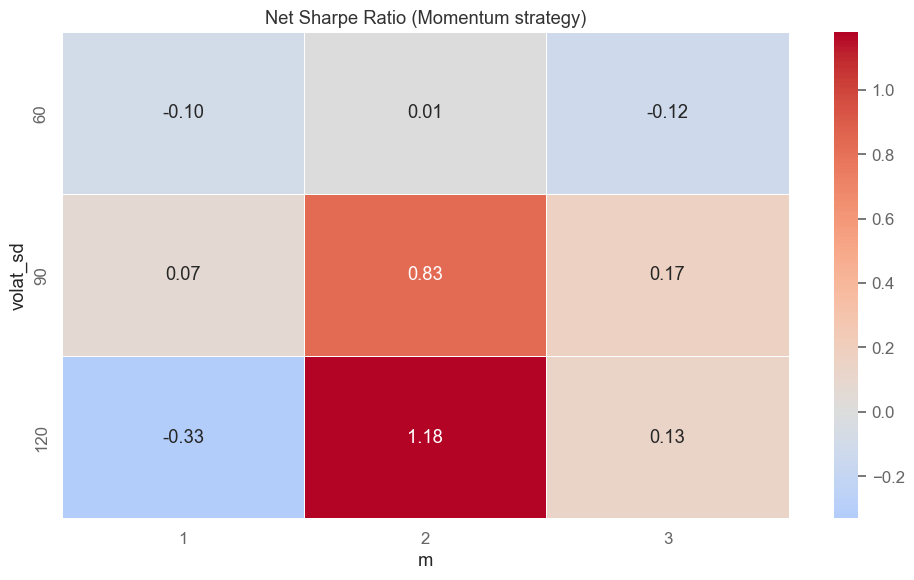

In [609]:
# Momentum: the highest net SR are for signalEMA = 10 and slowEMA = 60

# let's check the sensitivity analysis of SR to m and volat_sd

# we select only rows with values of signalEMA and slowEMA
summary_all_breakout_wybrane = summary_all_breakout[
    (summary_all_breakout['signalEMA'] == 10) & (summary_all_breakout['slowEMA'] == 60)
]

# and we create a heatmap for them
plot_heatmap(
    summary_all_breakout_wybrane,
    value_col = 'net_SR_mom',
    index_col = 'volat_sd',
    columns_col = 'm',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

# Rather not an anomally

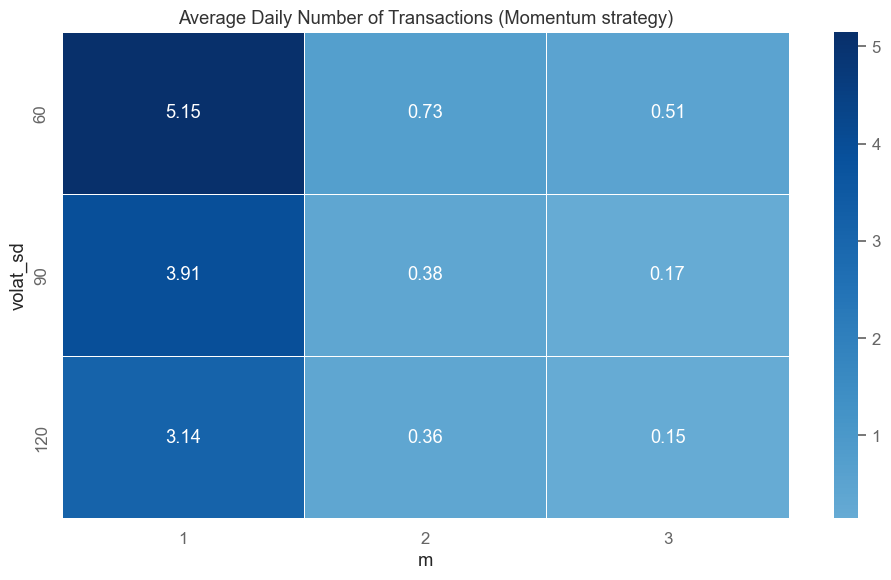

In [610]:
# heatmap plot can also be used to analyze transaction frequency

plot_heatmap(
    summary_all_breakout_wybrane,
    value_col = 'av_daily_ntrans',
    index_col = 'volat_sd',
    columns_col = 'm',
    title = 'Average Daily Number of Transactions (Momentum strategy)',
    cmap = "Blues")

    # in line with expectations
    # the larger the m, the fewer the transactions

Testing of developped strategies

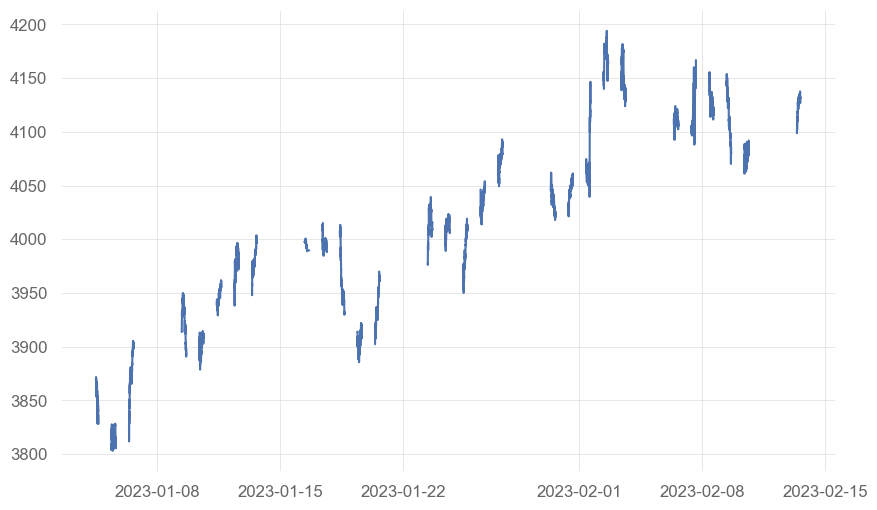

In [611]:
# Lets take NQ values

SP_test = data1_test['SP']

# check sample break in session

plt.figure(figsize = (10,6))
plt.plot(SP[960:12000])

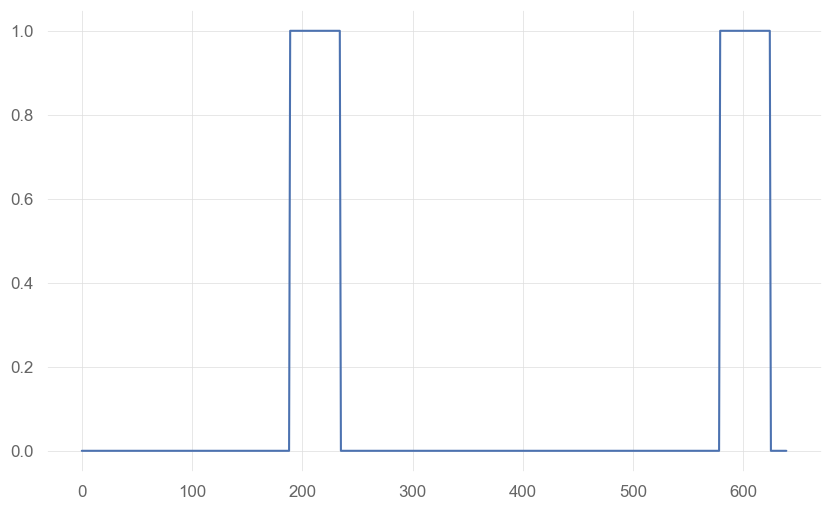

In [612]:
# put our assumptions into pos_flat
pos_flat = np.zeros(len(SP_test))

t = SP_test.index.time

breaks = (
    ((t >= pd.to_datetime("09:30").time()) & (t <= pd.to_datetime("09:55").time())) |
    ((t >= pd.to_datetime("15:40").time()) & (t <= pd.to_datetime("16:00").time()))
)

pos_flat[breaks] = 1


# let's see an example break in the session from the perspective of pos_flat

plt.figure(figsize = (10,6))
plt.plot(pos_flat[960:1600])

In [613]:
# lets check which weekdays we have data for

dweek_ = SP_test.index.dayofweek + 1  # Adjust so that 0 = Monday, ..., 6 = Sunday
print(dweek_.value_counts())

# no Saturdays and Sundays in the data

datetime
4    10140
5    10138
1    10137
2     9750
3     9746
Name: count, dtype: int64


In [614]:
# lets create a time_ object (vector of times)

time_ = SP_test.index.time

# and let's fill the pos_flat vector with ones for weekends

pos_flat[((dweek_ == 5) & (time_ > pd.to_datetime('16:00').time())) |      # end of Friday
          (dweek_ == 6) |                                                  # whole Saturday (just in case)
          ((dweek_ == 7) & (time_ <= pd.to_datetime('9:55').time()))] = 1 # beginning of Sunday

Strategy 1: 2 intersecting moving averages

In [615]:
# we check various parameter combinations in a loop

fastEMA_parameters = [10, 15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [60, 75, 90, 120, 150, 180, 240, 300, 360, 420]

# create a dataframe to store results
summary_all_2MAs = pd.DataFrame()

# Loop over different parameter combinations
for fastEMA in fastEMA_parameters:
    for slowEMA in slowEMA_parameters:
                
                # ensure that fastEMA is less than slowEMA
                if fastEMA >= slowEMA:
                    continue

                print(f"fastEMA = {fastEMA}, slowEMA = {slowEMA}")

                # We calculate the appropriate EMA
                fastEMA_values = SP_test.ewm(span = fastEMA).mean()
                slowEMA_values = SP_test.ewm(span = slowEMA).mean()

                # Insert NaNs wherever the original price is missing
                fastEMA_values[SP_test.isna()] = np.nan
                slowEMA_values[SP_test.isna()] = np.nan 

                # Calculate position for momentum strategy
                cond2b_mom_long = fastEMA_values.shift(1) > slowEMA_values.shift(1)
                
                # let's add filters that check for the presence of NaN values
                fastEMA_nonmiss = fastEMA_values.shift(1).notna()
                slowEMA_nonmiss = slowEMA_values.shift(1).notna()

                # Now we can add these conditions to our strategies
                # if any of the values is missing,
                # we cannot make a position decision

                pos_mom = np.where(fastEMA_nonmiss & slowEMA_nonmiss,
                                   np.where(cond2b_mom_long, 1, -1),
                                   np.nan)
                pos_mr = -pos_mom 

                # Set position to 0 where pos_flat is 1
                pos_mom[pos_flat == 1] = 0
                pos_mr[pos_flat == 1] = 0
                
                # Calculate gross pnl
                pnl_gross_mom = np.where(np.isnan(pos_mom * SP_test.diff()), 0, pos_mom * SP_test.diff() * 50) 
                pnl_gross_mr = np.where(np.isnan(pos_mr * SP_test.diff()), 0, pos_mr * SP_test.diff() * 50) 
                # point value for SP

                # Calculate number of transactions
                ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                # Calculate net pnl
                pnl_net_mom = pnl_gross_mom - ntrans * 12  # cost $12 per transaction on SP
                pnl_net_mr = pnl_gross_mr - ntrans * 12  # cost $12 per transaction on SP
                  
                # Aggregate to daily data
                pnl_gross_mom = pd.Series(pnl_gross_mom)
                pnl_gross_mom.index = SP_test.index.time
                pnl_gross_mom_d = pnl_gross_mom.groupby(SP_test.index.date).sum()
                pnl_gross_mr = pd.Series(pnl_gross_mr)
                pnl_gross_mr.index = SP_test.index.time
                pnl_gross_mr_d = pnl_gross_mr.groupby(SP_test.index.date).sum()

                pnl_net_mom = pd.Series(pnl_net_mom)
                pnl_net_mom.index = SP_test.index.time
                pnl_net_mom_d = pnl_net_mom.groupby(SP_test.index.date).sum()
                pnl_net_mr = pd.Series(pnl_net_mr)
                pnl_net_mr.index = SP_test.index.time
                pnl_net_mr_d = pnl_net_mr.groupby(SP_test.index.date).sum()

                ntrans = pd.Series(ntrans)
                ntrans.index = SP_test.index.time
                ntrans_d = ntrans.groupby(SP_test.index.date).sum()

                # Calculate Sharpe Ratio and PnL
                gross_SR_mom = mySR(pnl_gross_mom_d, scale=252)
                net_SR_mom = mySR(pnl_net_mom_d, scale=252)
                gross_PnL_mom = pnl_gross_mom_d.sum()
                net_PnL_mom = pnl_net_mom_d.sum()
                gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                gross_PnL_mr = pnl_gross_mr_d.sum()
                net_PnL_mr = pnl_net_mr_d.sum()

                av_daily_ntrans = ntrans_d.mean()

                # Collect necessary results into one object
                summary = pd.DataFrame({
                    'fastEMA': fastEMA,
                    'slowEMA': slowEMA,
                    'period': '2025',
                    'gross_SR_mom': gross_SR_mom,
                    'net_SR_mom': net_SR_mom,
                    'gross_PnL_mom': gross_PnL_mom,
                    'net_PnL_mom': net_PnL_mom,
                    'gross_SR_mr': gross_SR_mr,
                    'net_SR_mr': net_SR_mr,
                    'gross_PnL_mr': gross_PnL_mr,
                    'net_PnL_mr': net_PnL_mr,
                    'av_daily_ntrans': av_daily_ntrans
                }, index=[0])

                # Append results to the summary
                summary_all_2MAs = pd.concat([summary_all_2MAs, summary], ignore_index=True)

fastEMA = 10, slowEMA = 60
fastEMA = 10, slowEMA = 75
fastEMA = 10, slowEMA = 90
fastEMA = 10, slowEMA = 120
fastEMA = 10, slowEMA = 150
fastEMA = 10, slowEMA = 180
fastEMA = 10, slowEMA = 240
fastEMA = 10, slowEMA = 300
fastEMA = 10, slowEMA = 360
fastEMA = 10, slowEMA = 420
fastEMA = 15, slowEMA = 60
fastEMA = 15, slowEMA = 75
fastEMA = 15, slowEMA = 90
fastEMA = 15, slowEMA = 120
fastEMA = 15, slowEMA = 150
fastEMA = 15, slowEMA = 180
fastEMA = 15, slowEMA = 240
fastEMA = 15, slowEMA = 300
fastEMA = 15, slowEMA = 360
fastEMA = 15, slowEMA = 420
fastEMA = 20, slowEMA = 60
fastEMA = 20, slowEMA = 75
fastEMA = 20, slowEMA = 90
fastEMA = 20, slowEMA = 120
fastEMA = 20, slowEMA = 150
fastEMA = 20, slowEMA = 180
fastEMA = 20, slowEMA = 240
fastEMA = 20, slowEMA = 300
fastEMA = 20, slowEMA = 360
fastEMA = 20, slowEMA = 420
fastEMA = 30, slowEMA = 60
fastEMA = 30, slowEMA = 75
fastEMA = 30, slowEMA = 90
fastEMA = 30, slowEMA = 120
fastEMA = 30, slowEMA = 150
fastEMA = 30, slowEMA = 180
fast

In [617]:
# lets see top 5 stategies with respect to net_SR_mom
summary_all_2MAs.sort_values(by = 'net_PnL_mom',
                            ascending = False).head(15) #net profit with negative value

,fastEMA,slowEMA,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
52,60,120,2025,-0.006667,-0.426978,-150.8,-9726.8,0.006667,-0.419590,150.8,-9425.2,6.234375
44,45,150,2025,-0.067614,-0.474373,-1559.2,-11015.2,0.067614,-0.344797,1559.2,-7896.8,6.156250
11,15,75,2025,0.219797,-0.331043,7610.8,-11541.2,-0.219797,-0.778083,-7610.8,-26762.8,12.468750
26,20,240,2025,-0.102499,-0.508747,-2480.4,-12416.4,0.102499,-0.310682,2480.4,-7455.6,6.468750
35,30,180,2025,-0.152760,-0.576435,-3474.5,-13218.5,0.152760,-0.277878,3474.5,-6269.5,6.343750
69,90,180,2025,-0.369969,-0.702388,-8097.0,-15465.0,0.369969,0.033507,8097.0,729.0,4.796875
63,75,240,2025,-0.440970,-0.753096,-9532.7,-16372.7,0.440970,0.125259,9532.7,2692.7,4.453125
70,90,240,2025,-0.468005,-0.771194,-9962.2,-16490.2,0.468005,0.162048,9962.2,3434.2,4.250000
45,45,180,2025,-0.347634,-0.723078,-8063.9,-16895.9,0.347634,-0.033353,8063.9,-768.1,5.750000
61,75,150,2025,-0.397652,-0.761877,-8802.1,-16986.1,0.397652,0.028123,8802.1,618.1,5.328125


In [618]:
# lets see top 5 stategies with respect to net_SR_mr
summary_all_2MAs.sort_values(by = 'net_PnL_mr',
                            ascending = False).head(5) #actual jump of profit up to 71K ???

,fastEMA,slowEMA,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
72,90,360,2025,-1.909840,-2.172530,-39674.7,-45362.7,1.909840,1.644353,39674.7,33986.7,3.703125
66,75,420,2025,-1.822144,-2.085834,-36970.8,-42562.8,1.822144,1.555322,36970.8,31378.8,3.640625
24,20,150,2025,-1.068391,-1.414321,-38403.2,-51099.2,1.068391,0.718801,38403.2,25707.2,8.265625
8,10,360,2025,-1.250678,-1.614445,-36724.5,-47908.5,1.250678,0.878846,36724.5,25540.5,7.281250
73,90,420,2025,-1.510235,-1.779443,-29319.0,-34743.0,1.510235,1.237832,29319.0,23895.0,3.531250


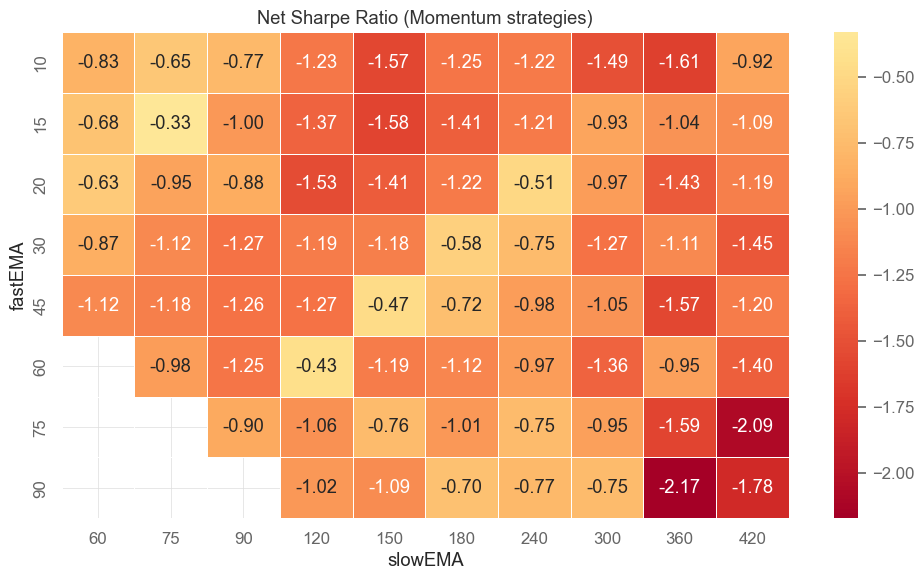

In [619]:
# we wil use it to visualize net SR values
# for the momentum strategy (MOM)

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_SR_mom',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    title = 'Net Sharpe Ratio (Momentum strategies)'
)

#Some different results

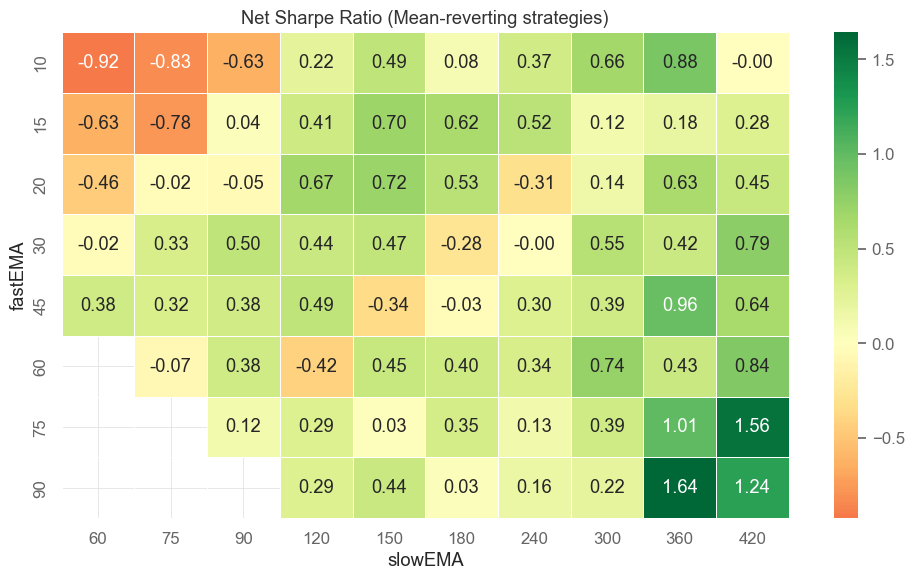

In [620]:
# we wil use it to visualize net SR values
# for the mean-reverting strategy (MR)

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_SR_mr',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    title = 'Net Sharpe Ratio (Mean-reverting strategies)'
)

#Mean-reverting on testing is better? inconsistent results with training though

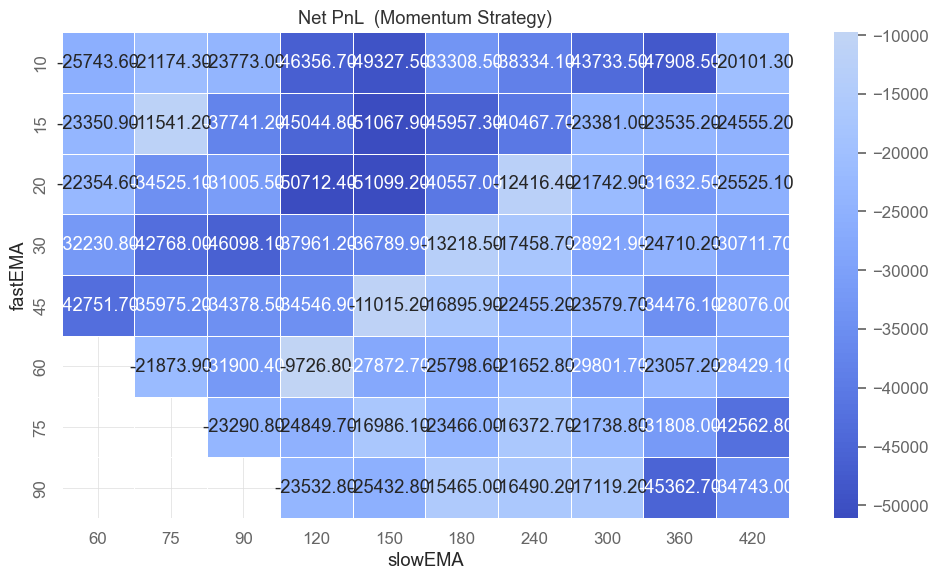

In [621]:
# How about net PnL for MOM strategy?

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_PnL_mom',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    cmap = "coolwarm",
    title = 'Net PnL  (Momentum Strategy)'
) #Different results, bottom-right corner pretty consistent (slowEMA=420 ^ fastEMA=60 as safe pick)

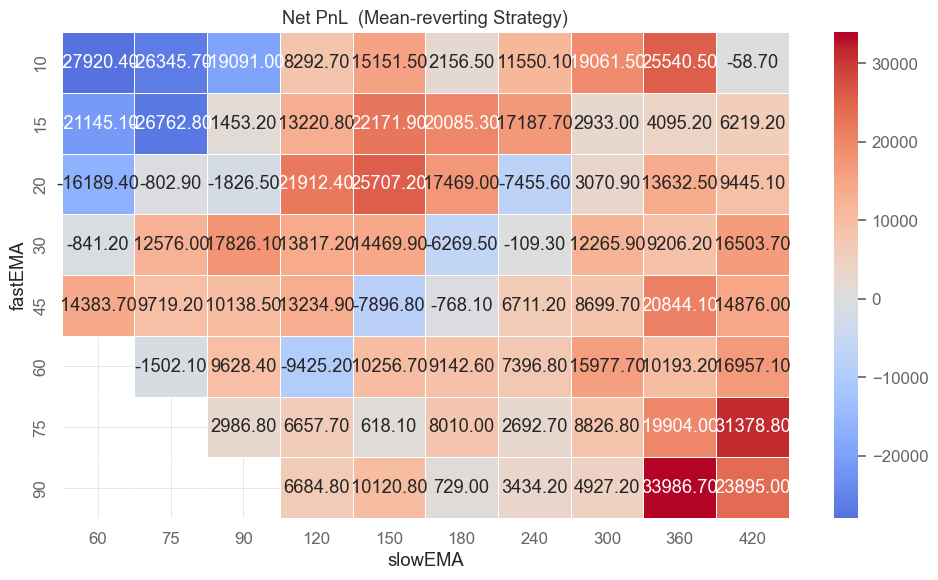

In [622]:
# How about net PnL for MR strategy?

plot_heatmap(
    summary_all_2MAs,
    value_col = 'net_PnL_mr',
    index_col = 'fastEMA',
    columns_col = 'slowEMA',
    cmap = "coolwarm",
    title = 'Net PnL  (Mean-reverting Strategy)'
) 

Strategy 2: Volatility breakout

In [623]:
# lets use fastEMA as the strategy signal
# and use slowEMA+/-m*std as volatility boundaries

#Update of sharpe ratio so it won't divide by 0
def mySR(x, scale=252):
    mu = np.nanmean(x)
    sigma = np.nanstd(x)

    if sigma == 0 or np.isnan(sigma):
        return np.nan

    return np.sqrt(scale) * mu / sigma

from functions.position_VB import positionVB

# we check various parameter combinations in a loop

signalEMA_parameters = [10, 15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [60, 90, 120, 150, 180, 200, 240, 300]
volat_sd_parameters = [60, 90, 120]
m_parameters = [1, 2, 3]

# create a dataframe to store results
summary_all_breakout = pd.DataFrame()

# loop over different parameter combinations
for signalEMA in signalEMA_parameters:
    print(f"signalEMA = {signalEMA}")
    for slowEMA in slowEMA_parameters:
        for volat_sd in volat_sd_parameters:
            for m in m_parameters:
               
                # We calculate the appropriate EMA
                signalEMA_values = SP_test.ewm(span = signalEMA).mean().to_numpy()
                slowEMA_values = SP_test.ewm(span = slowEMA).mean().to_numpy()
                                
                # We calculate the standard deviation
                volat_sd_values = SP_test.rolling(window = volat_sd).std().to_numpy()

                # Insert NaNs wherever the original price is missing
                signalEMA_values[SP_test.isna()] = np.nan
                slowEMA_values[SP_test.isna()] = np.nan 
                volat_sd_values[SP_test.isna()] = np.nan 

                # Calculate position for momentum strategy
                pos_mom = positionVB(signal = signalEMA_values, 
                                     lower = slowEMA_values - m * volat_sd_values,
                                     upper = slowEMA_values + m * volat_sd_values,
                                     pos_flat = pos_flat,
                                     strategy = "mom")
                
                pos_mr = -pos_mom 

                # Calculate gross pnl
                pnl_gross_mom = np.where(np.isnan(pos_mom * SP_test.diff()), 0, pos_mom * SP_test.diff() * 50) 
                pnl_gross_mr = np.where(np.isnan(pos_mr * SP_test.diff()), 0, pos_mr * SP_test.diff() * 50) 
                # point value for SP = 50$

                # Calculate number of transactions
                ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                # Calculate net pnl
                pnl_net_mom = pnl_gross_mom - ntrans * 12  # cost $12 per transaction on SP
                pnl_net_mr = pnl_gross_mr - ntrans * 12  # cost $12 per transaction on SP
                  
                # Aggregate to daily data
                pnl_gross_mom = pd.Series(pnl_gross_mom)
                pnl_gross_mom.index = SP_test.index.time
                pnl_gross_mom_d = pnl_gross_mom.groupby(SP_test.index.date).sum()
                pnl_gross_mr = pd.Series(pnl_gross_mr)
                pnl_gross_mr.index = SP_test.index.time
                pnl_gross_mr_d = pnl_gross_mr.groupby(SP_test.index.date).sum()

                pnl_net_mom = pd.Series(pnl_net_mom)
                pnl_net_mom.index = SP_test.index.time
                pnl_net_mom_d = pnl_net_mom.groupby(SP_test.index.date).sum()
                pnl_net_mr = pd.Series(pnl_net_mr)
                pnl_net_mr.index = SP_test.index.time
                pnl_net_mr_d = pnl_net_mr.groupby(SP_test.index.date).sum()

                ntrans = pd.Series(ntrans)
                ntrans.index = SP_test.index.time
                ntrans_d = ntrans.groupby(SP_test.index.date).sum()

                # Calculate Sharpe Ratio and PnL
                gross_SR_mom = mySR(pnl_gross_mom_d, scale=252)
                net_SR_mom = mySR(pnl_net_mom_d, scale=252)
                gross_PnL_mom = pnl_gross_mom_d.sum()
                net_PnL_mom = pnl_net_mom_d.sum()
                gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                gross_PnL_mr = pnl_gross_mr_d.sum()
                net_PnL_mr = pnl_net_mr_d.sum()

                av_daily_ntrans = ntrans_d.mean()

                # Collect the necessary results into one object
                summary = pd.DataFrame({
                    'signalEMA': signalEMA,
                    'slowEMA': slowEMA,
                    'volat_sd': volat_sd,
                    'm': m,
                    'period': '2025',
                    'gross_SR_mom': gross_SR_mom,
                    'net_SR_mom': net_SR_mom,
                    'gross_PnL_mom': gross_PnL_mom,
                    'net_PnL_mom': net_PnL_mom,
                    'gross_SR_mr': gross_SR_mr,
                    'net_SR_mr': net_SR_mr,
                    'gross_PnL_mr': gross_PnL_mr,
                    'net_PnL_mr': net_PnL_mr,
                    'av_daily_ntrans': av_daily_ntrans
                }, index=[0])

                # Append the results to the summary
                summary_all_breakout = pd.concat([summary_all_breakout, summary], ignore_index=True)

    # it takes a (smaller) while
    # approximately 5 minutes

signalEMA = 10
signalEMA = 15
signalEMA = 20
signalEMA = 30
signalEMA = 45
signalEMA = 60
signalEMA = 75
signalEMA = 90


In [624]:
# check 10 strategies with the best net_SR_mom (momentum strategies)

summary_all_breakout.sort_values(by = 'net_PnL_mom', 
                                 ascending = False).head(20) # 14K profit, different set of hyperparameters

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
3,10,60,90,1,2025,2.819531,2.485999,53573.30,47429.30,-2.819531,-3.155631,-53573.30,-59717.30,4.000000
84,15,90,90,1,2025,2.051841,1.774026,39539.55,34307.55,-2.051841,-2.331542,-39539.55,-44771.55,3.406250
0,10,60,60,1,2025,1.971669,1.566822,37395.95,29859.95,-1.971669,-2.380237,-37395.95,-44931.95,4.906250
78,15,60,120,1,2025,1.979465,1.803053,32523.20,29643.20,-1.979465,-2.156006,-32523.20,-35403.20,1.875000
87,15,90,120,1,2025,1.672734,1.424089,31683.70,27051.70,-1.672734,-1.922747,-31683.70,-36315.70,3.015625
16,10,90,120,2,2025,2.499693,2.428206,24941.90,24173.90,-2.499693,-2.570691,-24941.90,-25709.90,0.500000
12,10,90,90,1,2025,1.492029,1.154781,30377.40,23609.40,-1.492029,-1.832016,-30377.40,-37145.40,4.406250
159,20,90,120,1,2025,1.544219,1.343966,26700.20,23268.20,-1.544219,-1.744953,-26700.20,-30132.20,2.234375
168,20,120,120,1,2025,1.412452,1.193271,26918.65,22790.65,-1.412452,-1.632541,-26918.65,-31046.65,2.687500
240,30,120,120,1,2025,1.520760,1.339807,24954.70,22002.70,-1.520760,-1.701957,-24954.70,-27906.70,1.921875


In [625]:
# check 10 strategies with the best net_SR_mr (mean-reverting strategies)

summary_all_breakout.sort_values(by = 'net_PnL_mr', 
                                 ascending = False).head(20) # also pretty high profits

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
280,30,300,60,2,2025,-2.699189,-2.867957,-60649.70,-64633.70,2.699189,2.529379,60649.70,56665.70,2.593750
549,90,200,60,1,2025,-2.875663,-3.050718,-60201.95,-64065.95,2.875663,2.699472,60201.95,56337.95,2.515625
558,90,240,60,1,2025,-2.867510,-3.059076,-57585.70,-61641.70,2.867510,2.674590,57585.70,53529.70,2.640625
136,15,300,60,2,2025,-2.617047,-2.795280,-57186.85,-61266.85,2.617047,2.437693,57186.85,53106.85,2.656250
208,20,300,60,2,2025,-2.622695,-2.800744,-56978.45,-61034.45,2.622695,2.443506,56978.45,52922.45,2.640625
352,45,300,60,2,2025,-2.667480,-2.846022,-55083.80,-58947.80,2.667480,2.487825,55083.80,51219.80,2.515625
127,15,240,60,2,2025,-2.865296,-3.077504,-53147.85,-57299.85,2.865296,2.651422,53147.85,48995.85,2.703125
408,60,200,90,1,2025,-2.948220,-3.147969,-52700.95,-56444.95,2.948220,2.747177,52700.95,48956.95,2.437500
495,75,300,60,1,2025,-2.231850,-2.403926,-52743.40,-56967.40,2.231850,2.058782,52743.40,48519.40,2.750000
426,60,300,90,1,2025,-2.408560,-2.582044,-51678.30,-55566.30,2.408560,2.234000,51678.30,47790.30,2.531250


In [626]:
# summarize the results for the mom strategy
# in the form of a heatmap

# here we have four parameters
# signalEMA, slowEMA, volat_sd and m,
# so to present the results in the form of a heatmap,
# we need to combine them in pairs

summary_all_breakout["signalEMA_slowEMA"] = (
    summary_all_breakout["signalEMA"].astype(int).astype(str).str.zfill(3) + "_" +
    summary_all_breakout["slowEMA"].astype(int).astype(str).str.zfill(3)
)

summary_all_breakout["volat_sd_m"] = (
    summary_all_breakout["volat_sd"].astype(int).astype(str).str.zfill(3) + "_" +
    summary_all_breakout["m"].astype(str)
)

summary_all_breakout.head()

,signalEMA,slowEMA,volat_sd,m,period,gross_SR_mom,net_SR_mom,gross_PnL_mom,net_PnL_mom,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans,signalEMA_slowEMA,volat_sd_m
0,10,60,60,1,2025,1.971669,1.566822,37395.95,29859.95,-1.971669,-2.380237,-37395.95,-44931.95,4.906250,010_060,060_1
1,10,60,60,2,2025,-2.130601,-2.226883,-9729.00,-10233.00,2.130601,2.032611,9729.00,9225.00,0.328125,010_060,060_2
2,10,60,60,3,2025,NaN,-3.520432,0.00,-144.00,NaN,-3.520432,0.00,-144.00,0.093750,010_060,060_3
3,10,60,90,1,2025,2.819531,2.485999,53573.30,47429.30,-2.819531,-3.155631,-53573.30,-59717.30,4.000000,010_060,090_1
4,10,60,90,2,2025,1.721643,1.672990,6504.55,6288.55,-1.721643,-1.769548,-6504.55,-6720.55,0.140625,010_060,090_2


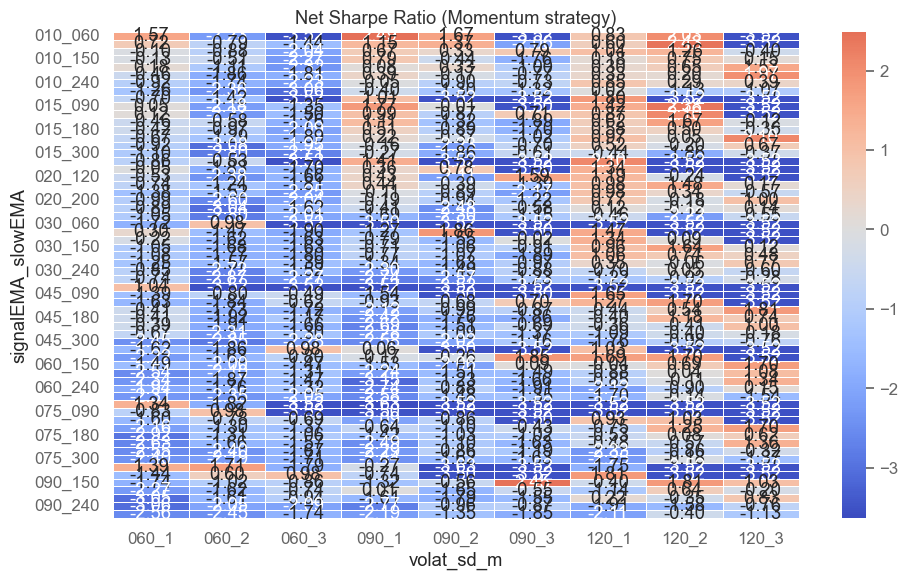

In [627]:
# now we can plot the heatmap
plot_heatmap(
    summary_all_breakout,
    value_col = 'net_SR_mom',
    index_col = 'signalEMA_slowEMA',
    columns_col = 'volat_sd_m',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

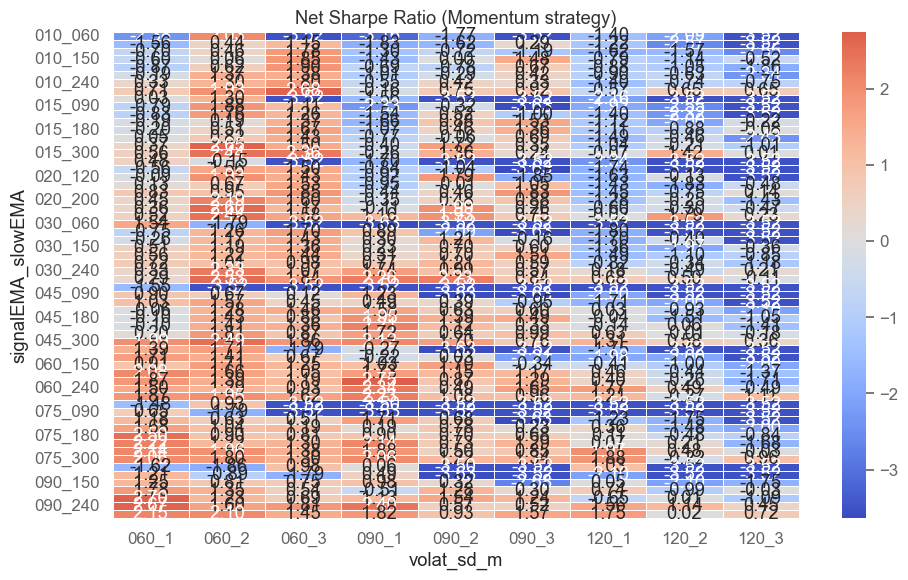

In [628]:
# now we can plot the heatmap
plot_heatmap(
    summary_all_breakout,
    value_col = 'net_SR_mr',
    index_col = 'signalEMA_slowEMA',
    columns_col = 'volat_sd_m',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

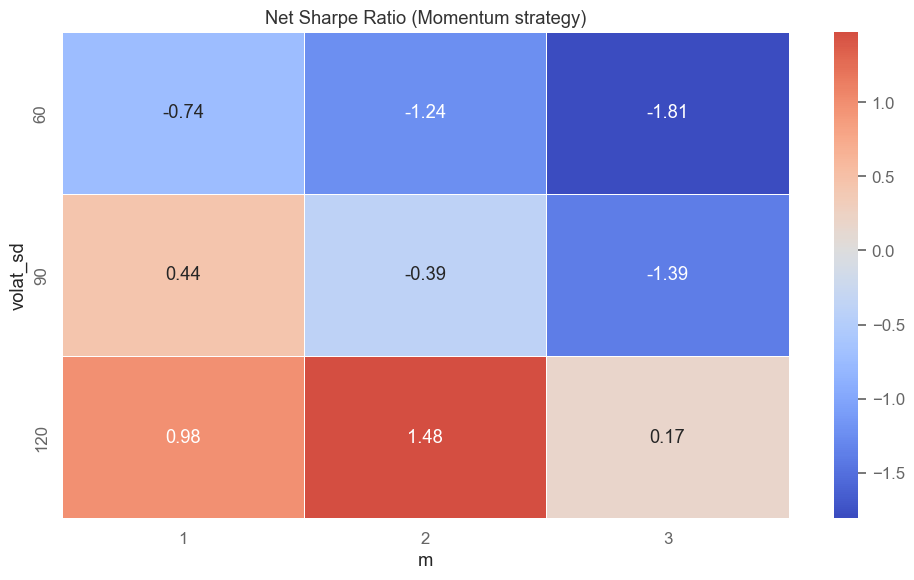

In [629]:
# let's check the sensitivity analysis of SR to m and volat_sd

# we select only rows with values of signalEMA and slowEMA
summary_all_breakout_wybrane = summary_all_breakout[
    (summary_all_breakout['signalEMA'] == 20) & (summary_all_breakout['slowEMA'] == 150)
]

# and we create a heatmap for them
plot_heatmap(
    summary_all_breakout_wybrane,
    value_col = 'net_SR_mom',
    index_col = 'volat_sd',
    columns_col = 'm',
    title = 'Net Sharpe Ratio (Momentum strategy)',
    cmap = "coolwarm"
)

# not with all paramet3ers, but still some positive values

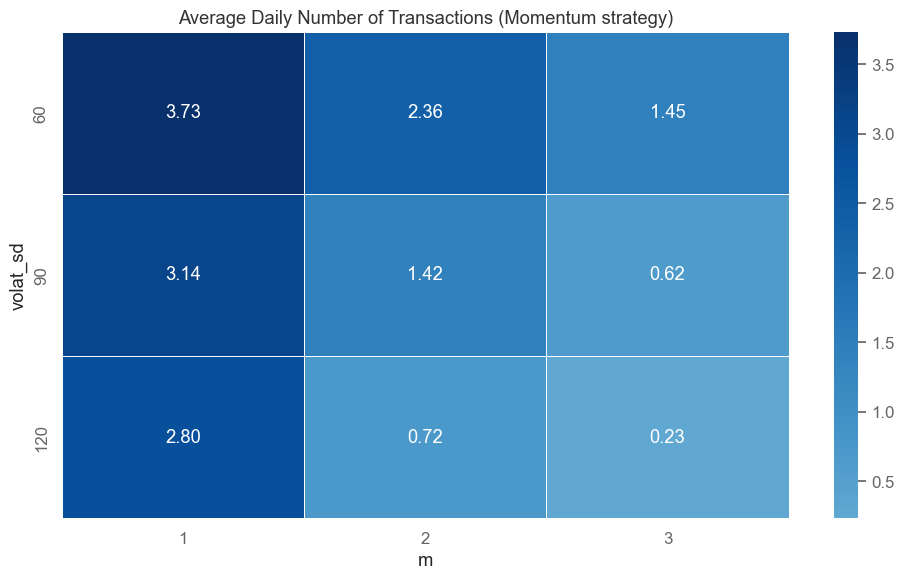

In [630]:
# heatmap plot can also be used to analyze transaction frequency

plot_heatmap(
    summary_all_breakout_wybrane,
    value_col = 'av_daily_ntrans',
    index_col = 'volat_sd',
    columns_col = 'm',
    title = 'Average Daily Number of Transactions (Momentum strategy)',
    cmap = "Blues")

    # in line with expectations
    # the larger the m, the fewer the transactions

## PAIR TRADING STRATEGIES (DOKOŃCZYĆ)

## FINAL STARTEGY APPLICATION AND ANALYSIS

In [ ]:
#Gotowiec od Wójcika, tu wsadzasz najlepszy model i przepuszczasz

In [ ]:
# Simple Strategy proposal #1 (single assets strategy): 
# momentum based on volatility breakout model
# NQ Futures strategy hyperparameters: fast EMA10, slow EMA120, volat_std=120, m=2
# SP Futures strategy hyperparameters:fast EMA20, slow EMA150, volat_std=120, m=1

In [634]:
# Loading the data

quarters = ['2023_Q1', '2023_Q3', '2023_Q4',
            '2024_Q2', '2024_Q4',
            '2025_Q1', '2025_Q2']

# create an empty DataFrame to store summary for all quarters
summary_data1_all_quarters = pd.DataFrame()

In [635]:
#Application of customized function
def run_volatility_breakout(
    price,
    fast_span,
    slow_span,
    vol_window,
    m,
    pos_flat,
    point_value
):
    # EMAs
    fast = price.ewm(span=fast_span).mean()
    slow = price.ewm(span=slow_span).mean()

    # Volatility
    vol = price.rolling(vol_window).std()

    # NaN handling
    fast[price.isna()] = np.nan
    slow[price.isna()] = np.nan
    vol[price.isna()] = np.nan

    # Positions
    pos = positionVB(
        signal=fast.to_numpy(),
        lower=(slow - m * vol).to_numpy(),
        upper=(slow + m * vol).to_numpy(),
        pos_flat=pos_flat,
        strategy="mom"
    )

    # PnL
    pnl_gross = np.where(
        np.isnan(pos * price.diff()),
        0,
        pos * price.diff() * point_value
    )

    ntrans = np.abs(np.diff(pos, prepend=0))
    pnl_net = pnl_gross - ntrans * 12

    return pnl_gross, pnl_net, ntrans


In [636]:
def plot_total_net_pnl(pnl_net_dict, symbol):
    pnl_all = pd.concat(pnl_net_dict.values()).sort_index()

    plt.figure(figsize=(12, 6))
    plt.plot(pnl_all.cumsum(), linewidth=2)

    plt.title(f'Cumulative Net PnL – {symbol} (All Quarters)')
    plt.xlabel('Date')
    plt.ylabel('PnL [$]')
    plt.grid(True)

    plt.show()


In [637]:
def volatility_breakout_position(signal, slow, vol, m, pos_flat):
    upper = slow + m * vol
    lower = slow - m * vol

    sig_lag = signal.shift(1)
    upper_lag = upper.shift(1)
    lower_lag = lower.shift(1)

    pos = np.where(
        sig_lag.notna() & upper_lag.notna() & lower_lag.notna(),
        np.where(sig_lag > upper_lag, 1,
        np.where(sig_lag < lower_lag, -1, 0)),
        np.nan
    )

    pos[pos_flat == 1] = 0
    return pos


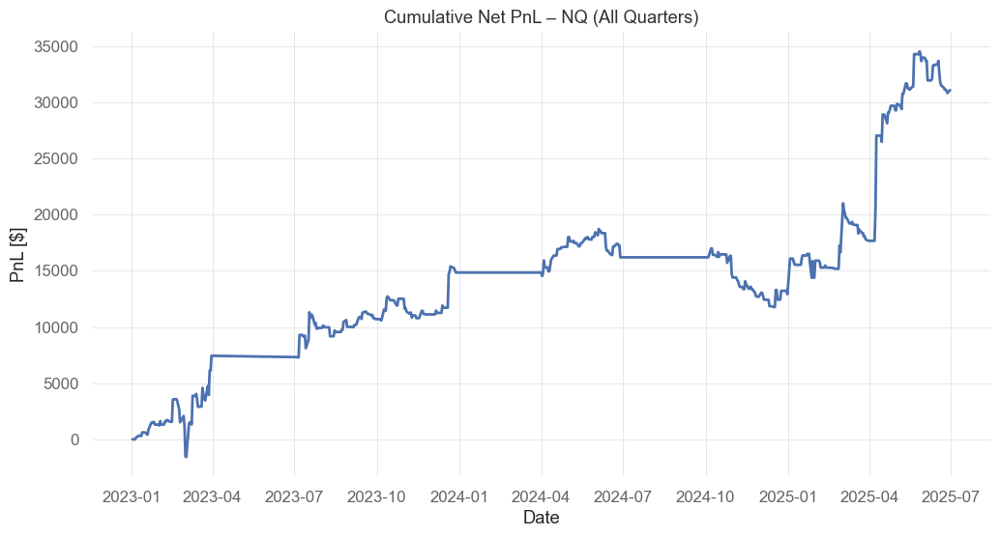

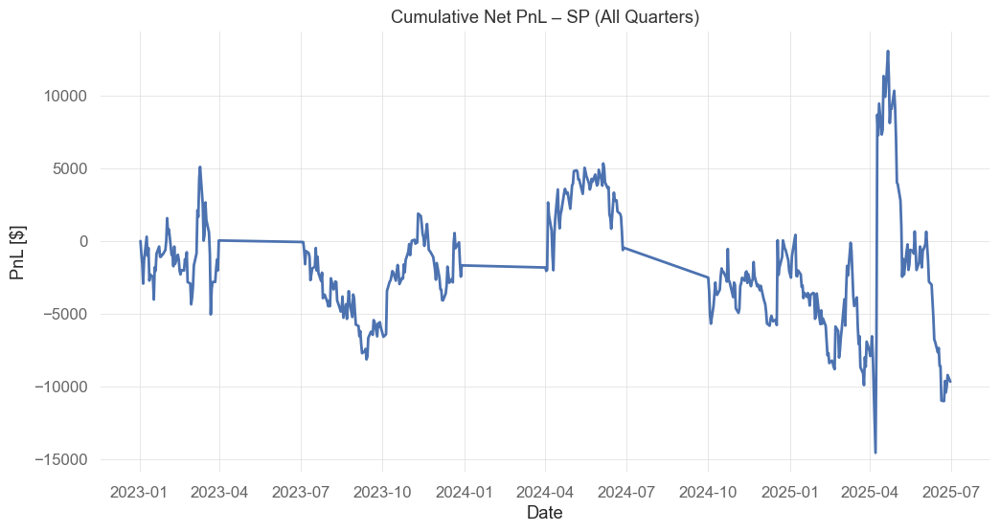

In [638]:
pnl_net_store_NQ = {}
pnl_net_store_SP = {}
summary_data1_all_quarters = pd.DataFrame()

for quarter in quarters:

    data1 = pd.read_parquet(f'data/data1_{quarter}.parquet')
    data1.set_index('datetime', inplace=True)

    # ---------------- Assumption 1 ----------------
    data1.loc[data1.between_time("9:31", "9:40").index] = np.nan
    data1.loc[data1.between_time("15:51", "16:00").index] = np.nan

    # ---------------- Assumption 2 ----------------
    pos_flat = np.zeros(len(data1))
    pos_flat[data1.index.time <= pd.to_datetime("9:55").time()] = 1
    pos_flat[data1.index.time >= pd.to_datetime("15:40").time()] = 1

    # ==================================================
    # ===================== NQ =========================
    # ==================================================
    signalEMA_NQ = data1["NQ"].ewm(span=10).mean()
    slowEMA_NQ   = data1["NQ"].ewm(span=120).mean()
    vol_NQ       = data1["NQ"].rolling(120).std()

    pos_mom_NQ = volatility_breakout_position(
        signalEMA_NQ, slowEMA_NQ, vol_NQ, m=2, pos_flat=pos_flat
    )

    price_diff_NQ = data1["NQ"].diff()
    pnl_gross_NQ = np.nan_to_num(pos_mom_NQ * price_diff_NQ * 20)

    ntrans_NQ = np.abs(np.diff(np.nan_to_num(pos_mom_NQ), prepend=0))
    pnl_net_NQ = pnl_gross_NQ - ntrans_NQ * 12

    pnl_net_d_NQ = pd.Series(pnl_net_NQ, index=data1.index).groupby(data1.index.date).sum()
    ntrans_d_NQ  = pd.Series(ntrans_NQ, index=data1.index).groupby(data1.index.date).sum()

    net_SR_NQ  = mySR(pnl_net_d_NQ)
    net_PnL_NQ = pnl_net_d_NQ.sum()
    av_tr_NQ   = ntrans_d_NQ.mean()
    stat_NQ    = (net_SR_NQ - 0.5) * np.maximum(0, np.log(np.abs(net_PnL_NQ / 1000)))

    pnl_net_store_NQ[quarter] = pnl_net_d_NQ

    # ==================================================
    # ===================== SP =========================
    # ==================================================
    signalEMA_SP = data1["SP"].ewm(span=20).mean()
    slowEMA_SP   = data1["SP"].ewm(span=150).mean()
    vol_SP       = data1["SP"].rolling(60).std()

    pos_mom_SP = volatility_breakout_position(
        signalEMA_SP, slowEMA_SP, vol_SP, m=1, pos_flat=pos_flat
    )

    price_diff_SP = data1["SP"].diff()
    pnl_gross_SP = np.nan_to_num(pos_mom_SP * price_diff_SP * 50)

    ntrans_SP = np.abs(np.diff(np.nan_to_num(pos_mom_SP), prepend=0))
    pnl_net_SP = pnl_gross_SP - ntrans_SP * 12

    pnl_net_d_SP = pd.Series(pnl_net_SP, index=data1.index).groupby(data1.index.date).sum()
    ntrans_d_SP  = pd.Series(ntrans_SP, index=data1.index).groupby(data1.index.date).sum()

    net_SR_SP  = mySR(pnl_net_d_SP)
    net_PnL_SP = pnl_net_d_SP.sum()
    av_tr_SP   = ntrans_d_SP.mean()
    stat_SP    = (net_SR_SP - 0.5) * np.maximum(0, np.log(np.abs(net_PnL_SP / 1000)))

    pnl_net_store_SP[quarter] = pnl_net_d_SP

    # ---------------- Summary ----------------
    summary_data1_all_quarters = pd.concat([
        summary_data1_all_quarters,
        pd.DataFrame({
            "quarter": quarter,
            "net_SR_NQ": net_SR_NQ,
            "net_PnL_NQ": net_PnL_NQ,
            "av_daily_ntrans_NQ": av_tr_NQ,
            "stat_NQ": stat_NQ,
            "net_SR_SP": net_SR_SP,
            "net_PnL_SP": net_PnL_SP,
            "av_daily_ntrans_SP": av_tr_SP,
            "stat_SP": stat_SP
        }, index=[0])
    ], ignore_index=True)
    
plot_total_net_pnl(pnl_net_store_NQ, "NQ")
plot_total_net_pnl(pnl_net_store_SP, "SP")


In [639]:
summary_data1_all_quarters

,quarter,net_SR_NQ,net_PnL_NQ,av_daily_ntrans_NQ,stat_NQ,net_SR_SP,net_PnL_SP,av_daily_ntrans_SP,stat_SP
0,2023_Q1,2.257976,7437.80,2.123077,3.527510,0.006065,32.90,6.738462,-0.000000
1,2023_Q3,1.614366,3269.56,1.846154,1.320139,-1.816957,-5953.40,6.615385,-4.133365
2,2023_Q4,2.170077,4137.68,1.312500,2.371735,1.261657,4240.45,6.125000,1.100342
3,2024_Q2,0.919894,1356.44,1.661538,0.128010,0.282301,1215.75,6.338462,-0.042530
4,2024_Q4,-1.990160,-3283.20,1.784615,-2.960349,-0.353976,-1613.35,6.492308,-0.408468
5,2025_Q1,1.449279,4748.68,1.523810,1.478850,-1.163732,-5434.05,6.539683,-2.816174
6,2025_Q2,3.036077,13413.04,1.723077,6.584232,-0.195363,-2164.45,6.307692,-0.536936


In [640]:
total_net_pnl_nq = summary_data1_all_quarters['net_PnL_NQ'].sum()
total_net_pnl_nq

np.float64(31080.00000000032)

In [ ]:
total_net_pnl_sp = summary_data1_all_quarters['net_PnL_SP'].sum()
total_net_pnl_sp #może tutaj powinniśmy dać mean reverting? (jak na razie samo granie na tym "zaburza", może w pair strategy)

np.float64(-9676.149999998861)

In [ ]:
# Simple Strategy proposal #2 (pair-tradingstrategy): 